In [ ]:
!pip install virtualenv

In [ ]:
import virtualenv
import subprocess
import os
import sys

notebook_name = "simple_strategies"
virtualenv.cli_run(["venvs/" + notebook_name, "--no-download"])

venv_dir = "venvs/" + notebook_name
python_path = os.path.join(venv_dir, "bin", "python")
display_name = "Python (" + notebook_name + ")"
kernel_name = notebook_name

# Установка ipykernel в venv
subprocess.check_call([os.path.join(venv_dir, "bin", "pip"), "install", "ipykernel"])

# Регистрация ядра
subprocess.check_call([
    python_path, "-m", "ipykernel", "install",
    "--user",
    "--name", kernel_name,
    "--display-name", display_name
])

In [1]:
import sys
print(sys.executable)

/workspace/predictors/univariate/venvs/simple_strategies/bin/python


In [ ]:
import subprocess
import os
import sys

# Путь к pip в активном ядре
pip_path = os.path.join(sys.prefix, "bin", "pip")

# Установка
subprocess.check_call([pip_path, "install", "etna[all]", "pandas", "matplotlib", "tensorflow"])

In [98]:
import warnings
warnings.filterwarnings('ignore')

from datetime import datetime
import pandas as pd
from math import floor
import numpy as np
import os
from pathlib import Path
import time

# ETNA
from etna.datasets import TSDataset
from etna.models import NaiveModel
from etna.metrics import MAE, MAPE, RMSE, SMAPE
from etna.analysis import plot_forecast
from etna.models import (
    MovingAverageModel,
    AutoARIMAModel,
    TBATSModel,
    HoltWintersModel,
    StatsForecastARIMAModel,
    StatsForecastAutoThetaModel
)
from etna.models.nn import RNNModel

from etna.models import NonPredictionIntervalContextIgnorantAbstractModel

# Статистические тесты и преобразования
from statsmodels.tsa.stattools import adfuller
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

from scipy.stats import boxcox, boxcox_normmax
from scipy.stats import ttest_1samp, wilcoxon

from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import MinMaxScaler, StandardScaler

from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, SimpleRNN, Dense, LSTM
from tensorflow.keras.optimizers import RMSprop, Adam

# Визуализация
import matplotlib.pyplot as plt
import seaborn as sns

# Установим читаемый формат для вывода чисел
pd.options.display.float_format = '{:.3f}'.format

In [2]:
def directional_accuracy(actual, predicted):
    """
    Calculates Directional Accuracy by comparing each predicted value's
    direction with the actual value's direction.
    """
    actual_direction = np.sign(actual - np.roll(actual, 1))  # Direction of actual values
    predicted_direction = np.sign(predicted - np.roll(predicted, 1))  # Direction of predictions

    # Ignore the first element (due to np.roll)
    actual_direction[0] = np.nan
    predicted_direction[0] = np.nan

    # Calculate accuracy for elements where both actual and predicted directions are not NaN
    mask = ~np.isnasn(actual_direction) & ~np.isnan(predicted_direction)

    return np.mean(actual_direction[mask] == predicted_direction[mask]) * 100

# Загрузка данных

In [67]:
def load_series_map(series_dir="../../data/series"):
    series_map = {}
    series_path = Path(series_dir)
    if not series_path.exists():
        raise FileNotFoundError(f"Папка не найдена: {series_dir}")
    for csv_file in series_path.glob("*.csv"):
        ticker = csv_file.stem.upper()
        df = pd.read_csv(csv_file)
        if "timestamp" not in df.columns or "close" not in df.columns:
            raise ValueError(f"{csv_file.name} не содержит 'timestamp' или 'close'")
        df["timestamp"] = pd.to_datetime(df["timestamp"], utc=True)
        df = df[["timestamp", "close"]].sort_values("timestamp").reset_index(drop=True)
        series_map[ticker] = df
    return series_map

In [68]:
series_map = load_series_map("../../data/series")

In [69]:
series = {}
for ticker, df in series_map.items():
    tmp = df.copy()
    tmp["timestamp"] = pd.to_datetime(tmp["timestamp"], utc=True)
    tmp = tmp.rename(columns={"close": "target"})
    tmp["segment"] = ticker
    tmp = tmp[["timestamp", "segment", "target"]]

    # 1) Сначала вручную реиндексируем по business-day (freq="B") и заполним пропуски ffill→bfill
    tmp = tmp.set_index("timestamp")
    all_biz = pd.date_range(start=tmp.index.min(), end=tmp.index.max(), freq="B", tz="UTC")
    tmp = tmp.reindex(all_biz)
    tmp["target"] = tmp["target"].ffill().bfill()
    tmp = tmp.reset_index().rename(columns={"index": "timestamp"})
    tmp["segment"] = ticker

    # 2) Строим одно-сегментный TSDataset с freq="B"
    ts = TSDataset(tmp, freq="B")

    # 3) Разбиваем 95% / 5% по количеству точек
    n_points = df.shape[0]
    train_size = int(n_points * 0.95)
    test_size = n_points - train_size

    train_ts, test_ts = ts.train_test_split(test_size=test_size)

    # Проверим, что в конце train нет NaN
    df_train_flat = train_ts.to_pandas(flatten=True)
    last_val = df_train_flat.iloc[-1]['target']
    assert not pd.isna(last_val), f"NaN в последнем значении train для {ticker}"

    series[ticker] = (ts, train_ts, test_ts)

# Простые модели

## Native Repeat

In [52]:
class NativeRepeatModel(NonPredictionIntervalContextIgnorantAbstractModel):
    """
    Кастомная наивная модель:
      - При fit(train_ts) сохраняет последнее значение target из train_ts.
      - При forecast(test_ts, prediction_size) строит прогноз:
          preds[0] = last_train_value,
          preds[i] = actual_test_target[i-1] для i >= 1,
        и обязательно возвращает TSDataset с тем же индексом timestamp, что и test_ts.
    """

    def __init__(self):
        super().__init__()
        self.last_value = None
        self._freq = None
        self.segment = None

    def fit(self, ts: TSDataset) -> None:
        """
        ts — это train-часть (одно-сегментный TSDataset).
        Сохраняем последнее значение target и freq.
        """
        self._freq = ts.freq
        df_flat = ts.to_pandas(flatten=True)
        self.segment = ts.segments[0]
        # Берём последнее значение из train
        self.last_value = df_flat["target"].iloc[-1]

    def forecast(self, ts: TSDataset, prediction_size: int) -> TSDataset:
        """
        ts — это test-часть (одно-сегментный TSDataset).
        prediction_size можно игнорировать, потому что ts уже содержит
        нужные timestamps теста.
        """
        # Извлекаем список тестовых timestamp из ts.df.index
        # ts.df имеет MultiIndex (timestamp, segment) в старших версиях ETNA,
        # а в новых — index = timestamp, columns = (segment, feature). 
        # Чтобы корректно взять индексы, приведем ts.to_pandas(flatten=True):
        df_test_flat = ts.to_pandas(flatten=True).reset_index()
        test_timestamps = df_test_flat["timestamp"].tolist()

        # Real test values (на случай, если prediction_size > 1)
        actual_test_values = df_test_flat["target"].values
        n_test = len(actual_test_values)

        # Собираем массив preds:
        preds = [self.last_value]
        if n_test > 1:
            shifted = actual_test_values[:-1].tolist()
            preds.extend(shifted)

        # Построим DataFrame прогноза, используя точно те же timestamps и segment
        df_forecast = pd.DataFrame({
            "timestamp": test_timestamps,
            "target": preds,
            "segment": self.segment
        })

        # Возвращаем одно-сегментный TSDataset с тем же freq
        return TSDataset(df=df_forecast, freq=self._freq)

    def predict(self, ts: TSDataset, prediction_size: int) -> TSDataset:
        # Просто проксируем в forecast
        return self.forecast(ts, prediction_size)

    def get_model(self) -> str:
        return "NativeRepeatModel"

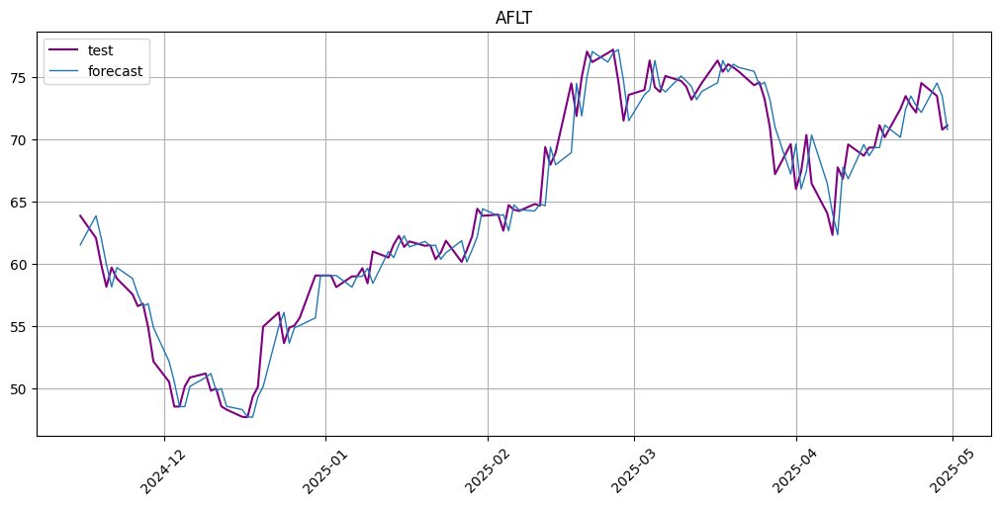

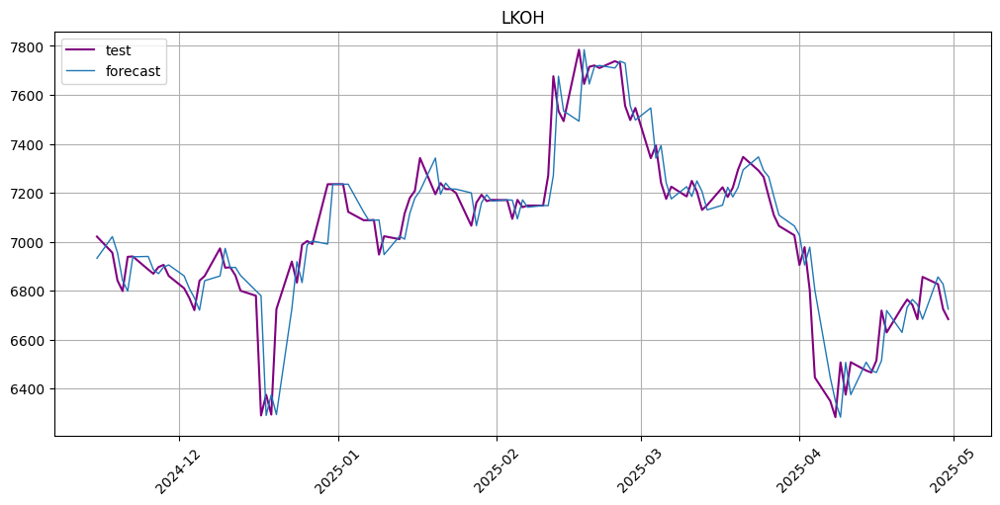

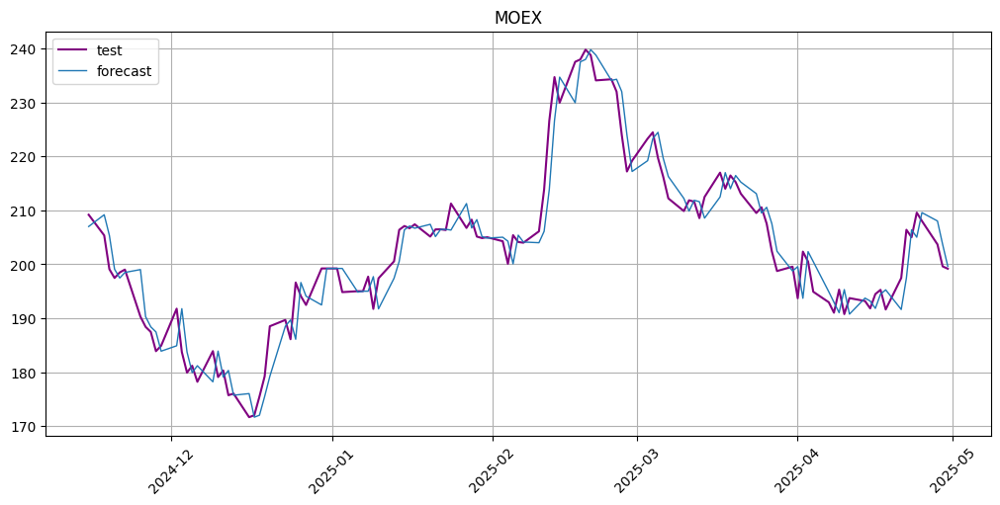

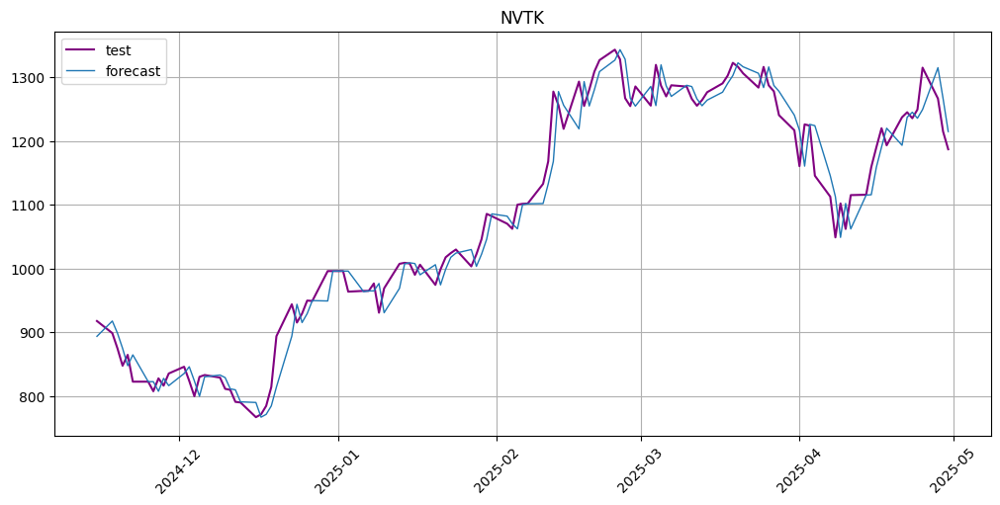

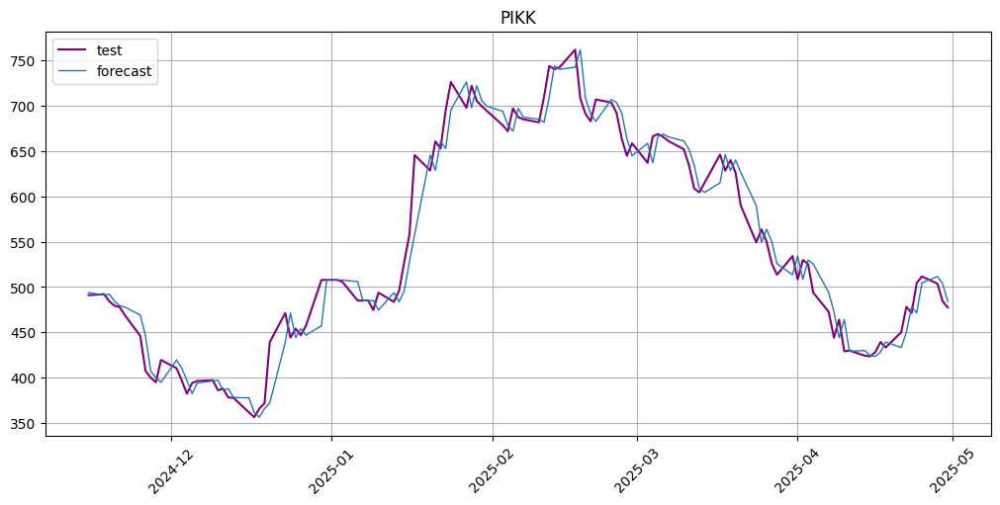

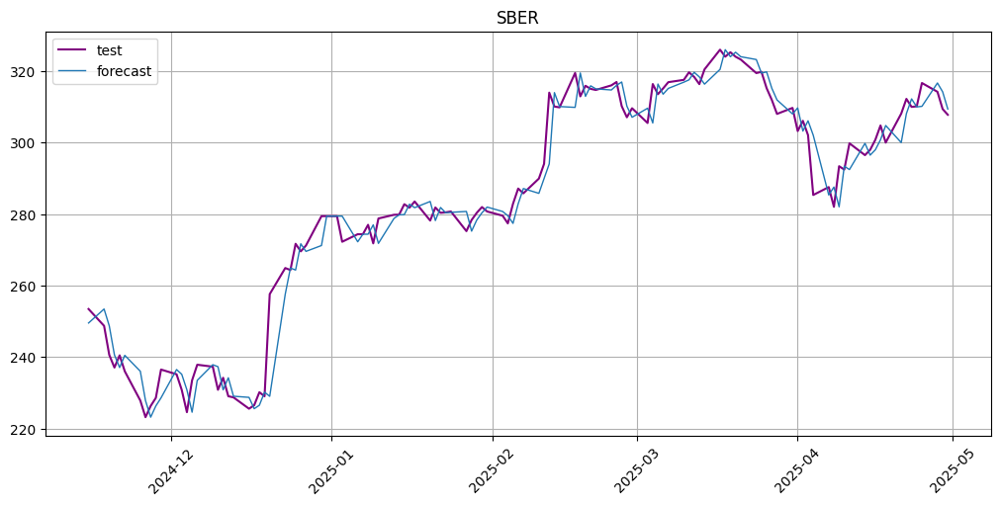

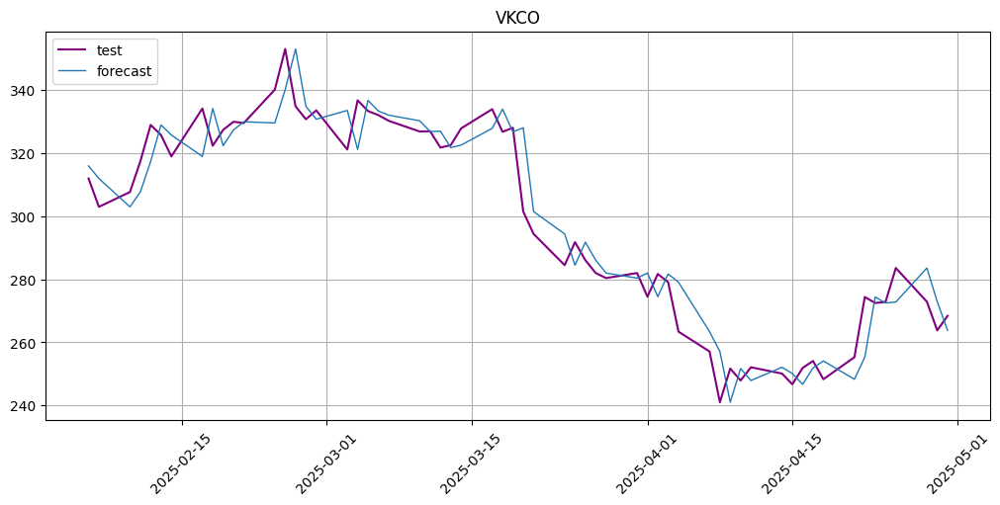

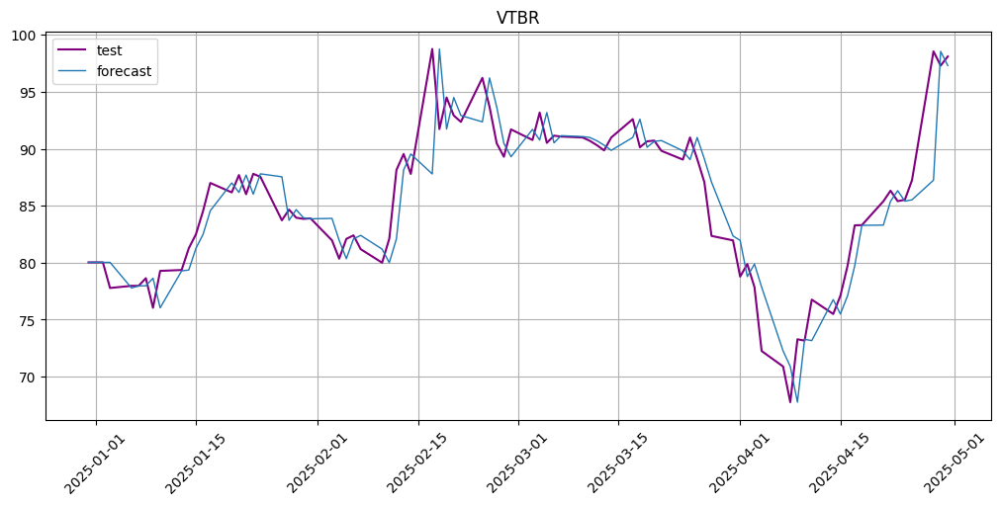

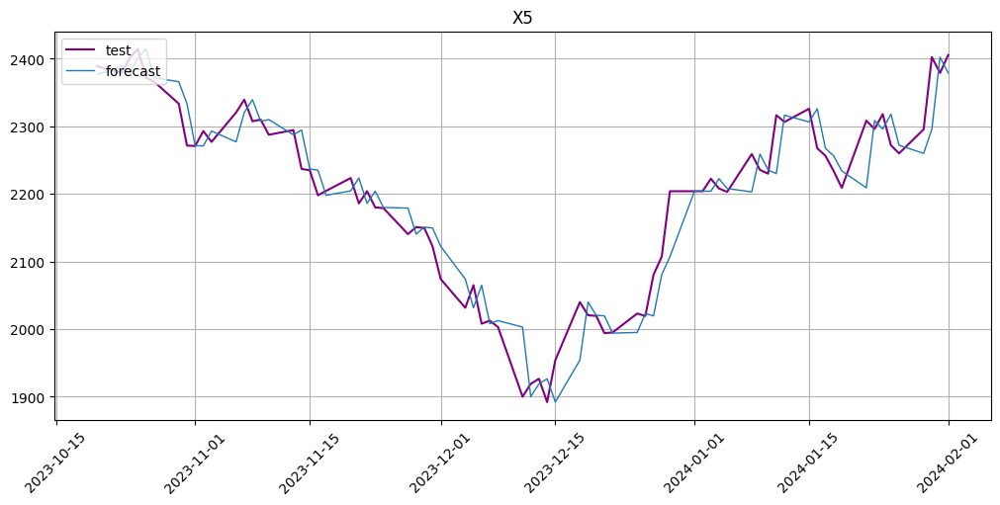

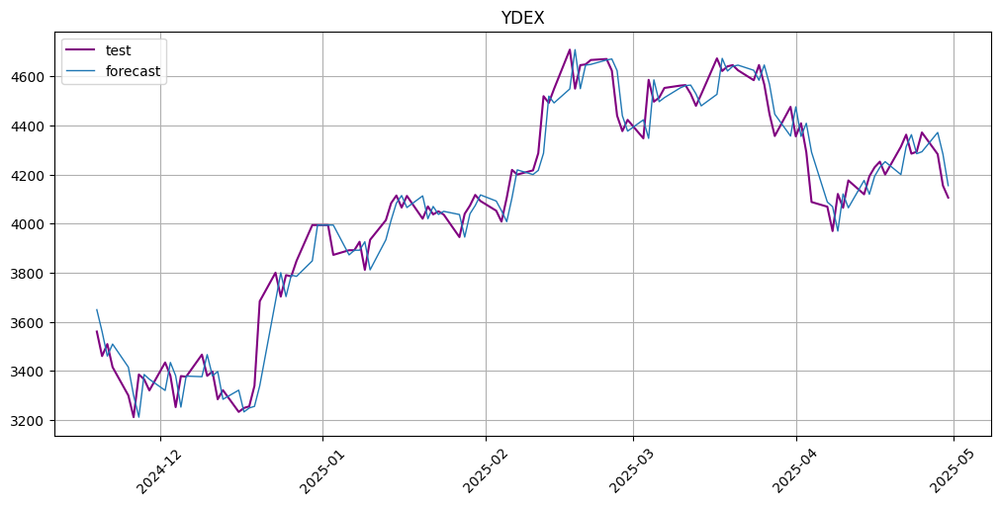

In [53]:
# Словари для хранения результатов
results_map = {}

for ticker, (ts, train_ts, test_ts) in series.items():
    #print(f"\n--- Тикер {ticker} ---")
    
    # 1) Инициализируем модель
    model = NativeRepeatModel()

    # 2) Обучаем кастомную модель и выполняем прогноз на test_size точек и замеряем время
    df_test = test_ts.to_pandas(flatten=False)
    test_size = df_test.shape[0]
    
    start_time = time.time()
    model.fit(train_ts)
    forecast_ts = model.forecast(ts=test_ts, prediction_size=test_size)
    end_time = time.time()
    forecast_time = ((end_time - start_time) / test_size) * 1000 # Время в секундах на один прогноз
    
    # 3) Собираем прогноз и реальные значения в pandas.Series
    df_pred = forecast_ts.to_pandas(flatten=True)
    df_true = test_ts.to_pandas(flatten=True)
    
    y_true = df_true["target"].values
    y_pred = df_pred["target"].values

    # 4) Считаем метрики
    mae_v   = MAE()(test_ts, forecast_ts)
    mape_v  = MAPE()(test_ts, forecast_ts)
    rmse_v  = RMSE()(test_ts, forecast_ts)
    smape_v = SMAPE()(test_ts, forecast_ts)
    da_v = directional_accuracy(y_true, y_pred)
    
    # 5) Сохраняем метрики и прогноз
    results_map[ticker] = {
        "MAE": mae_v[ticker],
        "MAPE (%)": mape_v[ticker],
        "RMSE": rmse_v[ticker],
        "SMAPE (%)": smape_v[ticker],
        "DA (%)": da_v,
        "Forecast time (s)": forecast_time
    }
    
    plot_forecast(forecast_ts, test_ts)

In [54]:
# 7) Собираем сводную таблицу метрик
metrics_df = pd.DataFrame.from_dict(results_map, orient="index")
metrics_df.loc["AVERAGE"] = metrics_df.mean(numeric_only=True)
metrics_df = metrics_df.round(3)

print("\n=== Итоговая таблица метрик ===")
display(metrics_df)


=== Итоговая таблица метрик ===


,MAE,MAPE (%),RMSE,SMAPE (%),DA (%),Forecast time (s)
AFLT,1.374,2.134,1.802,2.140,38.983,0.240
LKOH,81.029,1.163,118.324,1.163,41.525,0.147
MOEX,3.245,1.606,4.161,1.608,42.373,0.142
NVTK,24.808,2.286,31.931,2.294,52.542,0.135
PIKK,16.106,2.983,21.560,2.998,49.153,0.133
SBER,3.872,1.396,5.504,1.403,40.678,0.133
VKCO,6.943,2.354,8.772,2.346,40.678,0.203
VTBR,1.884,2.200,2.765,2.214,44.186,0.160
X5,28.760,1.317,38.887,1.320,40.541,0.176
YDEX,71.786,1.794,91.462,1.799,40.517,0.134


## Simple Moving Average

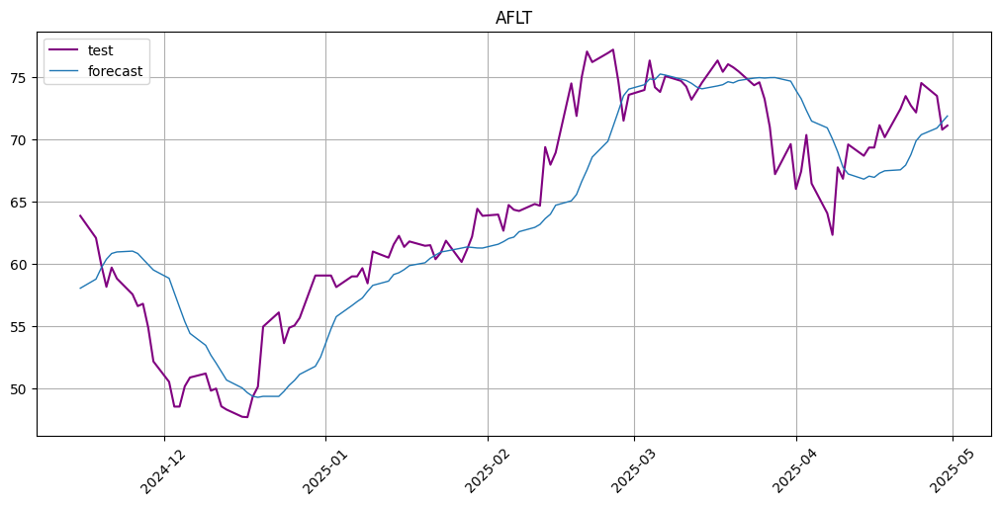

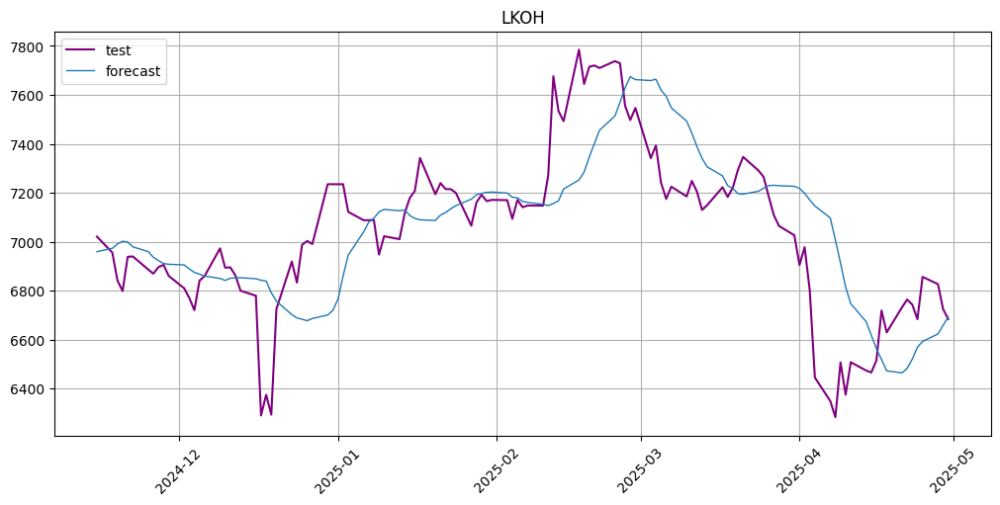

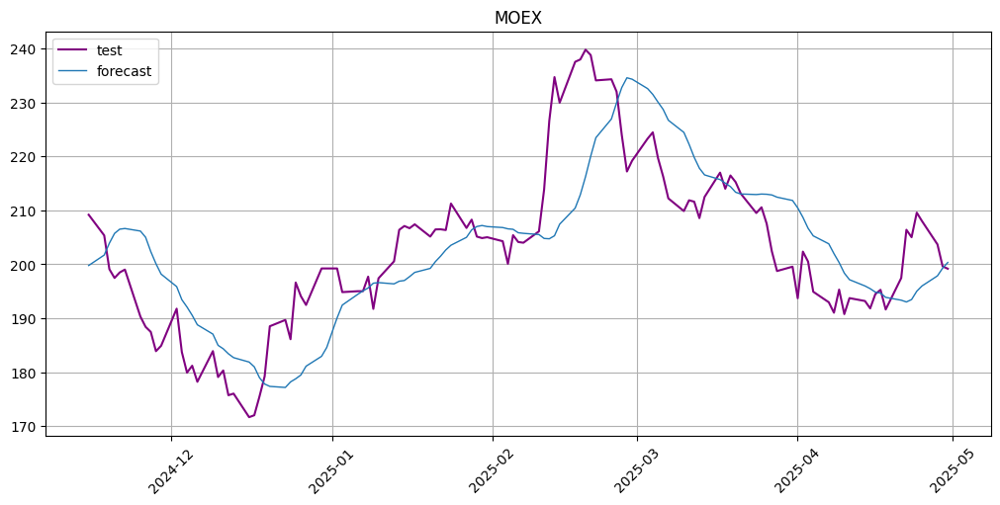

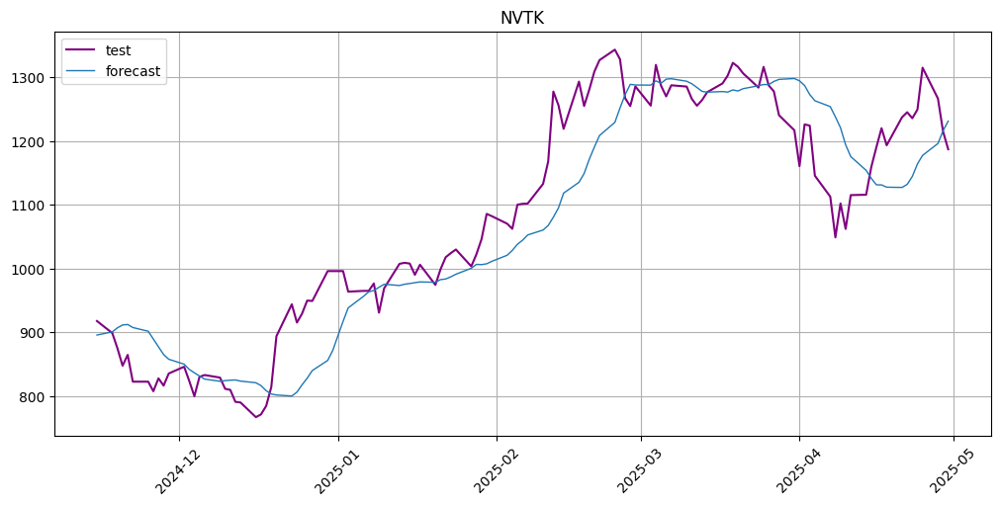

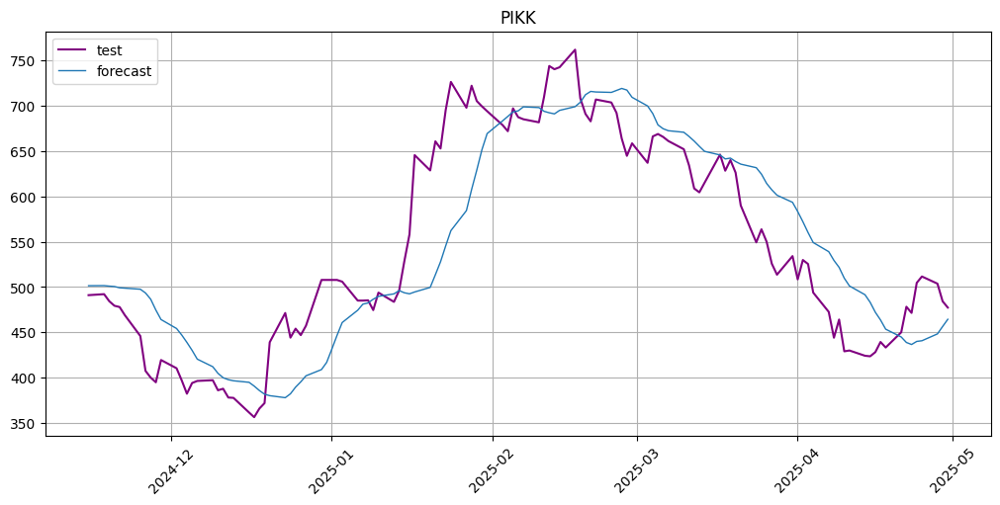

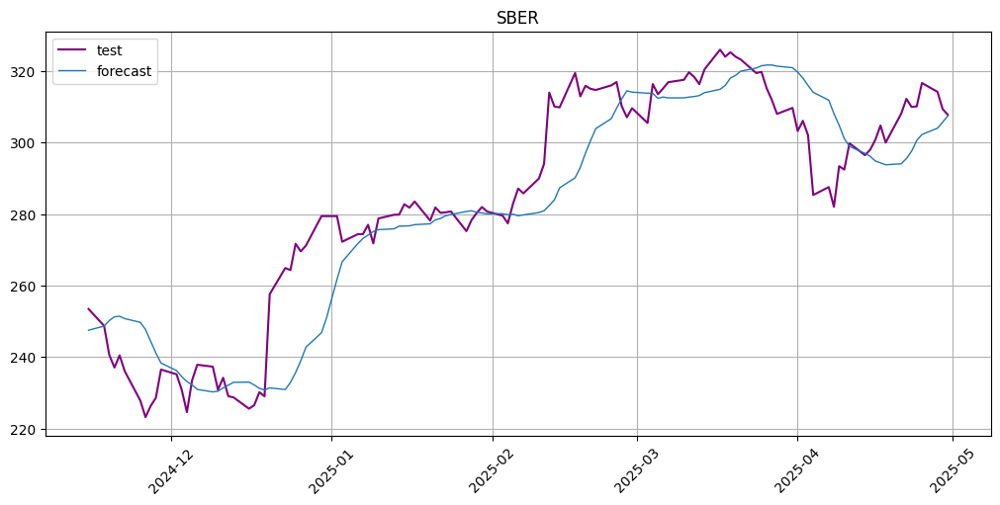

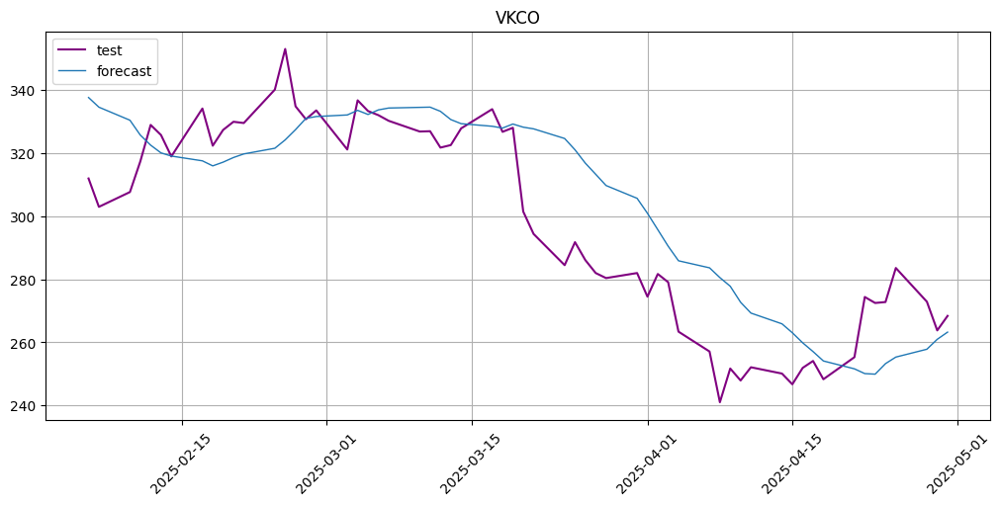

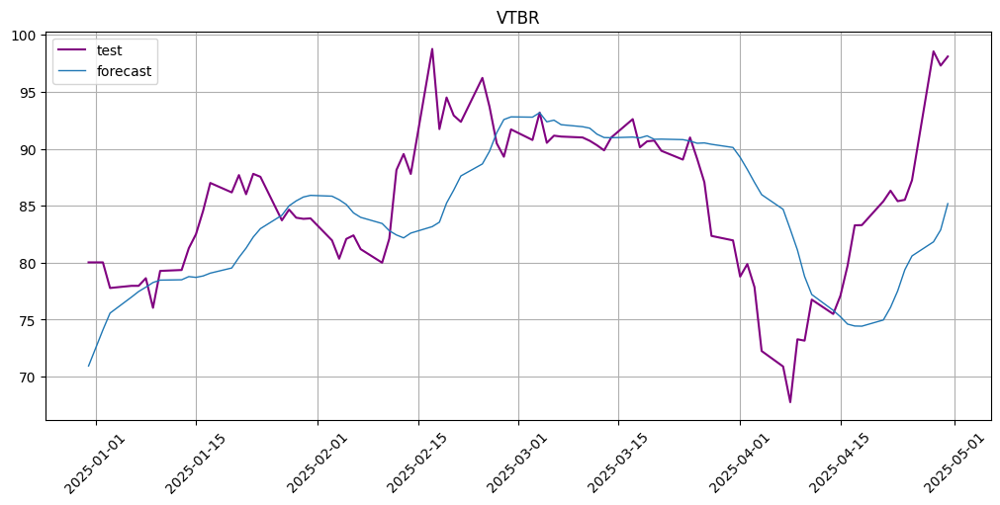

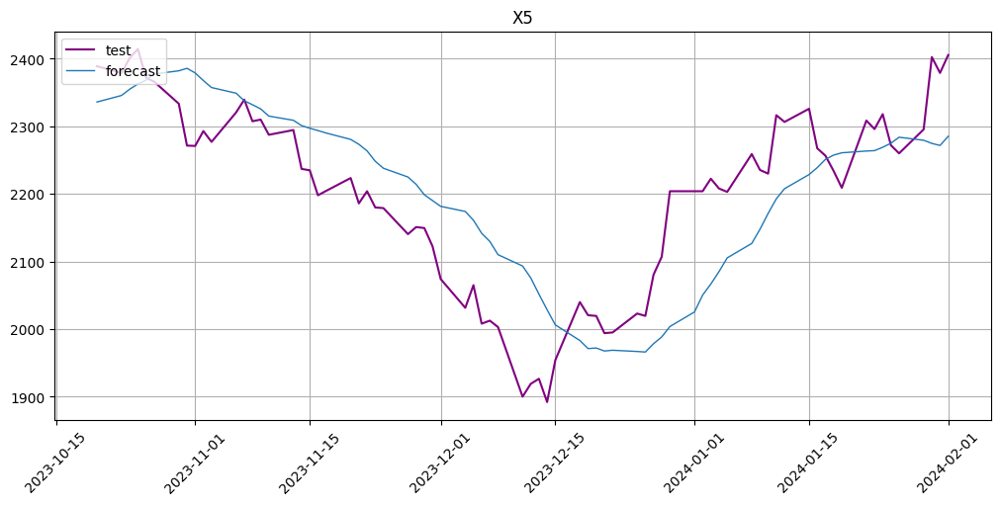

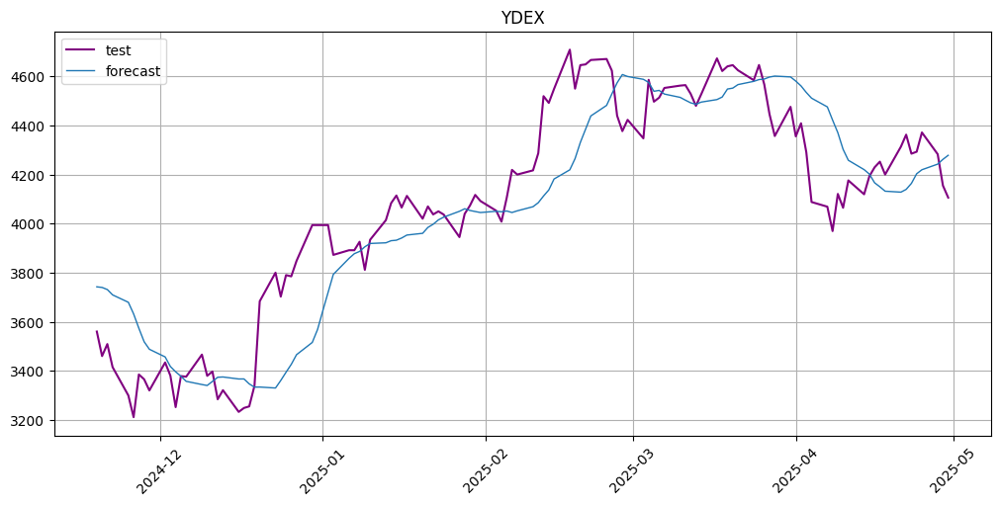

In [75]:
window_size = 10
results_map = {}

for ticker, (full_ts, train_ts, test_ts) in series.items():
    # 1) Инициализируем history_df из train_ts в «длинном» формате: timestamp, segment, target
    #    Берём только ту часть train_ts.df, которая относится к текущему ticker + feature="target"
    df_train_wide = train_ts.to_pandas(flatten=False)
    train_series = df_train_wide[(ticker, "target")]
    history_df = pd.DataFrame({
        "timestamp": train_series.index,
        "segment":   [ticker] * len(train_series),
        "target":    train_series.values
    })
    
    # 2) Получаем Series с фактическими тестовыми значениями (test_ts тоже MultiIndex)
    df_test_wide = test_ts.to_pandas(flatten=False)
    y_test = df_test_wide[(ticker, "target")]

    # 3) Walk-forward: на каждом шаге строим TSDataset из history_df, обучаем, предсказываем и добавляем строку
    preds = []
    times = []
    for idx in y_test.index:
        # 3.1) Собираем TSDataset с freq="B" из текущего history_df
        history_ts = TSDataset(df=history_df.copy(), freq="B")
        
        # 3.2) Обучаем SMA-модель на history_ts
        model = MovingAverageModel(window=window_size)
        start_time = time.time()
        model.fit(history_ts)

        # 3.3) Делаем прогноз на один шаг
        forecast_step = model.predict(ts=history_ts, prediction_size=1)
        end_time = time.time()
        times.append(end_time - start_time)  # Время в секундах
        
        # В forecast_step.df снова будет MultiIndex-колонка (ticker, "target"), берём последнее значение
        df_forecast_wide = forecast_step.to_pandas(flatten=False)
        p = df_forecast_wide[(ticker, "target")].iloc[-1]
        preds.append(p)

        # 3.4) Добавляем реальное значение в history_df
        real_value = y_test.loc[idx]
        df_real = pd.DataFrame({
            "timestamp": [idx],
            "segment":   [ticker],
            "target":    [real_value]
        })
        # Объединяем две плоские таблицы одинаковых колонок
        history_df = pd.concat([history_df, df_real], axis=0, ignore_index=True)

    # 4) Собираем "плоский" DataFrame с прогнозами на весь тестовый период
    forecast_df = pd.DataFrame({
        "timestamp": y_test.index.tolist(),
        "segment":   [ticker] * len(preds),
        "target":    preds
    })
    forecast_ts = TSDataset(df=forecast_df, freq=train_ts.freq)

    # 5) Считаем метрики через ETNA
    mae_v   = MAE()(test_ts,   forecast_ts)[ticker]
    mape_v  = MAPE()(test_ts,  forecast_ts)[ticker]
    rmse_v  = RMSE()(test_ts,  forecast_ts)[ticker]
    smape_v = SMAPE()(test_ts, forecast_ts)[ticker]
    da_v = directional_accuracy(y_test, np.array(preds))

    results_map[ticker] = {
        "MAE":       mae_v,
        "MAPE (%)":  mape_v,
        "RMSE":      rmse_v,
        "SMAPE (%)": smape_v,
        "DA (%)":    da_v,
        "Forecast time (s)": np.mean(np.array(times), axis=0)
    }

    plot_forecast(forecast_ts, test_ts)

In [76]:
# 7) Итоговая таблица метрик
metrics_df = pd.DataFrame.from_dict(results_map, orient="index")
metrics_df.loc["AVERAGE"] = metrics_df.mean(numeric_only=True)
metrics_df = metrics_df.round(3)
display(metrics_df)

,MAE,MAPE (%),RMSE,SMAPE (%),DA (%),Forecast time (s)
AFLT,3.161,5.065,3.986,5.078,51.695,0.003
LKOH,186.166,2.670,250.614,2.656,44.915,0.003
MOEX,8.330,4.075,10.381,4.088,48.305,0.003
NVTK,56.129,5.202,72.706,5.281,48.305,0.003
PIKK,46.032,8.719,58.209,8.769,52.542,0.003
SBER,9.748,3.470,13.362,3.517,47.458,0.003
VKCO,15.019,5.260,18.682,5.134,57.627,0.003
VTBR,4.810,5.702,6.387,5.756,55.814,0.003
X5,75.849,3.511,89.400,3.508,48.649,0.003
YDEX,157.080,3.911,204.274,3.936,52.586,0.003


## Exponential Moving Average

In [56]:
class ExponentialMovingAverageModel(NonPredictionIntervalContextIgnorantAbstractModel):
    """
    Кастомная модель Exponential Moving Average:
      - При fit(train_ts) устанавливает alpha и вычисляет начальное EMA
      - При forecast(test_ts, prediction_size) использует walk-forward с обновлением EMA
    """

    def __init__(self, alpha=0.1):
        super().__init__()
        self.alpha = alpha
        self.initial_ema = None
        self._freq = None
        self.segment = None

    def fit(self, ts: TSDataset) -> None:
        """
        ts — это train-часть (одно-сегментный TSDataset).
        Вычисляем начальное EMA из обучающих данных.
        """
        self._freq = ts.freq
        df_flat = ts.to_pandas(flatten=True)
        self.segment = ts.segments[0]
        
        # Инициализируем EMA первым значением
        values = df_flat["target"].values
        ema = values[0]
        
        # Обновляем EMA по всей тренировочной выборке
        for i in range(1, len(values)):
            ema += self.alpha * (values[i] - ema)
        
        self.initial_ema = ema

    def forecast(self, ts: TSDataset, prediction_size: int) -> TSDataset:
        """
        ts — это test-часть (одно-сегментный TSDataset).
        Используем walk-forward прогнозирование с обновлением EMA.
        """
        df_test_flat = ts.to_pandas(flatten=True).reset_index()
        test_timestamps = df_test_flat["timestamp"].tolist()
        actual_test_values = df_test_flat["target"].values
        n_test = len(actual_test_values)

        preds = []
        current_ema = self.initial_ema

        for i in range(n_test):
            # Прогнозируем текущее значение EMA
            preds.append(current_ema)
            
            # Обновляем EMA реальным значением для следующего шага
            if i < n_test:
                current_ema += self.alpha * (actual_test_values[i] - current_ema)

        # Построим DataFrame прогноза
        df_forecast = pd.DataFrame({
            "timestamp": test_timestamps,
            "target": preds,
            "segment": self.segment
        })

        return TSDataset(df=df_forecast, freq=self._freq)

    def predict(self, ts: TSDataset, prediction_size: int) -> TSDataset:
        return self.forecast(ts, prediction_size)

    def get_model(self) -> str:
        return f"ExponentialMovingAverageModel(alpha={self.alpha})"


=== Итоговая таблица метрик EMA (alpha=0.1) ===


,MAE,MAPE (%),RMSE,SMAPE (%),DA (%),Forecast time (s)
AFLT,3.338,5.334,4.034,5.361,49.153,0.143
LKOH,166.099,2.387,230.936,2.368,44.068,0.076
MOEX,8.174,4.034,9.890,4.035,49.153,0.078
NVTK,61.195,5.688,75.074,5.782,52.542,0.078
PIKK,55.331,10.595,65.858,10.457,53.390,0.077
SBER,10.748,3.824,13.403,3.879,48.305,0.077
VKCO,14.951,5.364,19.408,5.152,40.678,0.139
VTBR,4.536,5.400,6.010,5.434,50.000,0.099
X5,82.465,3.810,97.491,3.793,47.297,0.109
YDEX,170.681,4.278,208.356,4.304,50.862,0.078


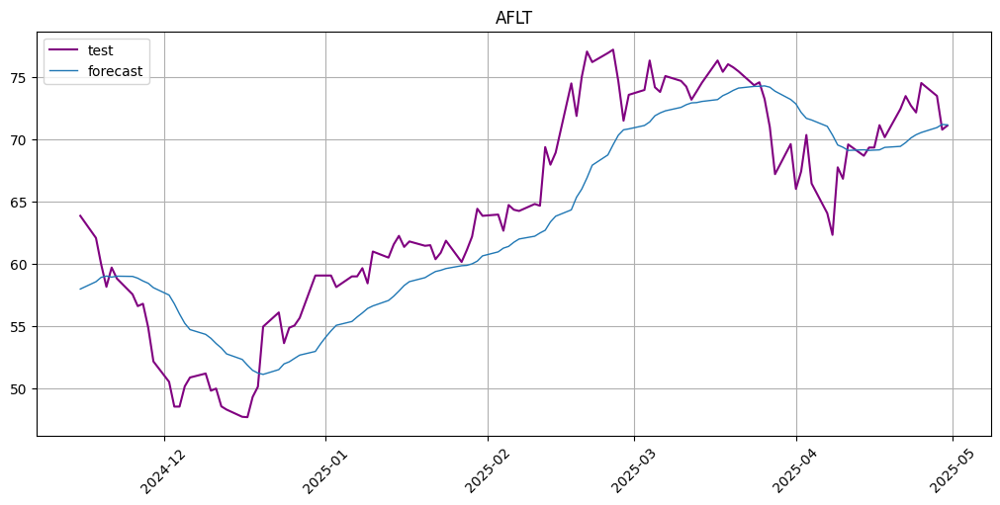

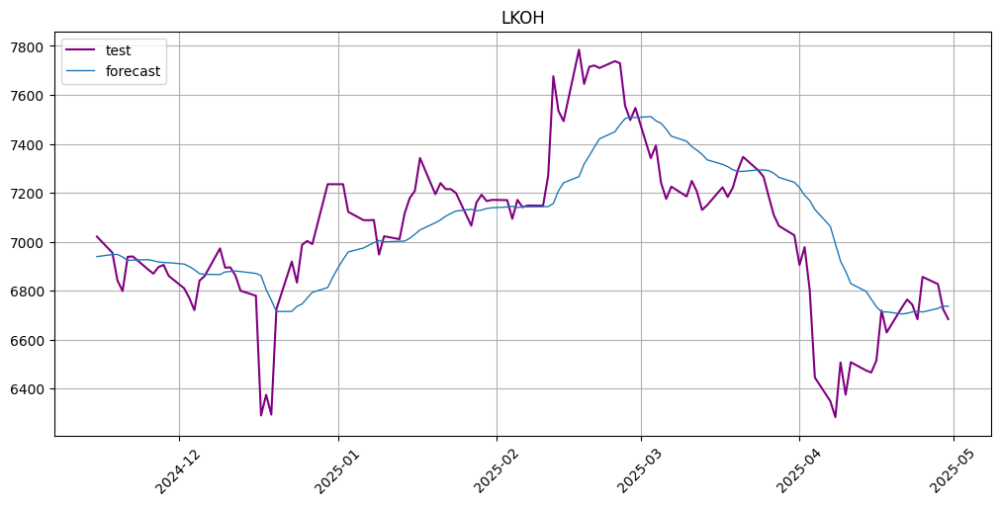

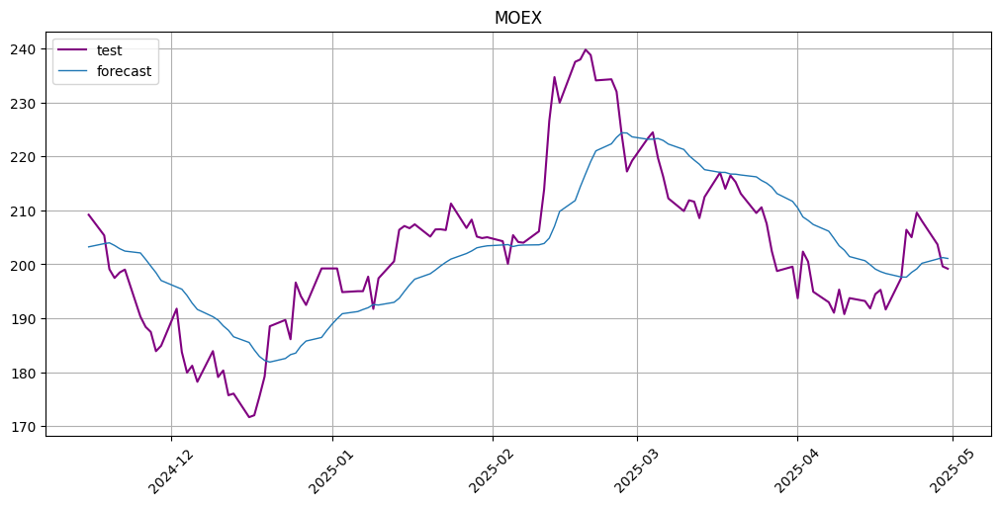

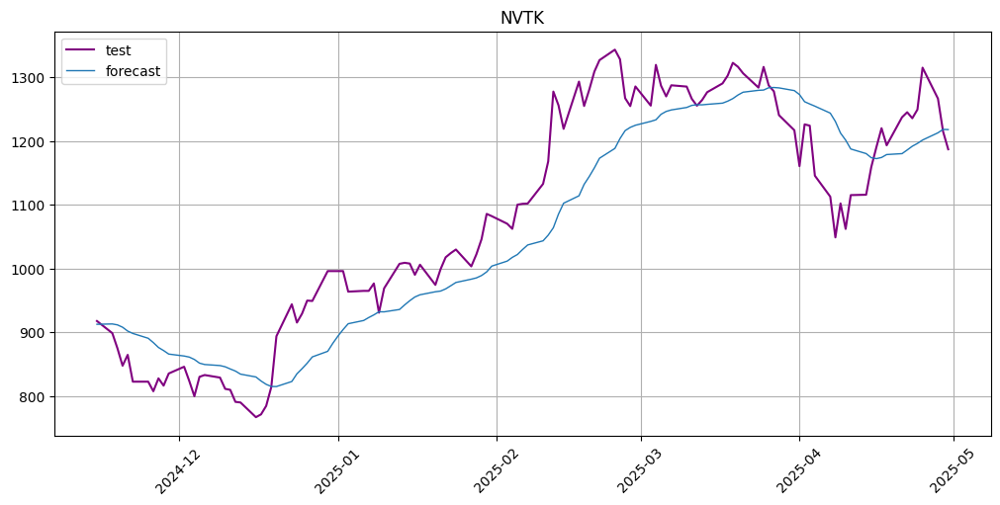

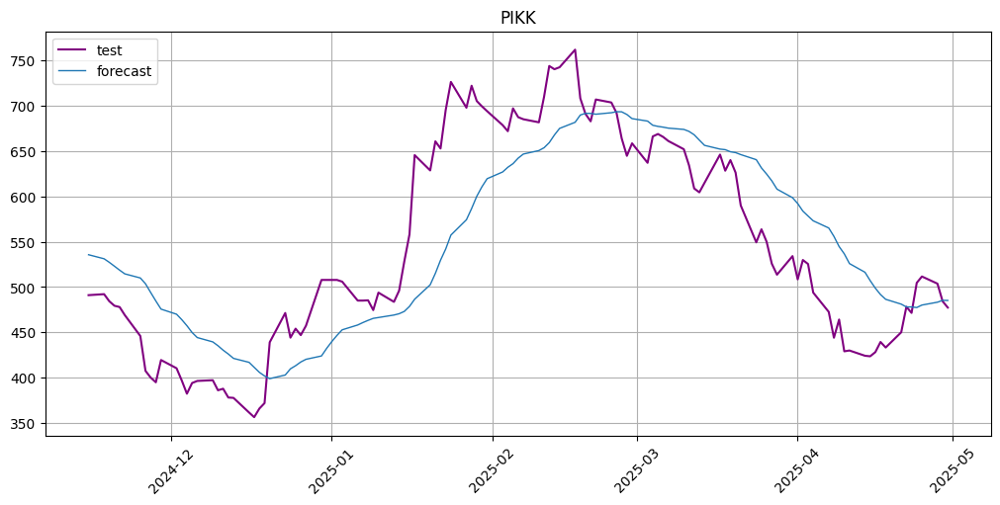

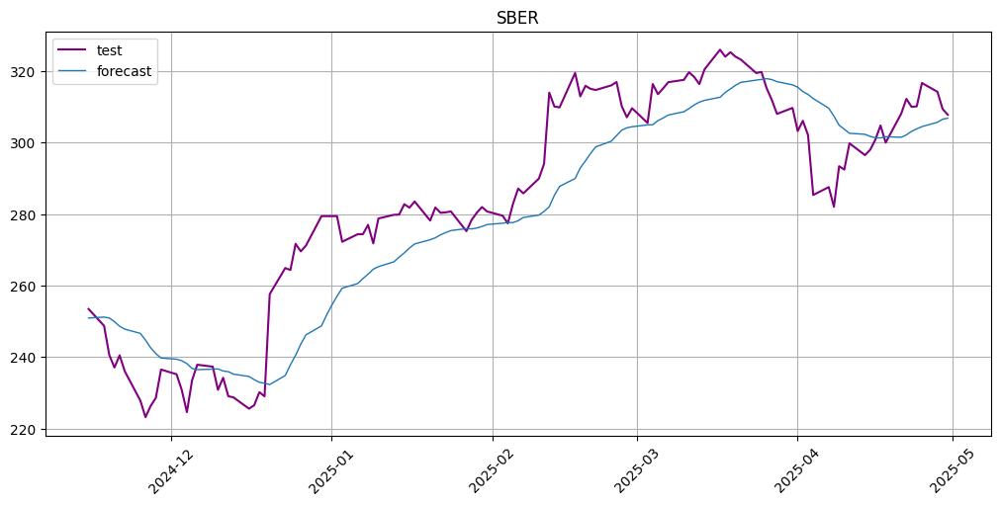

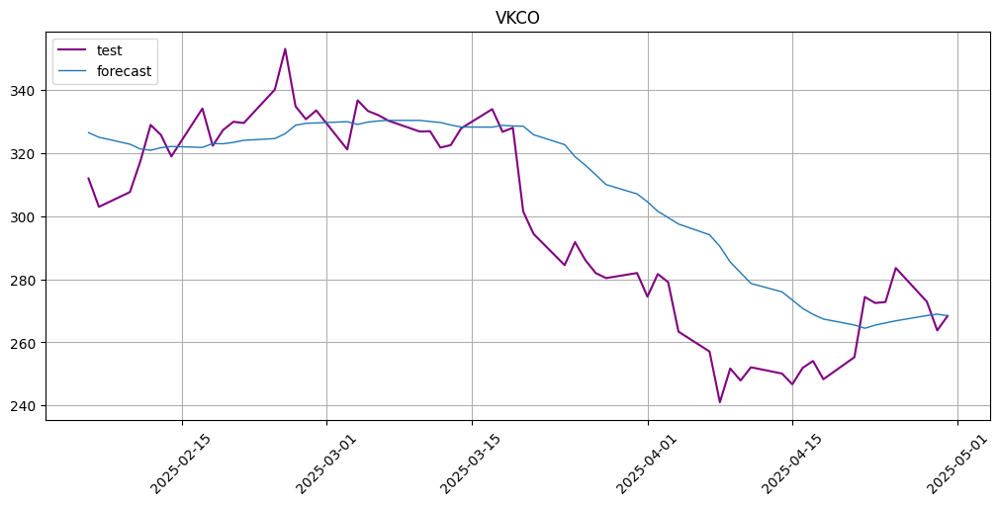

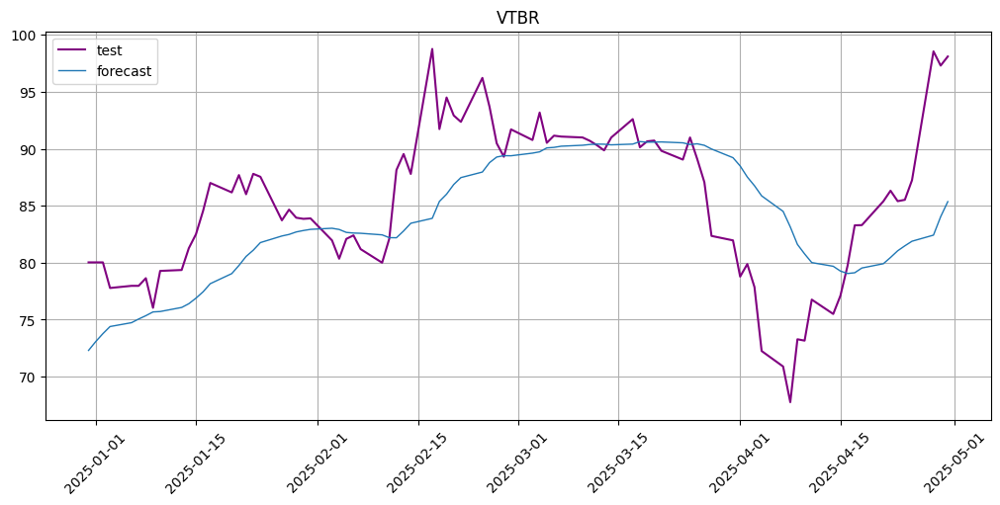

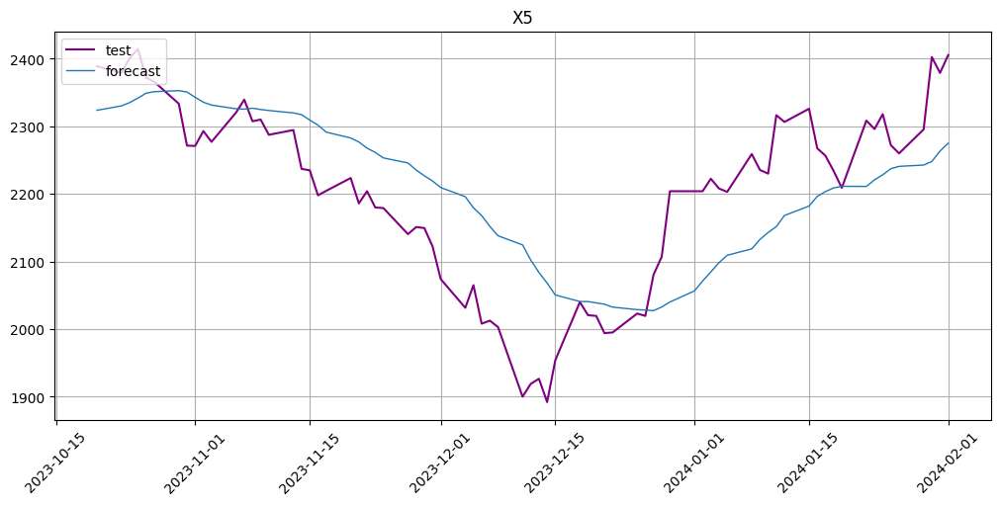

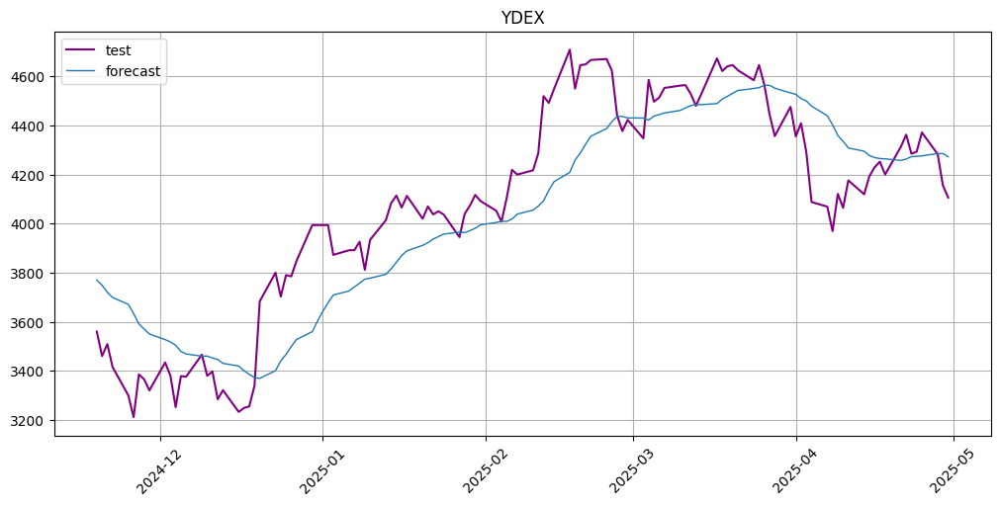

In [57]:
# Тестирование Exponential Moving Average
alpha = 0.1  # параметр сглаживания
results_map = {}

for ticker, (full_ts, train_ts, test_ts) in series.items():
    # 1) Инициализируем EMA модель
    model = ExponentialMovingAverageModel(alpha=alpha)
    model.fit(train_ts)
    
    # 2) Обучаем модель и выполняем прогноз на test_size точек и замеряем время
    df_test = test_ts.to_pandas(flatten=False)
    test_size = df_test.shape[0]

    start_time = time.time()
    forecast_ts = model.forecast(ts=test_ts, prediction_size=test_size)
    end_time = time.time()
    forecast_time = ((end_time - start_time) / test_size) * 1000  # Время в секундах на один прогноз
    
    # 3) Собираем прогноз и реальные значения в pandas.Series
    df_pred = forecast_ts.to_pandas(flatten=True)
    df_true = test_ts.to_pandas(flatten=True)
    
    y_true = df_true["target"].values
    y_pred = df_pred["target"].values

    # 4) Считаем метрики
    mae_v   = MAE()(test_ts, forecast_ts)
    mape_v  = MAPE()(test_ts, forecast_ts)
    rmse_v  = RMSE()(test_ts, forecast_ts)
    smape_v = SMAPE()(test_ts, forecast_ts)
    da_v = directional_accuracy(y_true, y_pred)
    
    # 5) Сохраняем метрики и прогноз
    results_map[ticker] = {
        "MAE": mae_v[ticker],
        "MAPE (%)": mape_v[ticker],
        "RMSE": rmse_v[ticker],
        "SMAPE (%)": smape_v[ticker],
        "DA (%)": da_v,
        "Forecast time (s)": forecast_time
    }
    
    plot_forecast(forecast_ts, test_ts)

# 6) Собираем сводную таблицу метрик
metrics_df = pd.DataFrame.from_dict(results_map, orient="index")
metrics_df.loc["AVERAGE"] = metrics_df.mean(numeric_only=True)
metrics_df = metrics_df.round(3)

print(f"\n=== Итоговая таблица метрик EMA (alpha={alpha}) ===")
display(metrics_df)

## Ensemble of Moving Averages

In [58]:
class EnsembleMovingAverageModel(NonPredictionIntervalContextIgnorantAbstractModel):
    """
    Ансамбль Exponential Moving Averages с разными периодами.
    Усредняет прогнозы EMA с разными alpha.
    """

    def __init__(self, periods=[5, 10, 20, 50]):
        super().__init__()
        self.periods = periods
        # Преобразуем периоды в alpha: alpha = 2/(period+1)
        self.alphas = {p: 2/(p+1) for p in periods}
        self.ema_models = {}
        self._freq = None
        self.segment = None

    def fit(self, ts: TSDataset) -> None:
        """
        Обучаем несколько EMA моделей с разными alpha.
        """
        self._freq = ts.freq
        self.segment = ts.segments[0]
        
        # Создаем и обучаем модель для каждого периода
        for period in self.periods:
            alpha = self.alphas[period]
            model = ExponentialMovingAverageModel(alpha=alpha)
            model.fit(ts)
            self.ema_models[period] = model

    def forecast(self, ts: TSDataset, prediction_size: int) -> TSDataset:
        """
        Получаем прогнозы от всех EMA моделей и усредняем их.
        """
        df_test_flat = ts.to_pandas(flatten=True).reset_index()
        test_timestamps = df_test_flat["timestamp"].tolist()
        
        # Собираем прогнозы от всех моделей
        all_predictions = []
        for period in self.periods:
            model = self.ema_models[period]
            forecast_ts = model.forecast(ts, prediction_size)
            df_pred = forecast_ts.to_pandas(flatten=True)
            predictions = df_pred["target"].values
            all_predictions.append(predictions)
        
        # Усредняем прогнозы
        ensemble_predictions = np.mean(all_predictions, axis=0)

        # Построим DataFrame прогноза
        df_forecast = pd.DataFrame({
            "timestamp": test_timestamps,
            "target": ensemble_predictions,
            "segment": self.segment
        })

        return TSDataset(df=df_forecast, freq=self._freq)

    def predict(self, ts: TSDataset, prediction_size: int) -> TSDataset:
        return self.forecast(ts, prediction_size)

    def get_model(self) -> str:
        return f"EnsembleMovingAverageModel(periods={self.periods})"


=== Итоговая таблица метрик Ensemble MA (periods=[5, 10, 20, 50]) ===


,MAE,MAPE (%),RMSE,SMAPE (%),DA (%),Forecast time (s)
AFLT,2.984,4.707,3.589,4.749,47.458,0.001
LKOH,147.623,2.121,205.562,2.108,47.458,0.001
MOEX,7.006,3.460,8.673,3.458,48.305,0.001
NVTK,57.057,5.281,68.306,5.363,51.695,0.001
PIKK,48.056,9.304,58.107,9.119,52.542,0.001
SBER,9.952,3.542,12.138,3.586,48.305,0.001
VKCO,13.315,4.761,17.117,4.602,40.678,0.001
VTBR,3.862,4.566,5.174,4.599,50.000,0.001
X5,68.929,3.189,82.409,3.174,47.297,0.001
YDEX,154.656,3.867,186.426,3.888,51.724,0.001


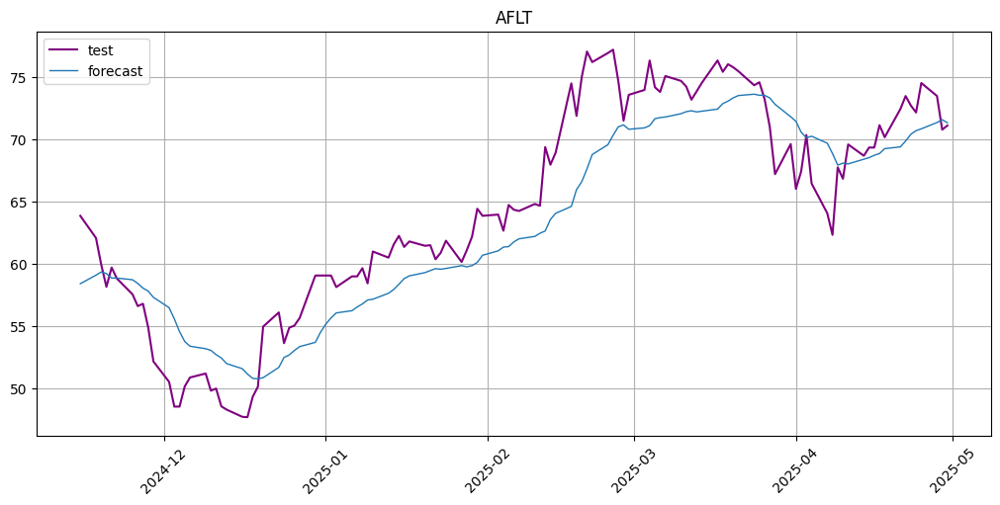

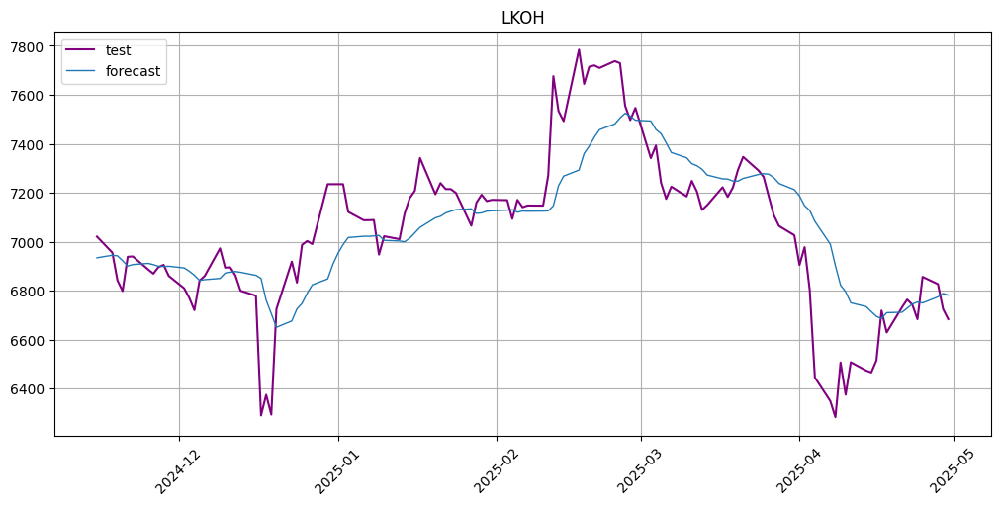

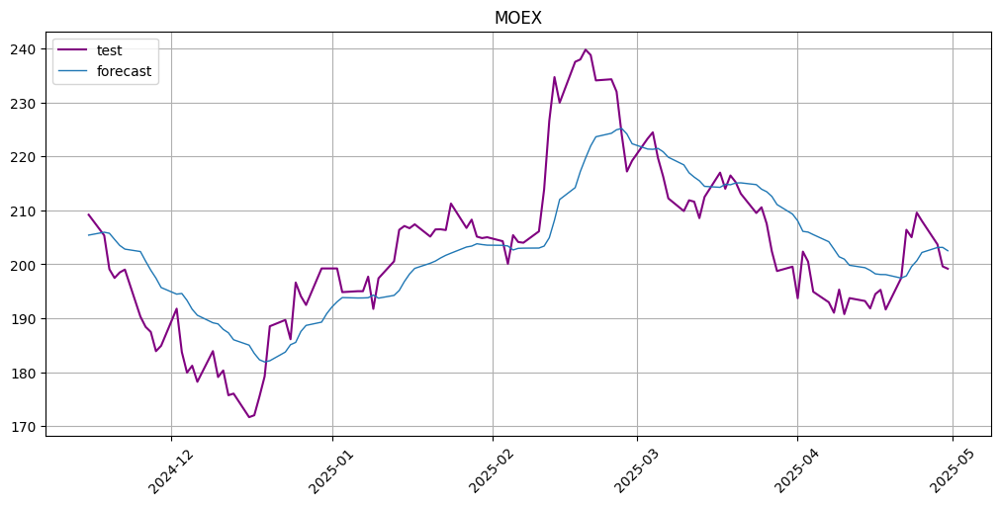

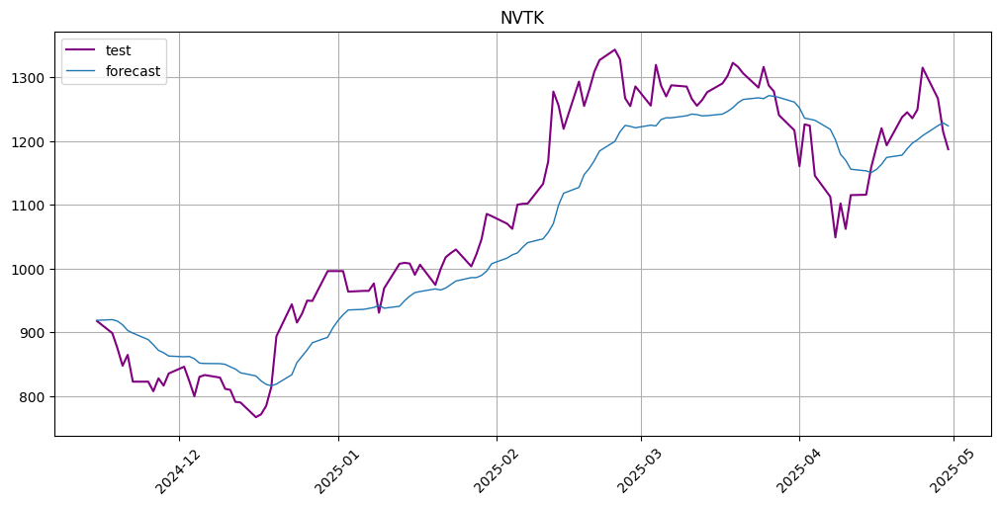

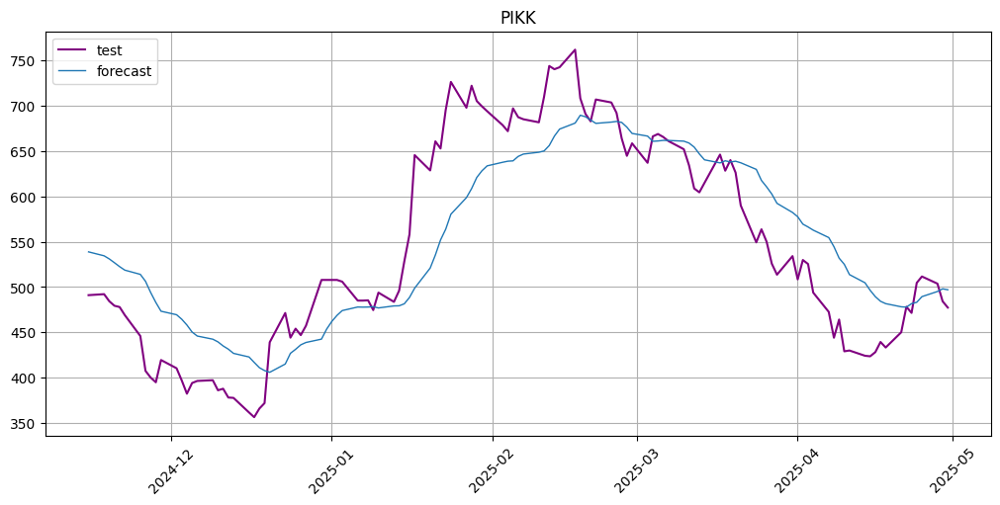

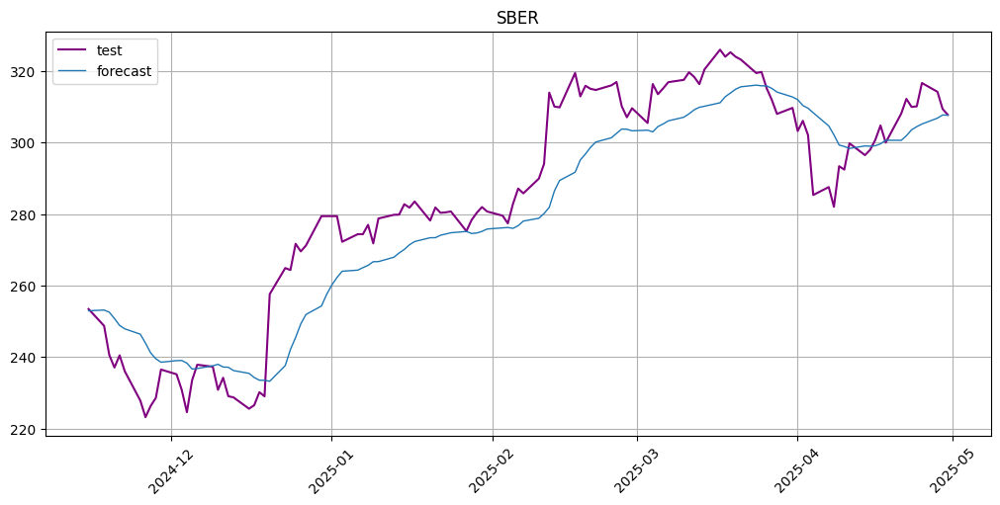

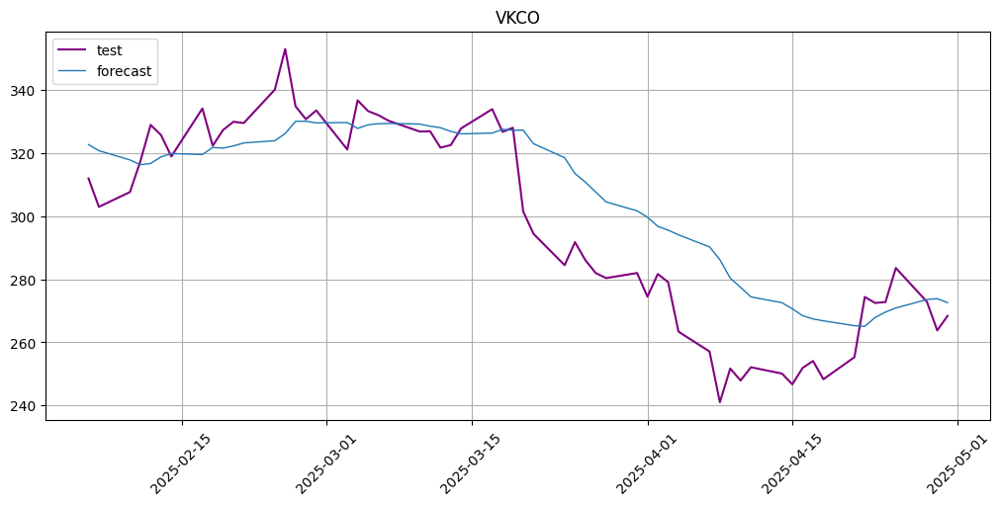

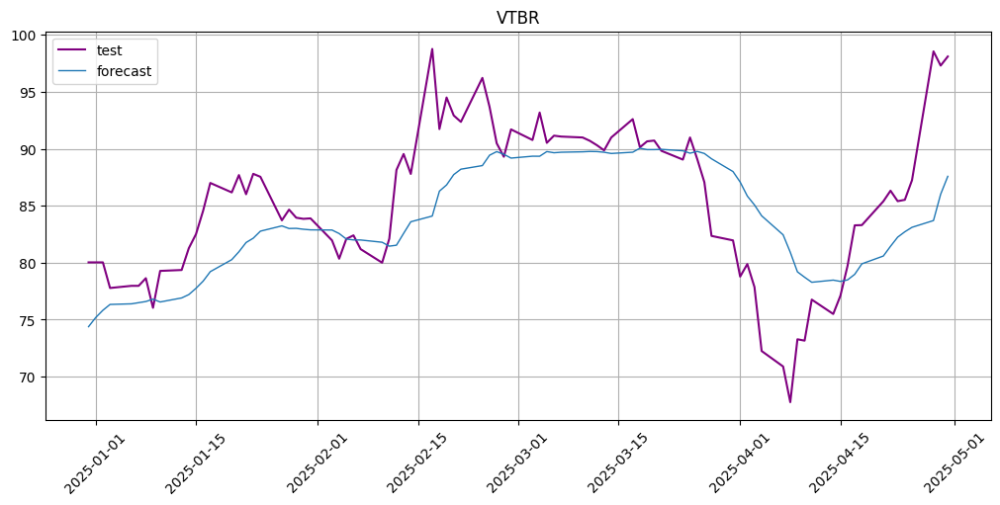

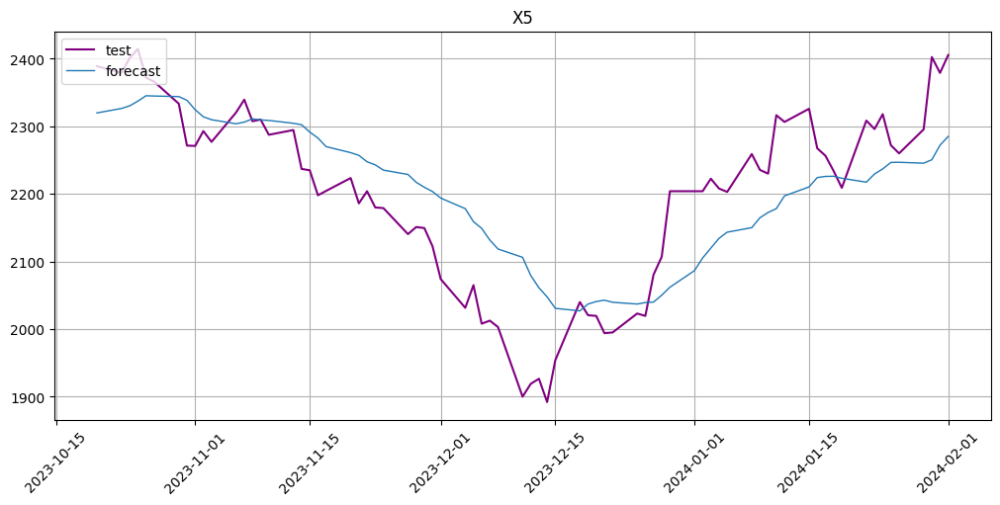

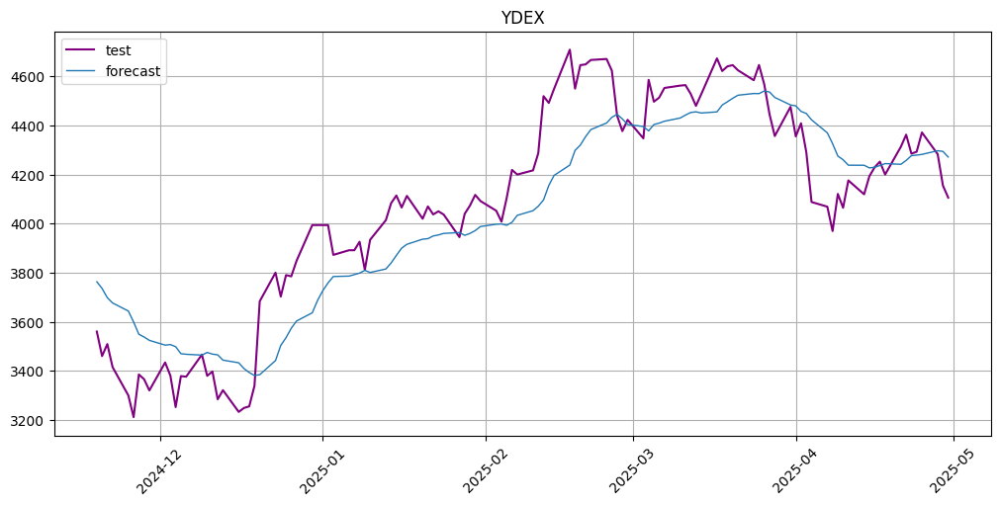

In [59]:
# Тестирование Ensemble of Moving Averages
periods = [5, 10, 20, 50]  # периоды для ансамбля
results_map = {}

for ticker, (full_ts, train_ts, test_ts) in series.items():
    # 1) Инициализируем Ensemble модель
    model = EnsembleMovingAverageModel(periods=periods)

    # 2) Обучаем модель и выполняем прогноз на test_size точек и замеряем время
    df_test = test_ts.to_pandas(flatten=False)
    test_size = df_test.shape[0]

    start_time = time.time()
    model.fit(train_ts)
    forecast_ts = model.forecast(ts=test_ts, prediction_size=test_size)
    end_time = time.time()
    forecast_time = ((end_time - start_time) / test_size)  # Время в секундах на один прогноз
    
    # 3) Собираем прогноз и реальные значения в pandas.Series
    df_pred = forecast_ts.to_pandas(flatten=True)
    df_true = test_ts.to_pandas(flatten=True)
    
    y_true = df_true["target"].values
    y_pred = df_pred["target"].values

    # 4) Считаем метрики
    mae_v   = MAE()(test_ts, forecast_ts)
    mape_v  = MAPE()(test_ts, forecast_ts)
    rmse_v  = RMSE()(test_ts, forecast_ts)
    smape_v = SMAPE()(test_ts, forecast_ts)
    da_v = directional_accuracy(y_true, y_pred)
    
    # 5) Сохраняем метрики и прогноз
    results_map[ticker] = {
        "MAE": mae_v[ticker],
        "MAPE (%)": mape_v[ticker],
        "RMSE": rmse_v[ticker],
        "SMAPE (%)": smape_v[ticker],
        "DA (%)": da_v,
        "Forecast time (s)": forecast_time
    }
    
    plot_forecast(forecast_ts, test_ts)

# 6) Собираем сводную таблицу метрик
metrics_df = pd.DataFrame.from_dict(results_map, orient="index")
metrics_df.loc["AVERAGE"] = metrics_df.mean(numeric_only=True)
metrics_df = metrics_df.round(3)

print(f"\n=== Итоговая таблица метрик Ensemble MA (periods={periods}) ===")
display(metrics_df)

## Drift Method

In [60]:
class DriftModel(NonPredictionIntervalContextIgnorantAbstractModel):
    """
    Метод Drift (Random Walk with Drift):
    Прогнозирует следующее значение как: последнее_значение + средний_дрифт
    где средний_дрифт = (последнее_значение - первое_значение) / (количество_периодов - 1)
    """

    def __init__(self):
        super().__init__()
        self.last_train_value = None
        self.drift_per_step = None
        self._freq = None
        self.segment = None

    def fit(self, ts: TSDataset) -> None:
        """
        ts — это train-часть (одно-сегментный TSDataset).
        Вычисляем дрифт по обучающим данным.
        """
        self._freq = ts.freq
        df_flat = ts.to_pandas(flatten=True)
        self.segment = ts.segments[0]
        
        values = df_flat["target"].values
        self.last_train_value = values[-1]
        
        # Вычисляем средний дрифт за шаг
        if len(values) > 1:
            self.drift_per_step = (values[-1] - values[0]) / (len(values) - 1)
        else:
            self.drift_per_step = 0.0

    def forecast(self, ts: TSDataset, prediction_size: int) -> TSDataset:
        """
        ts — это test-часть (одно-сегментный TSDataset).
        Используем walk-forward прогнозирование с обновлением дрифта.
        """
        df_test_flat = ts.to_pandas(flatten=True).reset_index()
        test_timestamps = df_test_flat["timestamp"].tolist()
        actual_test_values = df_test_flat["target"].values
        n_test = len(actual_test_values)

        preds = []
        current_value = self.last_train_value

        for i in range(n_test):
            # Прогнозируем следующее значение как current_value + drift
            next_pred = current_value + self.drift_per_step
            preds.append(next_pred)
            
            # Для следующего шага используем реальное значение
            if i < n_test:
                current_value = actual_test_values[i]
                # Обновляем дрифт на основе нового наблюдения
                # (простое скользящее окно для обновления дрифта не реализуем, используем фиксированный)

        # Построим DataFrame прогноза
        df_forecast = pd.DataFrame({
            "timestamp": test_timestamps,
            "target": preds,
            "segment": self.segment
        })

        return TSDataset(df=df_forecast, freq=self._freq)

    def predict(self, ts: TSDataset, prediction_size: int) -> TSDataset:
        return self.forecast(ts, prediction_size)

    def get_model(self) -> str:
        return f"DriftModel(drift_per_step={self.drift_per_step:.6f})"


=== Итоговая таблица метрик Drift Method ===


,MAE,MAPE (%),RMSE,SMAPE (%),DA (%),Forecast time (s)
AFLT,1.374,2.134,1.802,2.141,38.983,0.191
LKOH,81.379,1.168,118.375,1.168,41.525,0.158
MOEX,3.250,1.608,4.162,1.610,42.373,0.148
NVTK,24.810,2.286,31.921,2.294,52.542,0.138
PIKK,16.133,2.988,21.561,3.003,49.153,0.136
SBER,3.873,1.396,5.499,1.403,40.678,0.141
VKCO,6.855,2.318,8.742,2.319,40.678,0.208
VTBR,1.888,2.204,2.774,2.220,44.186,0.165
X5,28.786,1.318,38.885,1.321,40.541,0.174
YDEX,71.759,1.793,91.423,1.798,40.517,0.137


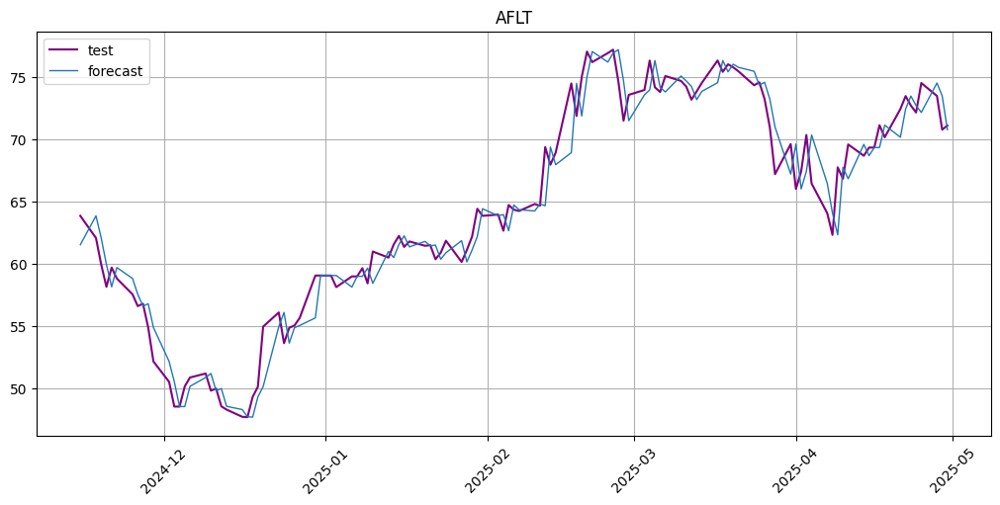

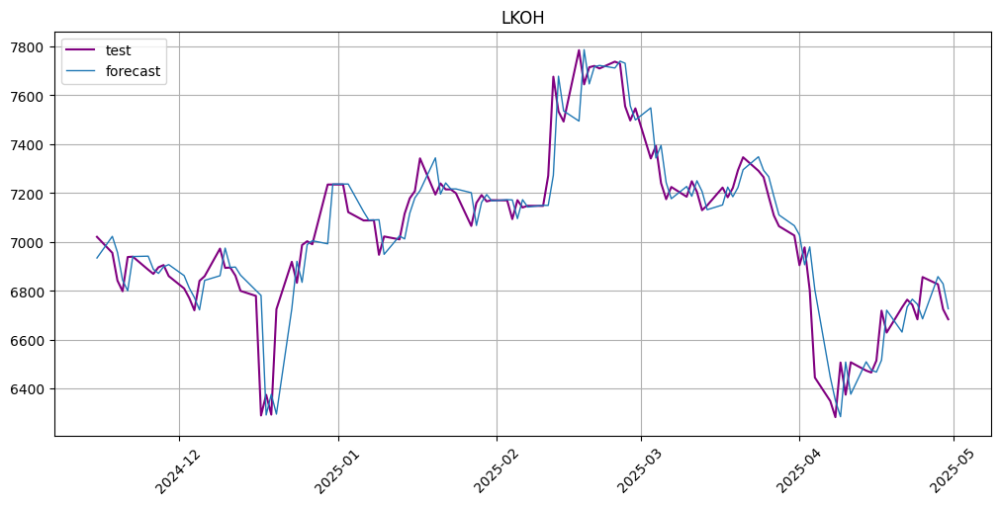

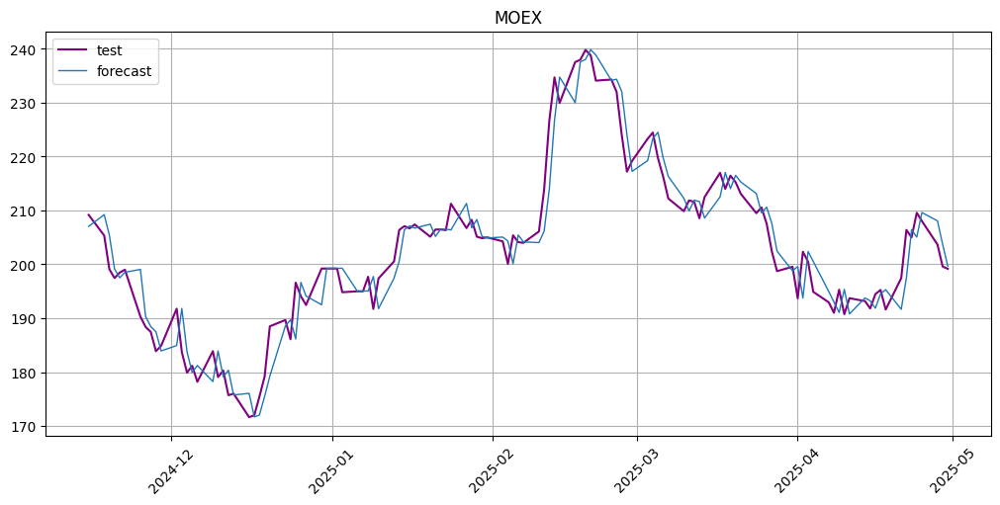

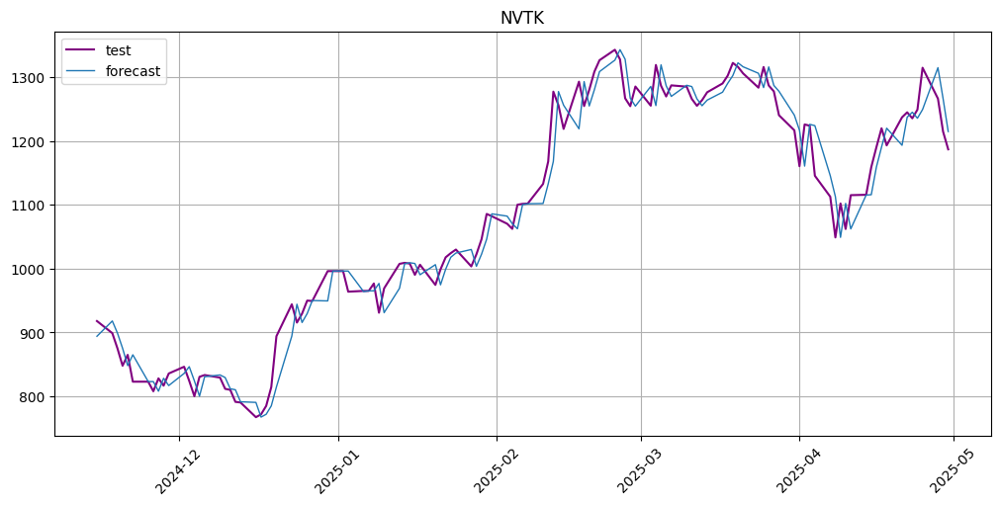

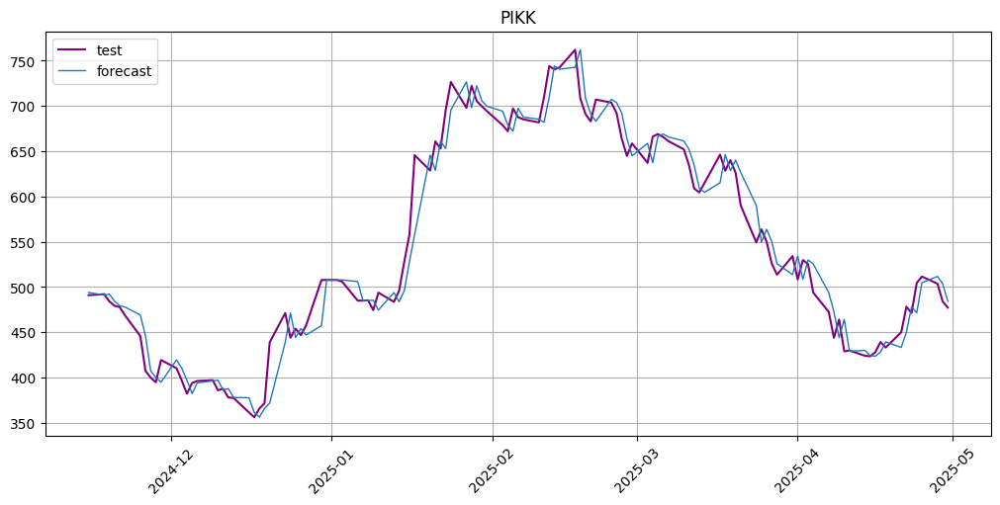

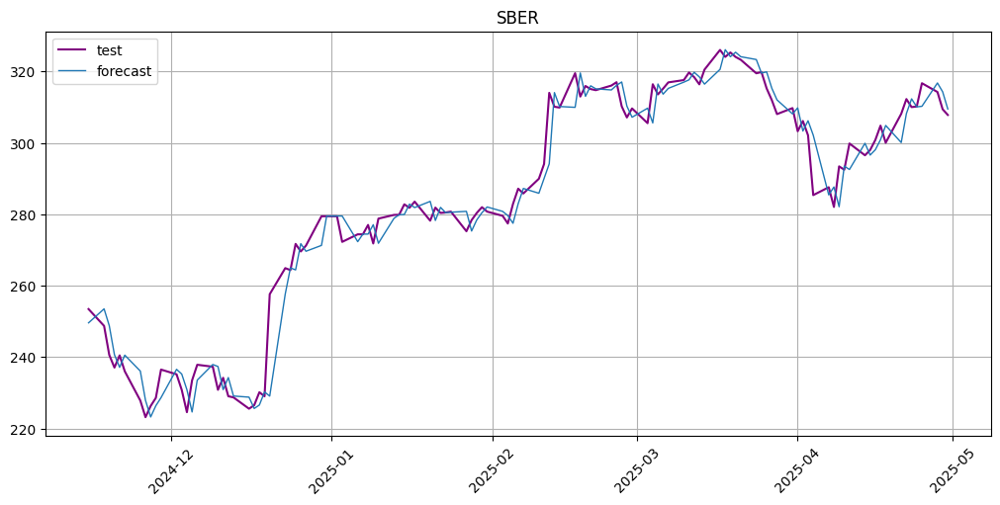

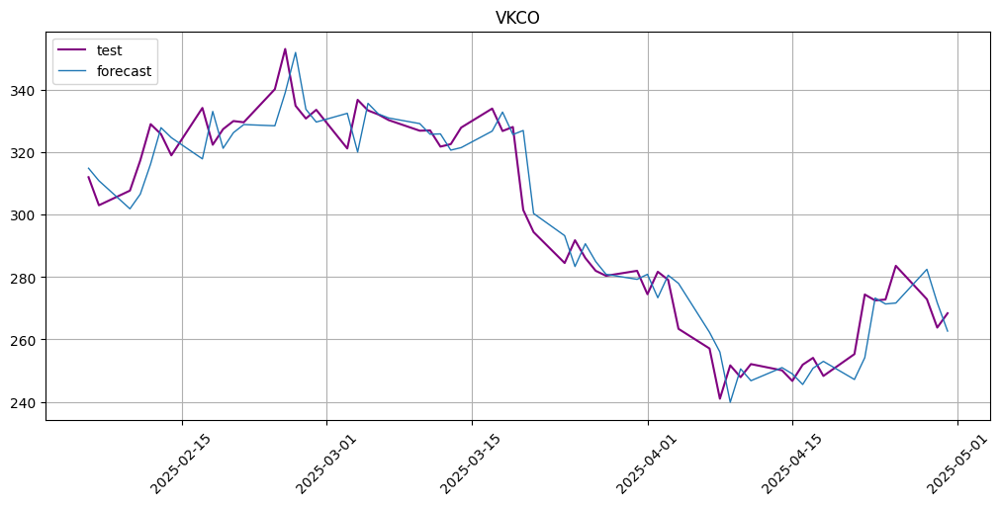

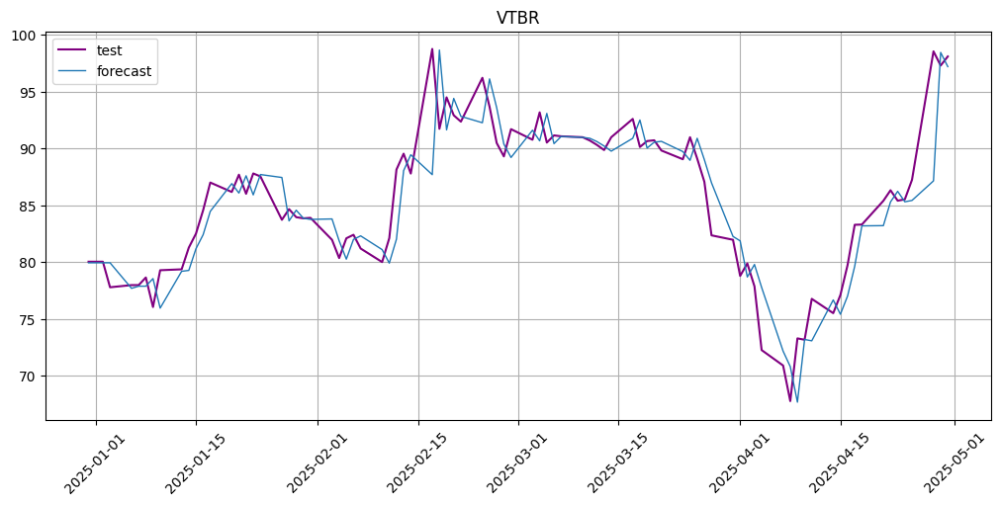

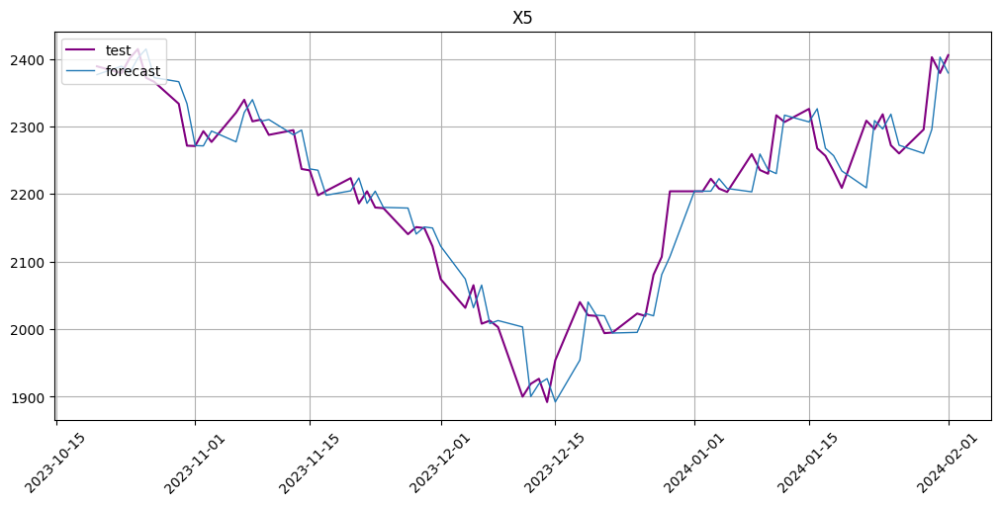

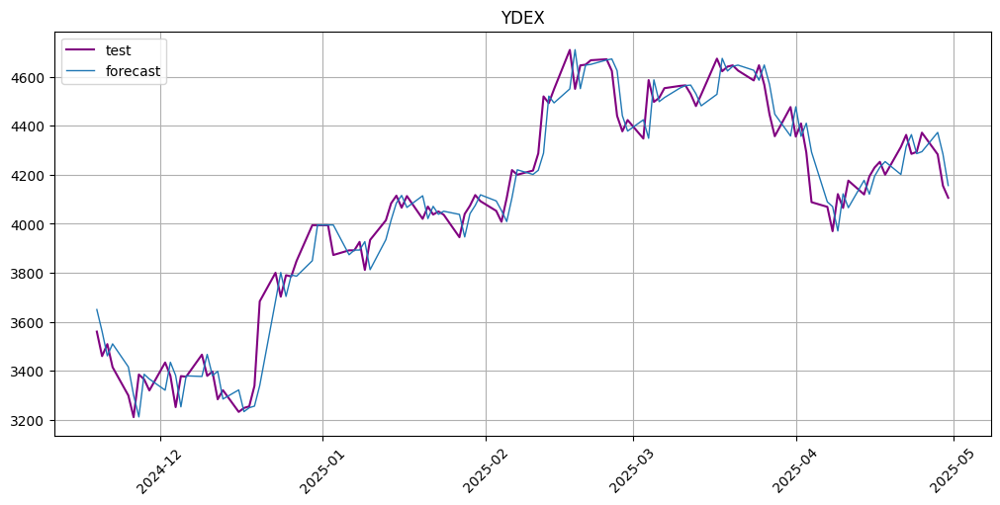

In [61]:
# Тестирование Drift Method
results_map = {}

for ticker, (full_ts, train_ts, test_ts) in series.items():
    # 1) Инициализируем Drift модель
    model = DriftModel()
    
    # 2) Обучаем модель и выполняем прогноз на test_size точек и замеряем время
    df_test = test_ts.to_pandas(flatten=False)
    test_size = df_test.shape[0]
    
    start_time = time.time()
    model.fit(train_ts)
    forecast_ts = model.forecast(ts=test_ts, prediction_size=test_size)
    end_time = time.time()
    forecast_time = ((end_time - start_time) / test_size) * 1000  # Время в секундах на один прогноз
    
    # 3) Собираем прогноз и реальные значения в pandas.Series
    df_pred = forecast_ts.to_pandas(flatten=True)
    df_true = test_ts.to_pandas(flatten=True)
    
    y_true = df_true["target"].values
    y_pred = df_pred["target"].values

    # 4) Считаем метрики
    mae_v   = MAE()(test_ts, forecast_ts)
    mape_v  = MAPE()(test_ts, forecast_ts)
    rmse_v  = RMSE()(test_ts, forecast_ts)
    smape_v = SMAPE()(test_ts, forecast_ts)
    da_v = directional_accuracy(y_true, y_pred)
    
    # 5) Сохраняем метрики и прогноз
    results_map[ticker] = {
        "MAE": mae_v[ticker],
        "MAPE (%)": mape_v[ticker],
        "RMSE": rmse_v[ticker],
        "SMAPE (%)": smape_v[ticker],
        "DA (%)": da_v,
        "Forecast time (s)": forecast_time
    }
    
    plot_forecast(forecast_ts, test_ts)

# 6) Собираем сводную таблицу метрик
metrics_df = pd.DataFrame.from_dict(results_map, orient="index")
metrics_df.loc["AVERAGE"] = metrics_df.mean(numeric_only=True)
metrics_df = metrics_df.round(3)

print("\n=== Итоговая таблица метрик Drift Method ===")
display(metrics_df)

# Статистические модели

## ARIMA

In [20]:
# ADF тест для проверки стационарности
def check_stationarity(timeseries, title):
    """
    Выполняет Augmented Dickey-Fuller тест для проверки стационарности.
    """
    print(f'Results of Augmented Dickey-Fuller Test for {title}:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)
    
    if dftest[1] <= 0.05:
        print("*** Series is Stationary ***")
        return True
    else:
        print("*** Series is Non-Stationary ***")
        return False

In [21]:
# Функции для приведения к стационарности и обратного преобразования
def make_stationary(ts, method='diff'):
    """
    Приводит временной ряд к стационарному виду.
    
    Parameters:
    ts: pandas Series - временной ряд
    method: str - метод преобразования ('diff', 'log_diff', 'pct_change')
    
    Returns:
    transformed_ts: pandas Series - преобразованный ряд
    """
    if method == 'diff':
        return ts.diff().dropna()
    elif method == 'log_diff':
        return np.log(ts).diff().dropna()
    elif method == 'pct_change':
        return ts.pct_change().dropna()
    else:
        raise ValueError("Method should be 'diff', 'log_diff', or 'pct_change'")

def inverse_transform(original_ts, transformed_predictions, method='diff'):
    """
    Обращает преобразование для получения прогнозов в исходном масштабе.
    
    Parameters:
    original_ts: pandas Series - исходный временной ряд
    transformed_predictions: array-like - прогнозы в преобразованном масштабе
    method: str - метод преобразования, который нужно обратить
    
    Returns:
    original_scale_predictions: array - прогнозы в исходном масштабе
    """
    if method == 'diff':
        # Обращение разности
        last_value = original_ts.iloc[-1]
        predictions = []
        current_value = last_value
        
        for diff_pred in transformed_predictions:
            next_value = current_value + diff_pred
            predictions.append(next_value)
            current_value = next_value
            
        return np.array(predictions)
    
    elif method == 'log_diff':
        # Обращение лог-разности
        last_log_value = np.log(original_ts.iloc[-1])
        predictions = []
        current_log_value = last_log_value
        
        for log_diff_pred in transformed_predictions:
            next_log_value = current_log_value + log_diff_pred
            next_value = np.exp(next_log_value)
            predictions.append(next_value)
            current_log_value = next_log_value
            
        return np.array(predictions)
    
    elif method == 'pct_change':
        # Обращение процентного изменения
        last_value = original_ts.iloc[-1]
        predictions = []
        current_value = last_value
        
        for pct_pred in transformed_predictions:
            next_value = current_value * (1 + pct_pred)
            predictions.append(next_value)
            current_value = next_value
            
        return np.array(predictions)
    
    else:
        raise ValueError("Method should be 'diff', 'log_diff', or 'pct_change'")


Анализ стационарности для SBER

1. Исходный ряд SBER:
Results of Augmented Dickey-Fuller Test for SBER Original:
Test Statistic                  -2.277
p-value                          0.180
#Lags Used                       5.000
Number of Observations Used   2369.000
Critical Value (1%)             -3.433
Critical Value (5%)             -2.863
Critical Value (10%)            -2.567
dtype: float64
*** Series is Non-Stationary ***

2. Ряд SBER после взятия разности:
Results of Augmented Dickey-Fuller Test for SBER Differenced:
Test Statistic                 -16.316
p-value                          0.000
#Lags Used                       9.000
Number of Observations Used   2364.000
Critical Value (1%)             -3.433
Critical Value (5%)             -2.863
Critical Value (10%)            -2.567
dtype: float64
*** Series is Stationary ***

3. Ряд SBER - логарифмические доходности:
Results of Augmented Dickey-Fuller Test for SBER Log Returns:
Test Statistic                 -17.206
p-valu

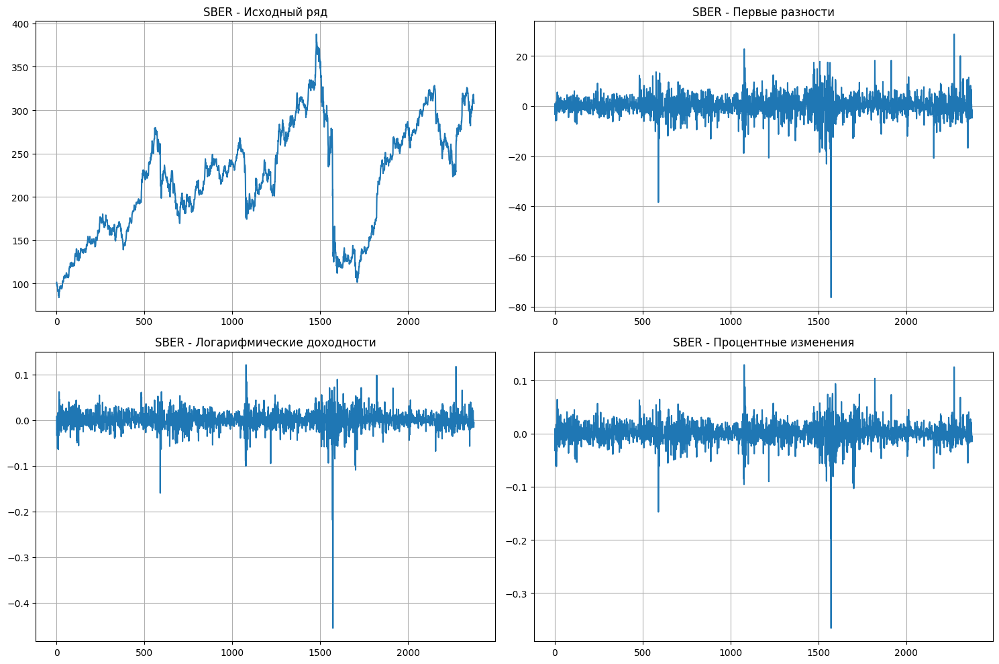


Результаты для SBER:
Исходный ряд стационарен: False
Ряд разностей стационарен: True
Лог-доходности стационарны: True


In [23]:
sample_tickers = ['SBER']

for ticker in sample_tickers:
    if ticker in series_map:
        print(f"\n{'='*50}")
        print(f"Анализ стационарности для {ticker}")
        print(f"{'='*50}")
        
        ts_data = series_map[ticker]['close']
        
        # 1) Проверим исходный ряд
        print(f"\n1. Исходный ряд {ticker}:")
        is_stationary_orig = check_stationarity(ts_data, f"{ticker} Original")
        
        # 2) Проверим после взятия первой разности
        print(f"\n2. Ряд {ticker} после взятия разности:")
        ts_diff = make_stationary(ts_data, method='diff')
        is_stationary_diff = check_stationarity(ts_diff, f"{ticker} Differenced")
        
        # 3) Проверим логарифмические доходности
        print(f"\n3. Ряд {ticker} - логарифмические доходности:")
        ts_log_diff = make_stationary(ts_data, method='log_diff')
        is_stationary_log_diff = check_stationarity(ts_log_diff, f"{ticker} Log Returns")
        
        # 4) Визуализация
        fig, axes = plt.subplots(2, 2, figsize=(15, 10))
        
        # Исходный ряд
        axes[0,0].plot(ts_data)
        axes[0,0].set_title(f'{ticker} - Исходный ряд')
        axes[0,0].grid(True)
        
        # Разности
        axes[0,1].plot(ts_diff)
        axes[0,1].set_title(f'{ticker} - Первые разности')
        axes[0,1].grid(True)
        
        # Логарифмические доходности
        axes[1,0].plot(ts_log_diff)
        axes[1,0].set_title(f'{ticker} - Логарифмические доходности')
        axes[1,0].grid(True)
        
        # Процентные изменения
        ts_pct = make_stationary(ts_data, method='pct_change')
        axes[1,1].plot(ts_pct)
        axes[1,1].set_title(f'{ticker} - Процентные изменения')
        axes[1,1].grid(True)
        
        plt.tight_layout()
        plt.show()
        
        print(f"\nРезультаты для {ticker}:")
        print(f"Исходный ряд стационарен: {is_stationary_orig}")
        print(f"Ряд разностей стационарен: {is_stationary_diff}")
        print(f"Лог-доходности стационарны: {is_stationary_log_diff}")

#### Ожидаемо ряды цен не стационарны. К ним необходимо применить преобразование Бокса-Кокса и продифференцировать или взять уже стационарные аналоги.

In [25]:
stationar_series_map = {}

for ticker, df in series_map.items():
    ts_data = df["close"].copy()
    ts_data = pd.Series(ts_data.values, index=pd.to_datetime(df["timestamp"], utc=True))

    stationar_series_map[ticker] = {
        "original": ts_data,
        "diff": ts_data.diff().dropna(),
        "log_diff": np.log(ts_data).diff().dropna(),
        "pct_change": ts_data.pct_change().dropna()
    }


ACF/PACF анализ преобразованных рядов для SBER



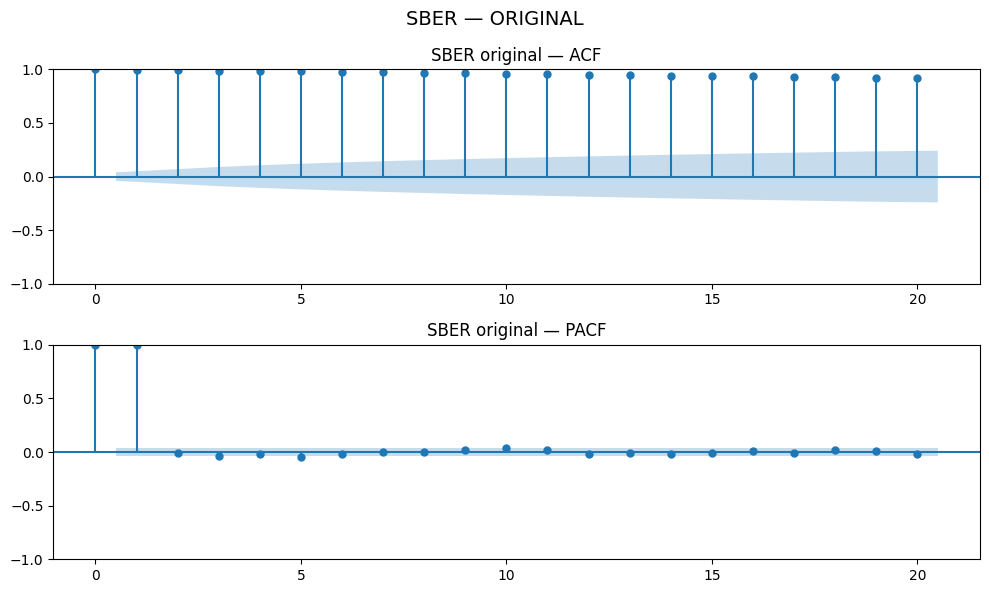

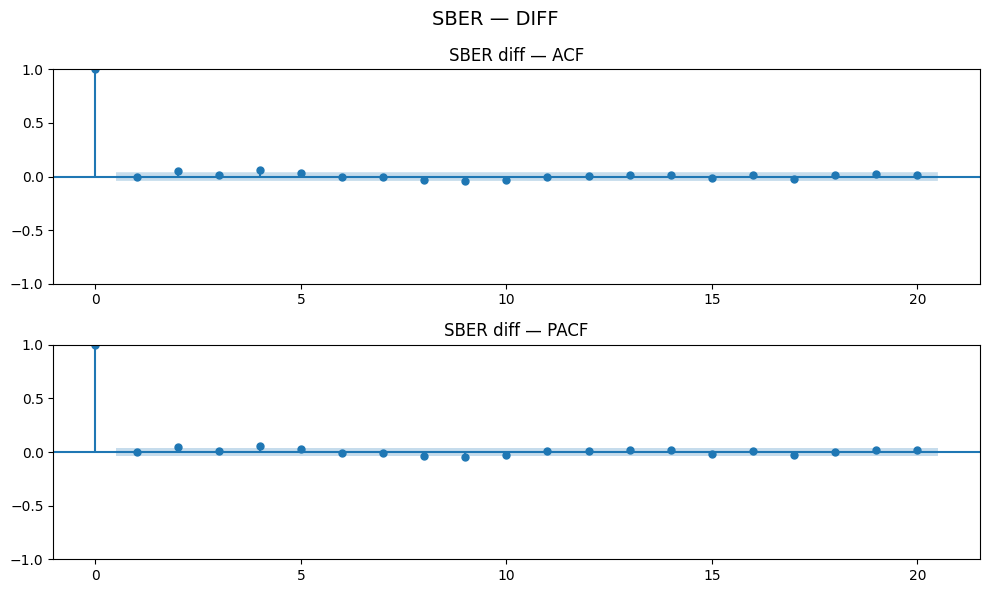

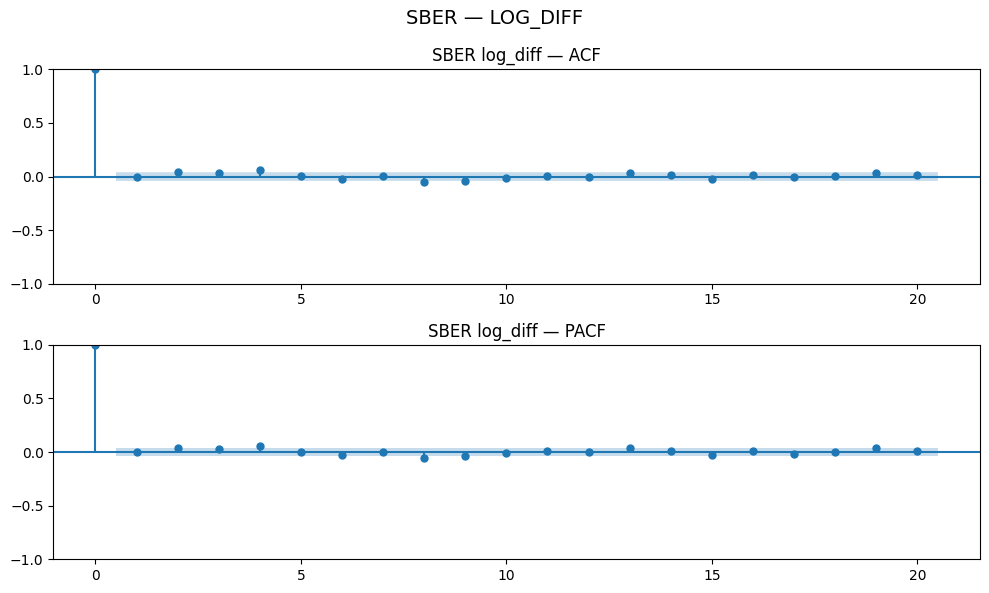

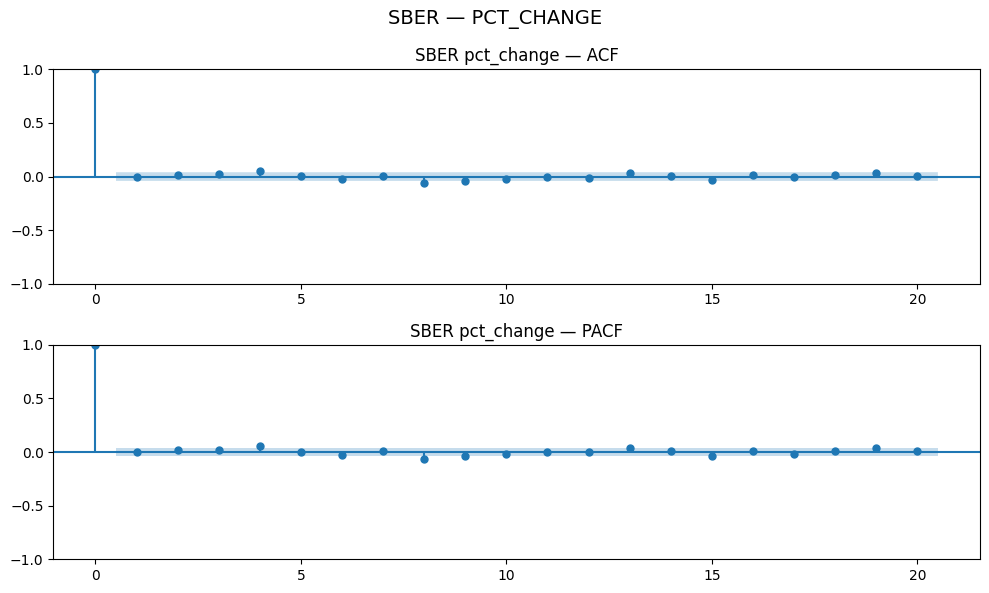

In [26]:
methods = ['original', 'diff', 'log_diff', 'pct_change']

for ticker in sample_tickers:
    if ticker not in stationar_series_map:
        continue

    print(f"\n{'='*60}")
    print(f"ACF/PACF анализ преобразованных рядов для {ticker}")
    print(f"{'='*60}\n")

    for method in methods:
        ts = stationar_series_map[ticker][method]

        fig, axes = plt.subplots(2, 1, figsize=(10, 6))
        fig.suptitle(f"{ticker} — {method.upper()}", fontsize=14)

        plot_acf(ts, lags=20, ax=axes[0])
        axes[0].set_title(f"{ticker} {method} — ACF")

        plot_pacf(ts, lags=20, ax=axes[1])
        axes[1].set_title(f"{ticker} {method} — PACF")

        plt.tight_layout()
        plt.show()

In [27]:
diff_series = {}

for ticker, df in series_map.items():
    tmp = df.copy()
    tmp["timestamp"] = pd.to_datetime(tmp["timestamp"], utc=True)
    tmp = tmp.set_index("timestamp")

    # 1) Считаем первые разности и удалим NaN
    tmp["target"] = tmp["close"].diff().dropna()
    tmp = tmp[["target"]]

    # 2) Реиндексация по business day
    all_biz = pd.date_range(start=tmp.index.min(), end=tmp.index.max(), freq="B", tz="UTC")
    tmp = tmp.reindex(all_biz)
    tmp["target"] = tmp["target"].ffill().bfill()

    # 3) Возвращаем колонку timestamp и сегмент
    tmp = tmp.reset_index().rename(columns={"index": "timestamp"})
    tmp["segment"] = ticker
    tmp = tmp[["timestamp", "segment", "target"]]

    # 4) Создаём TSDataset
    ts = TSDataset(tmp, freq="B")

    # 5) Точки train/test по числу НЕпропущенных оригинальных наблюдений
    n_points = df.shape[0] - 1  # -1 из-за diff
    train_size = int(n_points * 0.95)
    test_size = n_points - train_size

    train_ts, test_ts = ts.train_test_split(test_size=test_size)

    # 6) Проверка на NaN в конце train
    df_train_flat = train_ts.to_pandas(flatten=True)
    last_val = df_train_flat.iloc[-1]["target"]
    assert not pd.isna(last_val), f"NaN в последнем значении train для {ticker}"

    diff_series[ticker] = (ts, train_ts, test_ts)

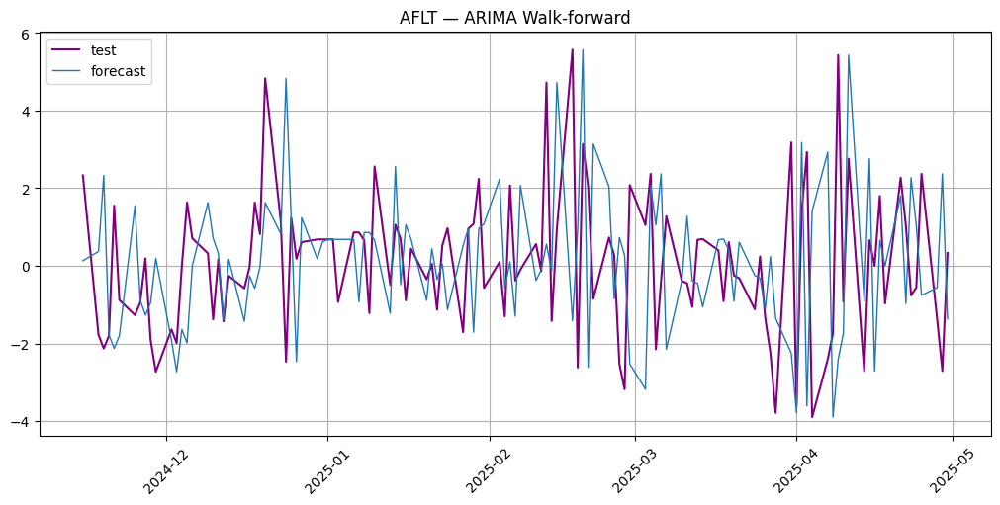

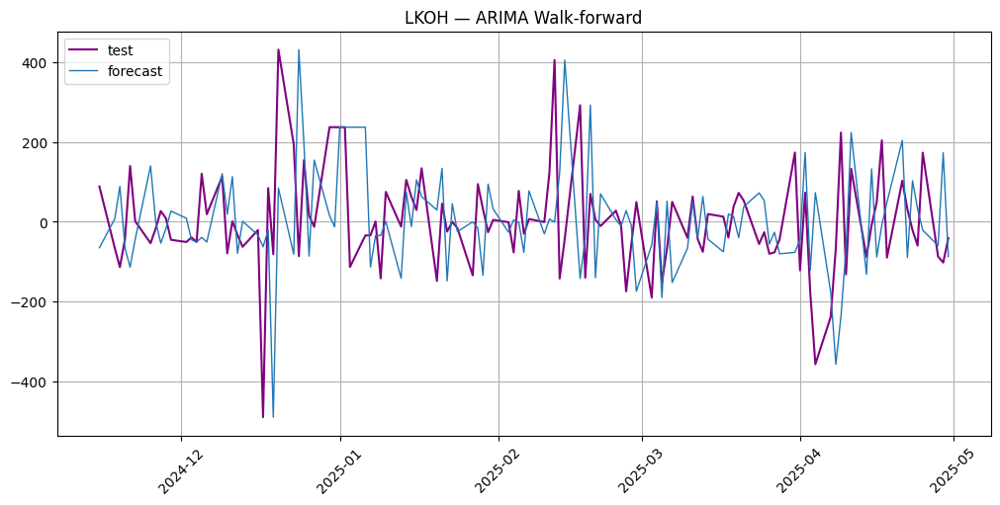

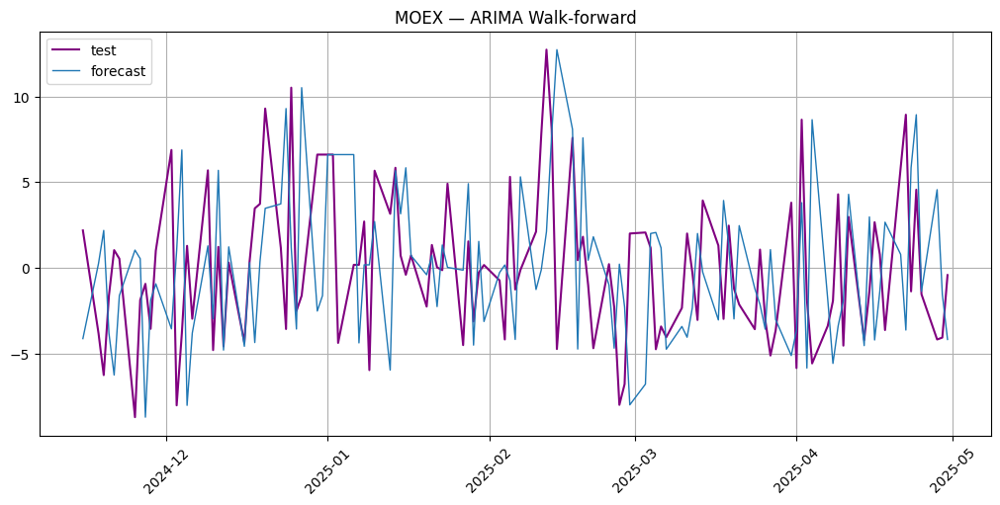

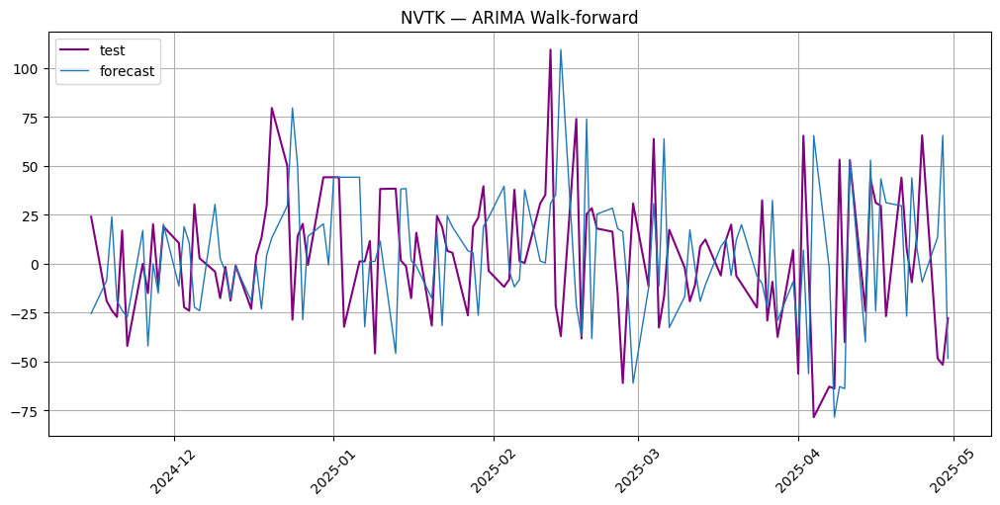

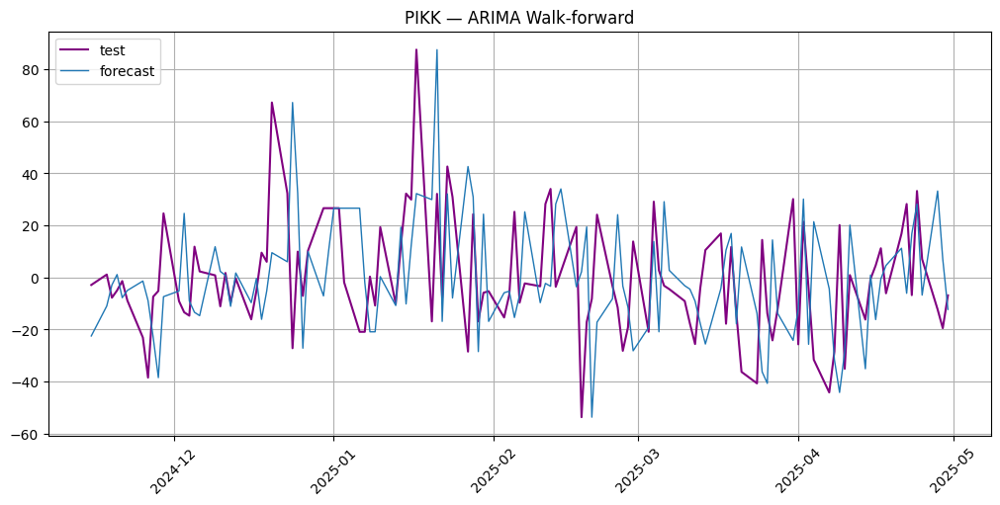

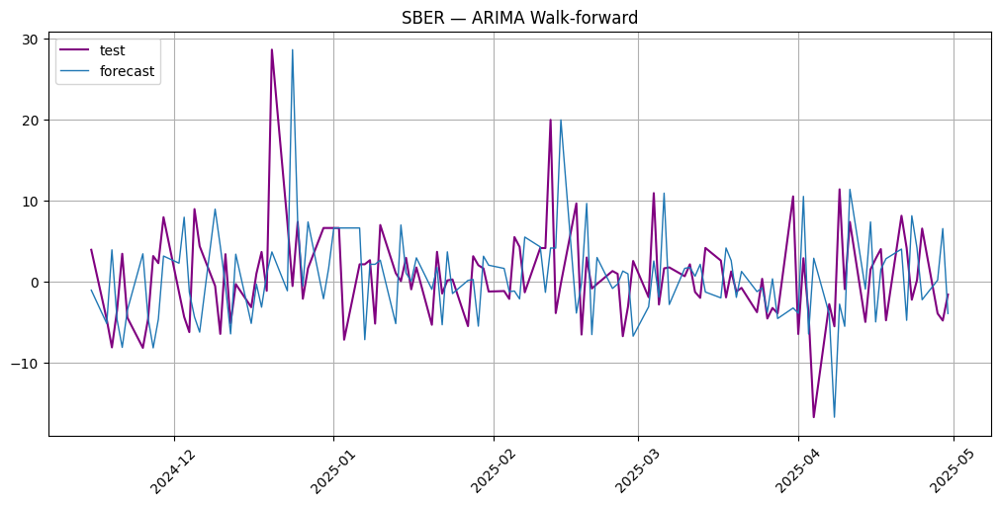

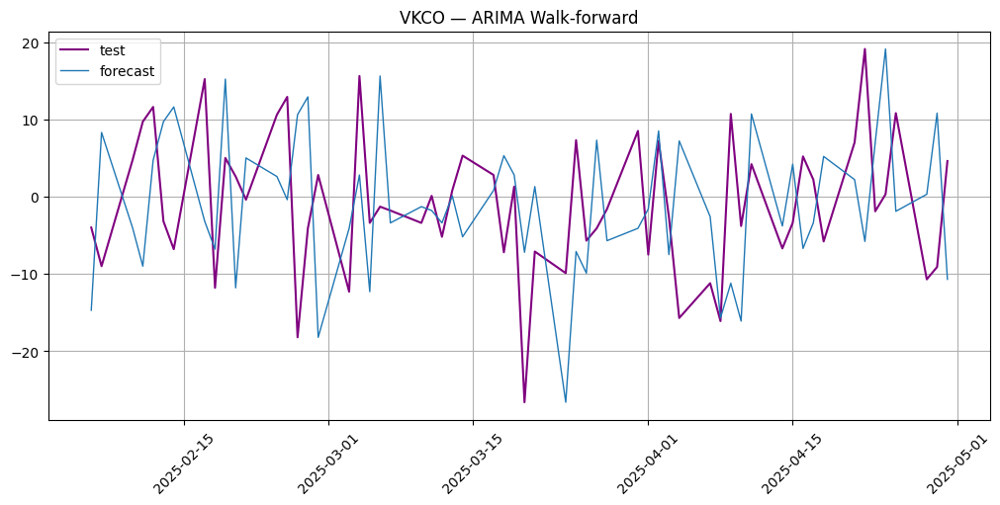

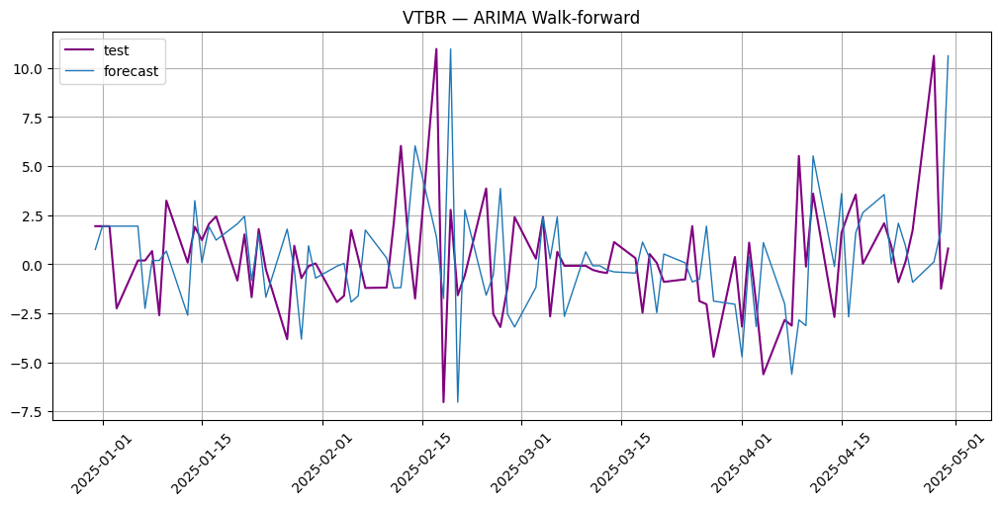

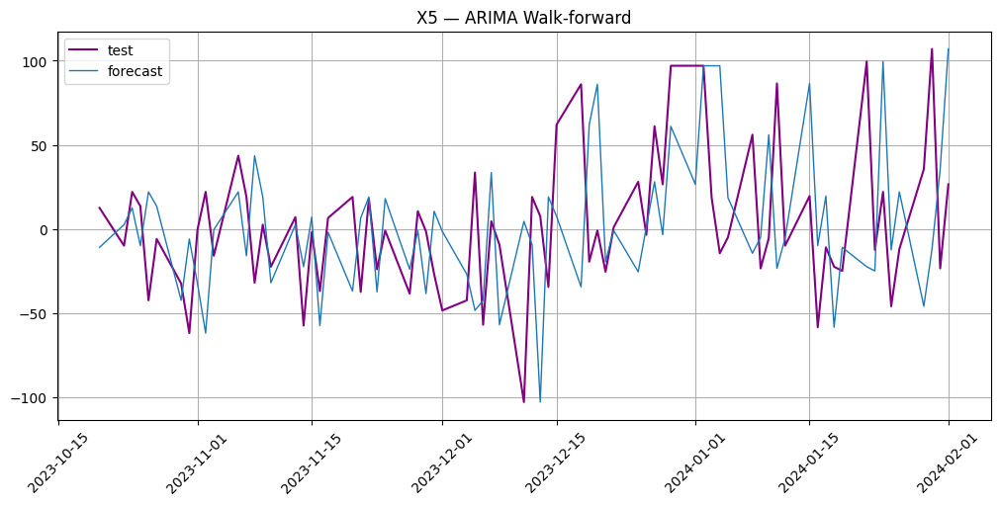

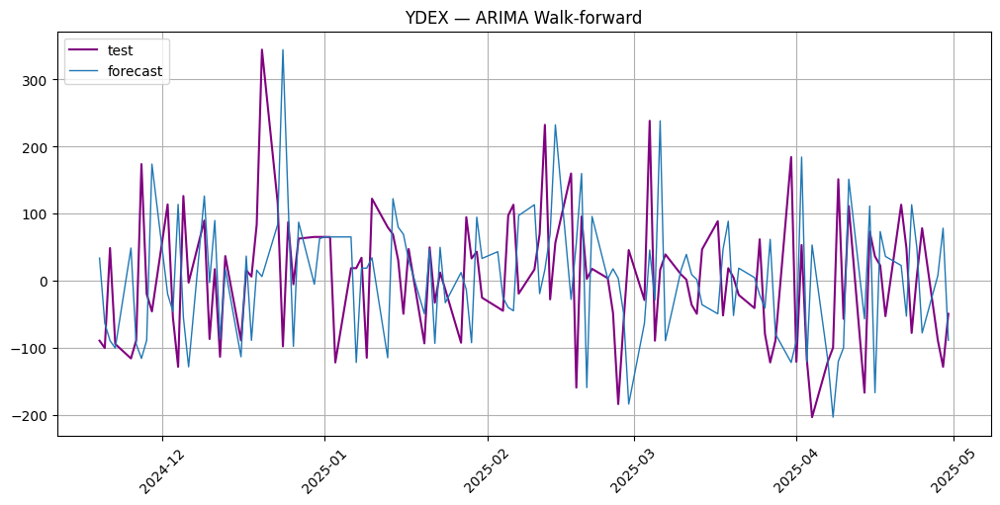


=== Итоговая таблица метрик ARIMA ===


,MAE,MAPE (%),RMSE,SMAPE (%),DA (%),Forecast time (s)
AFLT,1.889,63142857142857264.000,2.528,135.932,45.763,0.228
LKOH,124.878,5052100840336134144.000,170.082,144.996,46.610,0.224
MOEX,4.607,174705882352941408.000,5.834,139.553,41.525,0.229
NVTK,34.210,1310420168067226112.000,45.240,139.624,46.610,0.229
PIKK,22.218,975462184873950208.000,28.517,134.981,48.305,0.229
SBER,5.765,204974789915966592.000,7.693,144.110,53.390,0.228
VKCO,10.795,441666666666666880.000,12.725,151.122,47.458,0.127
VTBR,2.682,85057471264368160.000,3.591,144.446,50.000,0.170
X5,43.047,1484000000000000000.000,54.438,148.681,51.351,0.159
YDEX,98.248,3155128205128205312.000,128.059,133.466,48.276,0.230


In [29]:
results_map = {}

for ticker, (full_ts, train_ts, test_ts) in diff_series.items():
    # 1) Собираем history_df из train_ts
    #    Получаем широкую таблицу и вынимаем нужную серию
    df_train_wide = train_ts.to_pandas(flatten=False)
    train_series = df_train_wide[(ticker, "target")]
    history_df = pd.DataFrame({
        "timestamp": train_series.index,
        "segment":   [ticker] * len(train_series),
        "target":    train_series.values
    })

    # 2) Готовим реальные значения теста
    df_test_wide = test_ts.to_pandas(flatten=False)
    y_test = df_test_wide[(ticker, "target")]

    preds = []
    times = []

    count = 0
    # 3) Walk-forward итерации по каждому таймстемпу в тесте
    for idx in y_test.index:
        #print(str(count) + " from " + str(len(y_test.index)))
        # 3.1) Формируем TSDataset из накопленного history_df
        history_ts = TSDataset(df=history_df.copy(), freq=train_ts.freq)

        # 3.2) Инициализируем AutoARIMA и меряем время fit+forecast на 1 шаг
        model = StatsForecastARIMAModel(order=(0, 1, 0))
        t0 = time.time()
        model.fit(history_ts)
        forecast_step = model.predict(ts=history_ts)
        t1 = time.time()
        times.append(t1 - t0)
        #print(t1 - t0)

        # 3.3) Забираем предсказание последнего ряда
        df_forecast_wide = forecast_step.to_pandas(flatten=False)
        p = df_forecast_wide[(ticker, "target")].iloc[-1]
        preds.append(p)

        # 3.4) Добавляем в history_df реальное значение для следующего шага
        history_df = pd.concat([
            history_df,
            pd.DataFrame({
                "timestamp": [idx],
                "segment":   [ticker],
                "target":    [y_test.loc[idx]]
            })
        ], ignore_index=True)
        count += 1

    # 4) Собираем TSDataset из всех предсказаний
    forecast_df = pd.DataFrame({
        "timestamp": y_test.index.tolist(),
        "segment":   [ticker] * len(preds),
        "target":    preds
    })
    forecast_ts = TSDataset(df=forecast_df, freq=train_ts.freq)

    # 5) Считаем метрики
    mae_v   = MAE()(test_ts,   forecast_ts)[ticker]
    mape_v  = MAPE()(test_ts,  forecast_ts)[ticker]
    rmse_v  = RMSE()(test_ts,  forecast_ts)[ticker]
    smape_v = SMAPE()(test_ts, forecast_ts)[ticker]
    da_v    = directional_accuracy(y_test.values, np.array(preds))

    results_map[ticker] = {
        "MAE":       mae_v,
        #"MAPE (%)":  mape_v,
        "RMSE":      rmse_v,
        "SMAPE (%)": smape_v,
        "DA (%)":    da_v,
        "Forecast time (s)": np.mean(times)
    }

    # 6) Визуализация
    plot_forecast(forecast_ts, test_ts)
    plt.title(f"{ticker} — ARIMA Walk-forward")
    plt.show()

# 7) Сводная таблица
metrics_df = pd.DataFrame.from_dict(results_map, orient="index")
metrics_df.loc["AVERAGE"] = metrics_df.mean(numeric_only=True)
metrics_df = metrics_df.round(3)

print("\n=== Итоговая таблица метрик ARIMA ===")
display(metrics_df)


Processing: AFLT


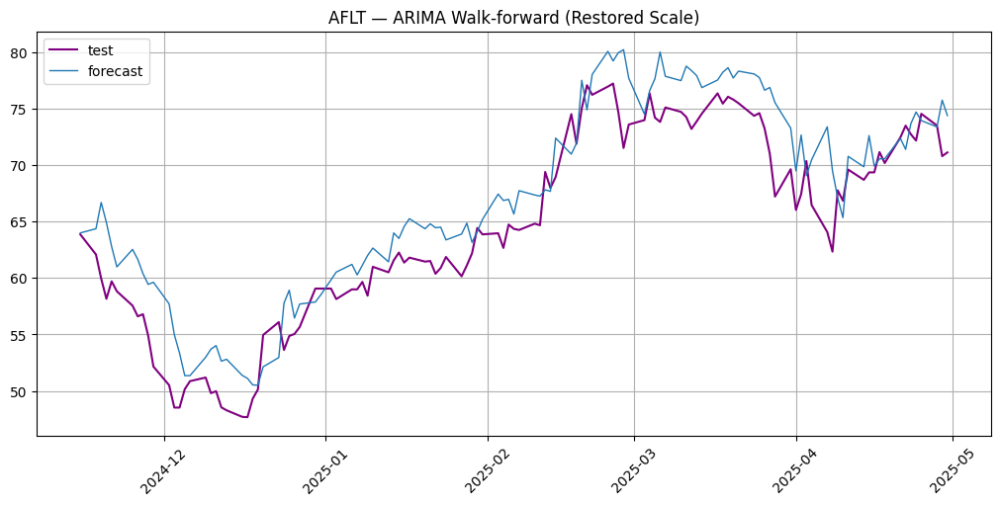


Processing: LKOH


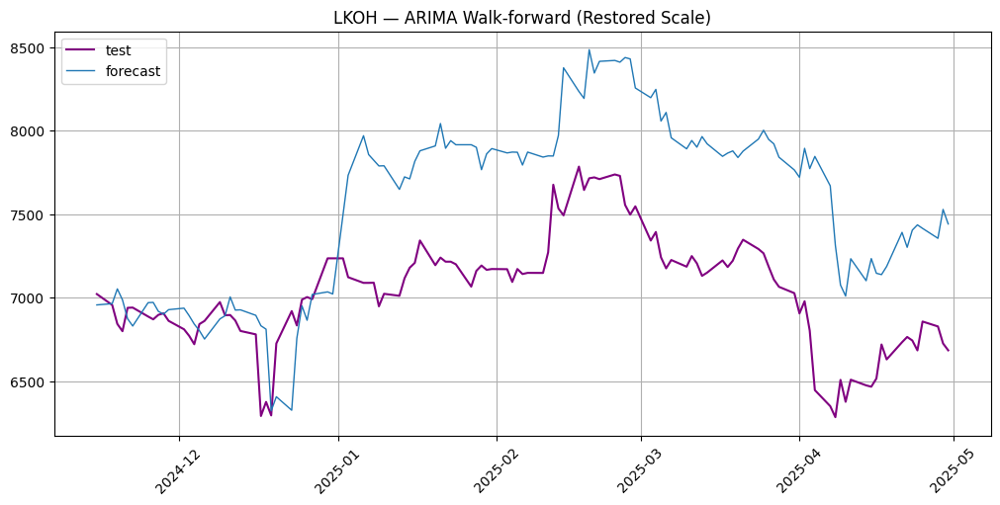


Processing: MOEX


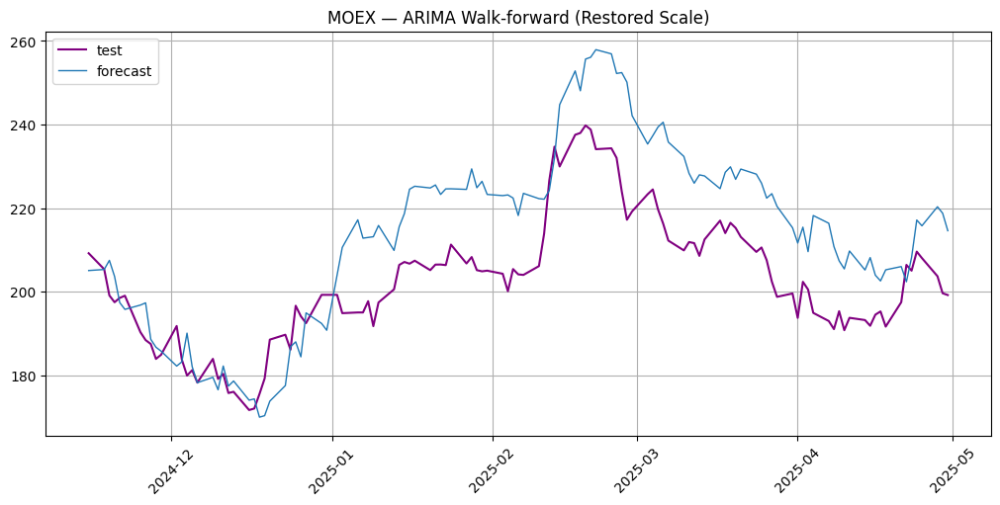


Processing: NVTK


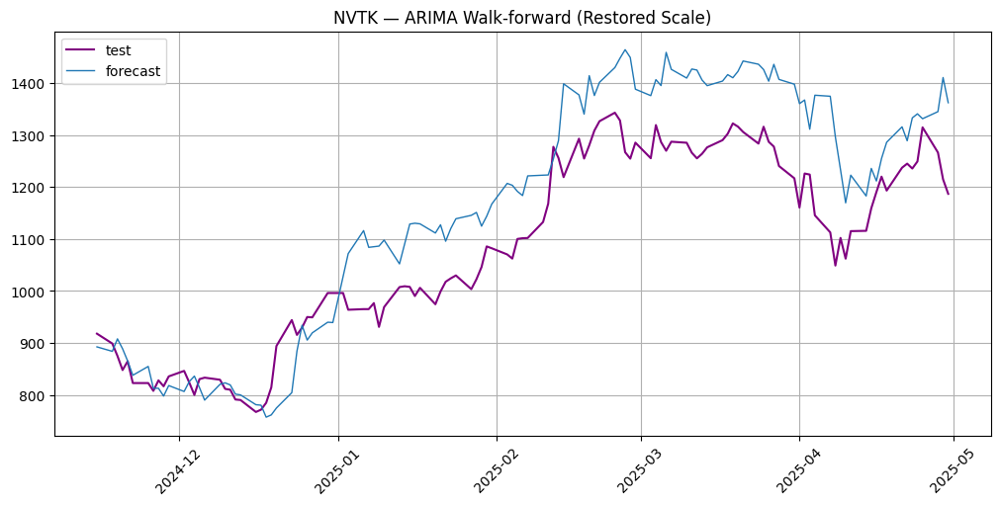


Processing: PIKK


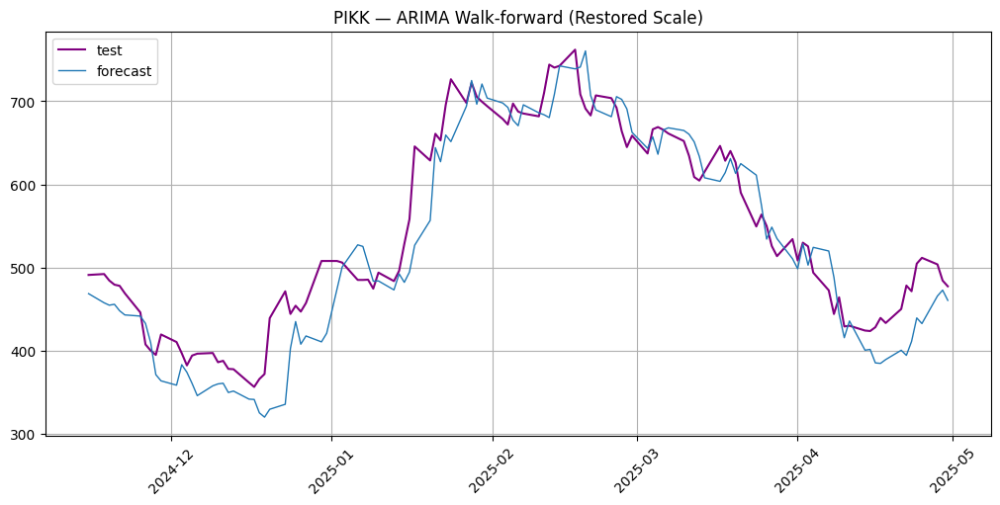


Processing: SBER


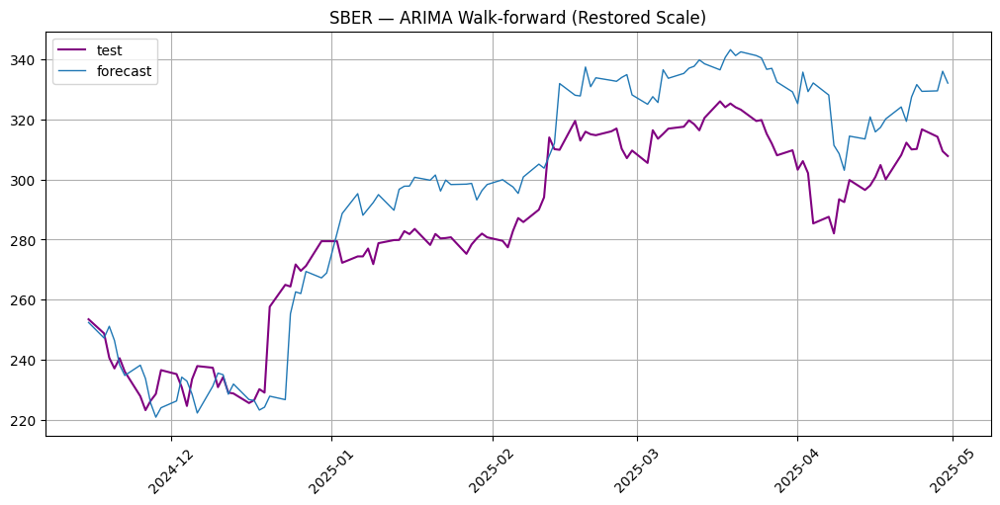


Processing: VKCO


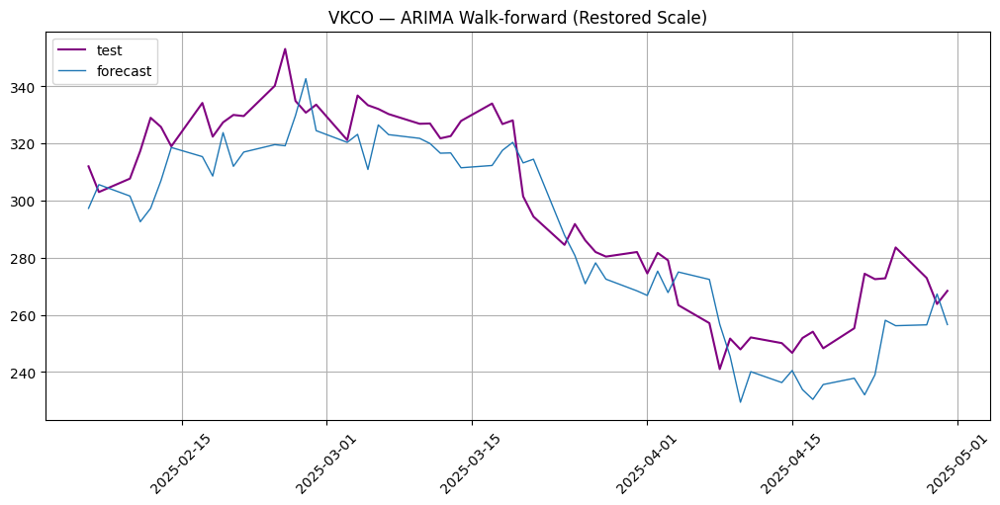


Processing: VTBR


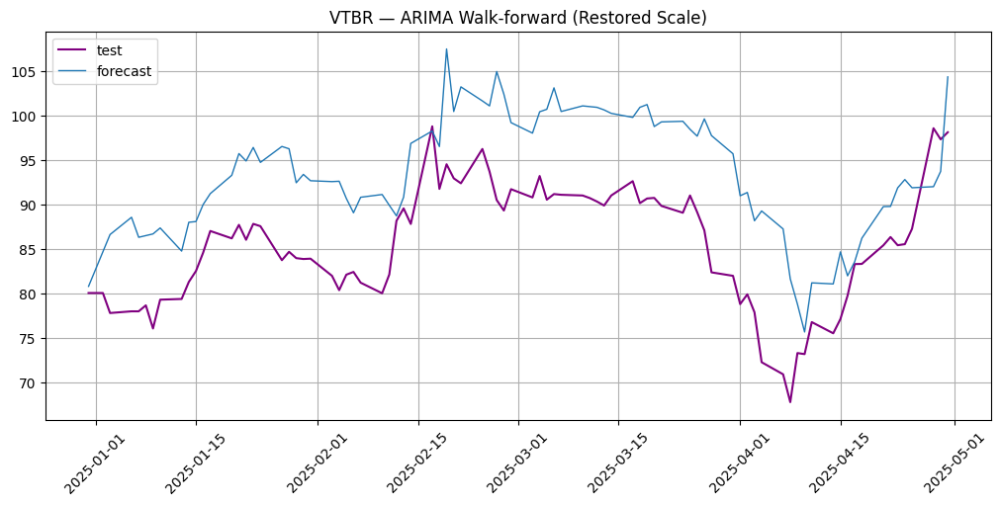


Processing: X5


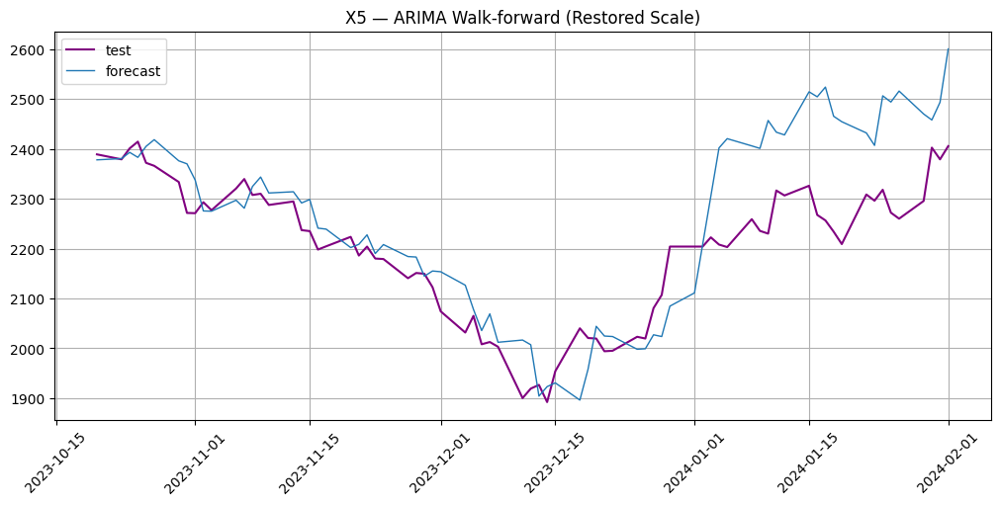


Processing: YDEX


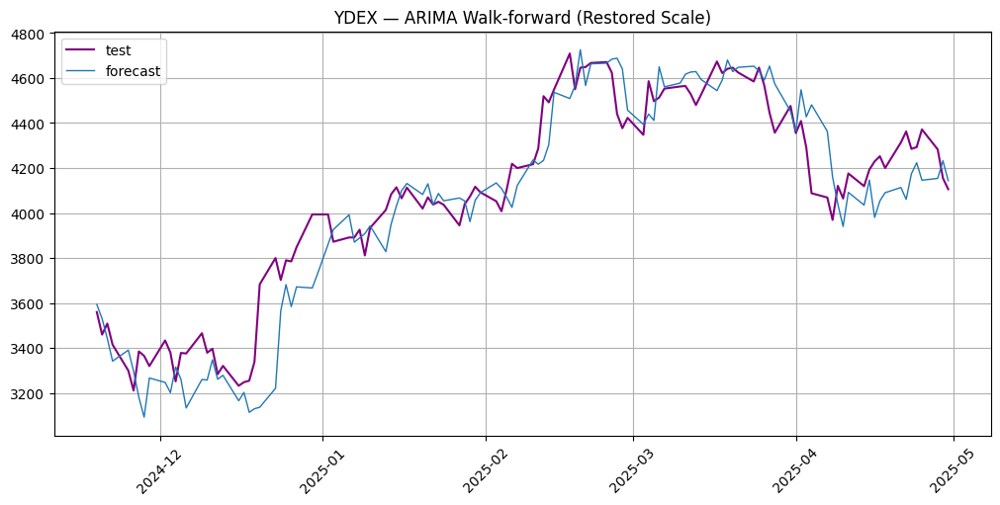


=== Итоговая таблица метрик ARIMA (в исходном масштабе) ===


,MAE,MAPE (%),RMSE,SMAPE (%),DA (%),Forecast time (s)
AFLT,2.922,4.690,3.527,4.540,48.305,0.222
LKOH,545.773,7.748,626.413,7.381,46.610,0.226
MOEX,12.746,6.202,14.694,5.982,49.153,0.230
NVTK,91.108,8.122,108.628,7.745,49.153,0.228
PIKK,31.561,6.200,40.317,6.465,52.542,0.235
SBER,15.070,5.191,17.279,5.068,44.915,0.227
VKCO,13.458,4.585,15.979,4.711,45.763,0.124
VTBR,8.131,9.642,8.902,9.114,54.651,0.174
X5,81.187,3.661,110.045,3.564,47.297,0.155
YDEX,115.479,2.904,154.307,2.949,52.586,0.232


In [30]:
results_map = {}

for ticker, (full_ts, train_ts, test_ts) in diff_series.items():
    print(f"\nProcessing: {ticker}")

    # 1) Подготовка стационарного history_df из train_ts
    df_train_wide = train_ts.to_pandas(flatten=False)
    train_series = df_train_wide[(ticker, "target")]
    history_df = pd.DataFrame({
        "timestamp": train_series.index,
        "segment":   [ticker] * len(train_series),
        "target":    train_series.values
    })

    # 2) Подготовка тестовых значений в преобразованном виде
    df_test_wide = test_ts.to_pandas(flatten=False)
    y_test = df_test_wide[(ticker, "target")]

    preds = []
    times = []

    # 3) Walk-forward прогнозы
    for idx in y_test.index:
        history_ts = TSDataset(df=history_df.copy(), freq=train_ts.freq)

        model = StatsForecastARIMAModel(order=(0, 1, 0))
        t0 = time.time()
        model.fit(history_ts)
        forecast_step = model.predict(ts=history_ts)
        t1 = time.time()
        times.append(t1 - t0)

        df_forecast_wide = forecast_step.to_pandas(flatten=False)
        p = df_forecast_wide[(ticker, "target")].iloc[-1]
        preds.append(p)

        # Подкладываем настоящее значение
        history_df = pd.concat([
            history_df,
            pd.DataFrame({
                "timestamp": [idx],
                "segment":   [ticker],
                "target":    [y_test.loc[idx]]
            })
        ], ignore_index=True)

    # 4) Восстановим значения в исходном масштабе
    original_df = series[ticker][0].to_pandas(flatten=False)
    original_series = original_df[(ticker, "target")]

    test_start = y_test.index[0]
    original_test = original_series[original_series.index >= test_start]

    last_train_val = original_series[original_series.index < test_start].iloc[-1]

    # inverse_transform: метод = 'diff'
    recovered_preds = inverse_transform(
        original_ts=original_series[:test_start],
        transformed_predictions=preds,
        method='diff'
    )

    # 5) Подготовим прогноз в формате TSDataset
    recovered_df = pd.DataFrame({
        "timestamp": original_test.index[:len(recovered_preds)],
        "segment":   [ticker] * len(recovered_preds),
        "target":    recovered_preds
    })
    recovered_forecast_ts = TSDataset(df=recovered_df, freq=train_ts.freq)

    # 6) Подготовим true значения оригинального теста
    true_test_df = pd.DataFrame({
        "timestamp": original_test.index[:len(recovered_preds)],
        "segment":   [ticker] * len(recovered_preds),
        "target":    original_test.values[:len(recovered_preds)]
    })
    true_test_ts = TSDataset(df=true_test_df, freq=train_ts.freq)

    # 7) Метрики на оригинальном масштабе
    mae_v   = MAE()(true_test_ts,   recovered_forecast_ts)[ticker]
    mape_v  = MAPE()(true_test_ts,  recovered_forecast_ts)[ticker]
    rmse_v  = RMSE()(true_test_ts,  recovered_forecast_ts)[ticker]
    smape_v = SMAPE()(true_test_ts, recovered_forecast_ts)[ticker]
    da_v    = directional_accuracy(true_test_df["target"].values, recovered_preds)

    results_map[ticker] = {
        "MAE":       mae_v,
        "MAPE (%)":  mape_v,
        "RMSE":      rmse_v,
        "SMAPE (%)": smape_v,
        "DA (%)":    da_v,
        "Forecast time (s)": np.mean(times)
    }

    # 8) Визуализация
    plot_forecast(recovered_forecast_ts, true_test_ts)
    plt.title(f"{ticker} — ARIMA Walk-forward (Restored Scale)")
    plt.show()

# 9) Сводная таблица
metrics_df = pd.DataFrame.from_dict(results_map, orient="index")
metrics_df.loc["AVERAGE"] = metrics_df.mean(numeric_only=True)
metrics_df = metrics_df.round(3)

print("\n=== Итоговая таблица метрик ARIMA (в исходном масштабе) ===")
display(metrics_df)

## AutoArima

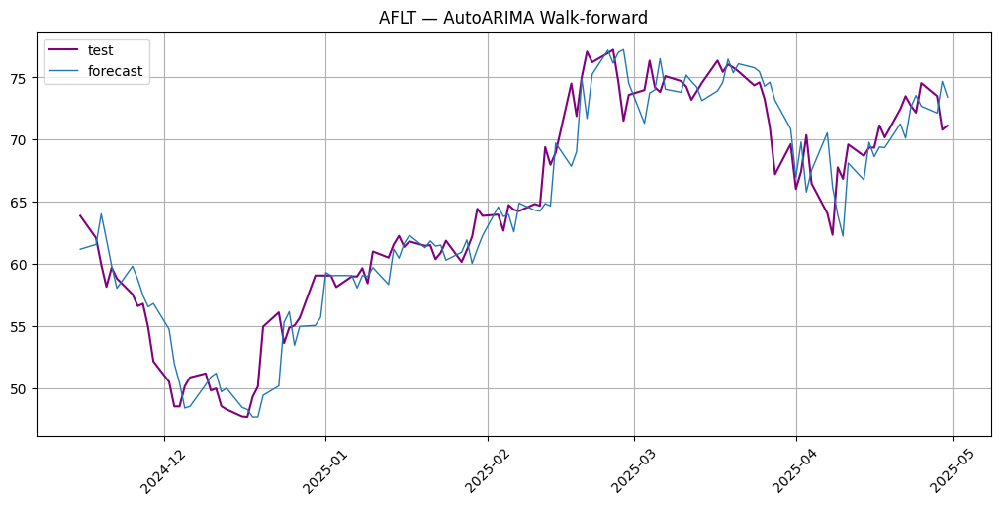

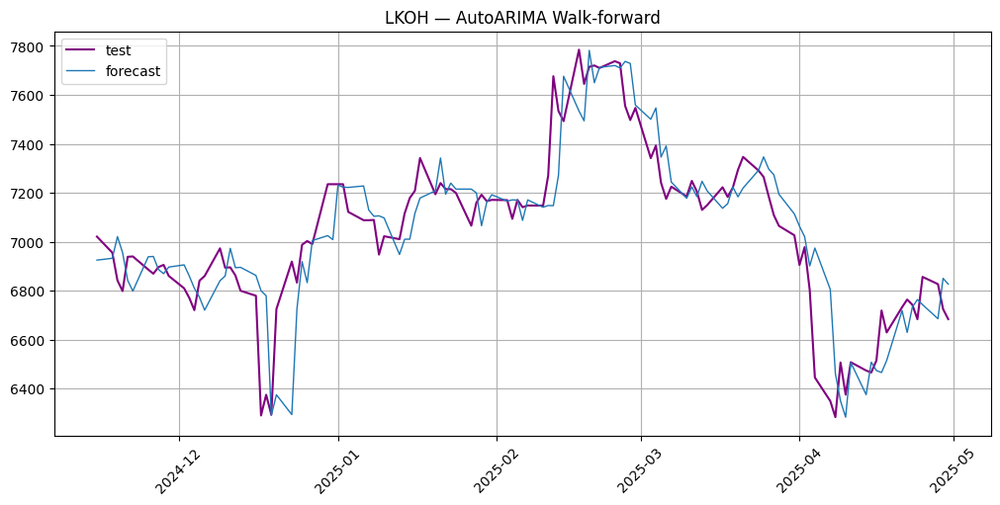

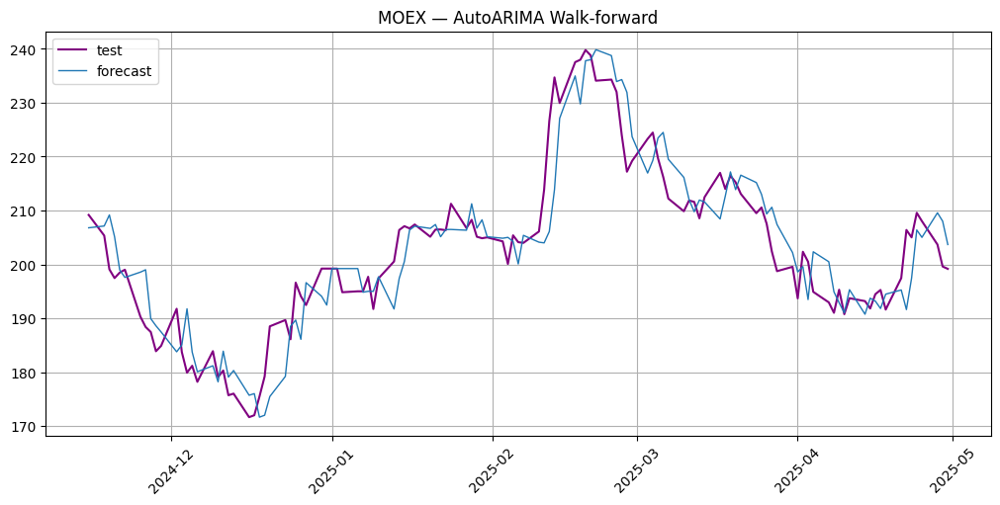

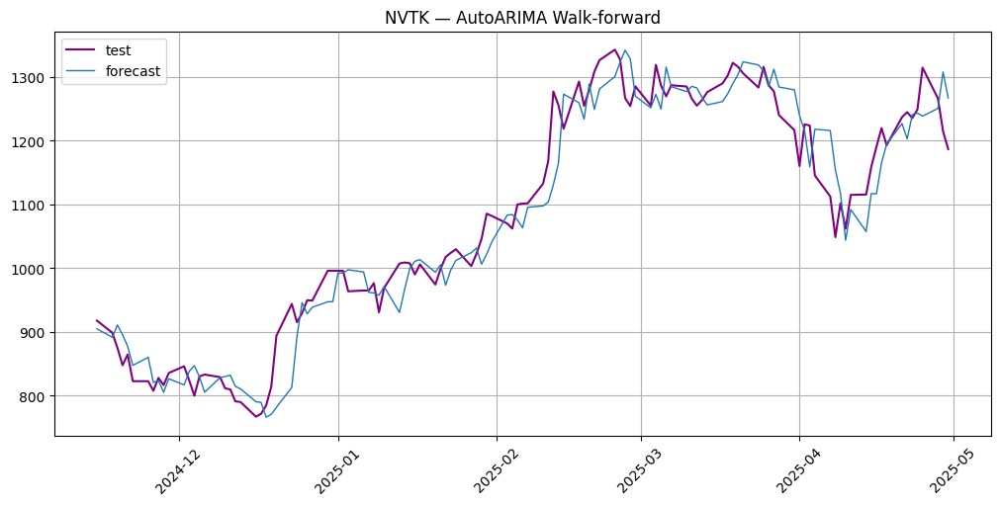

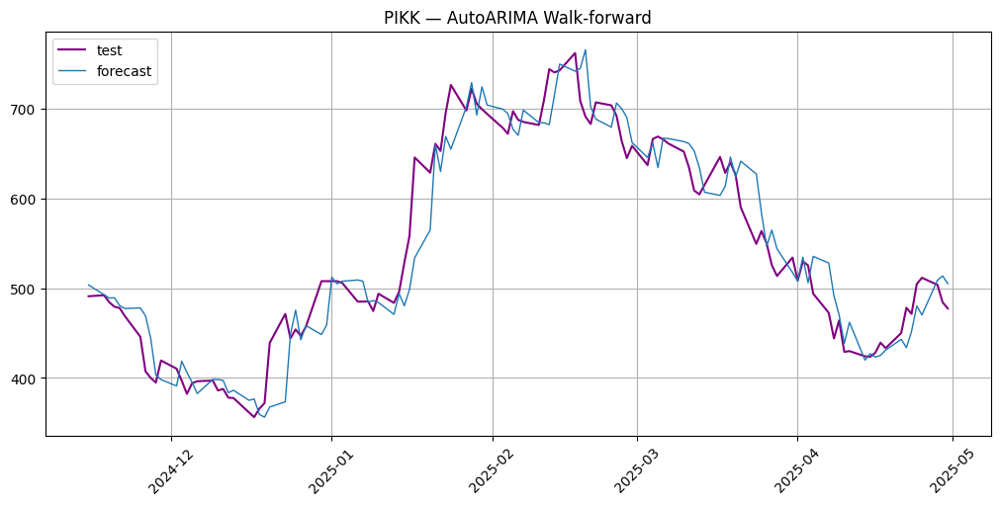

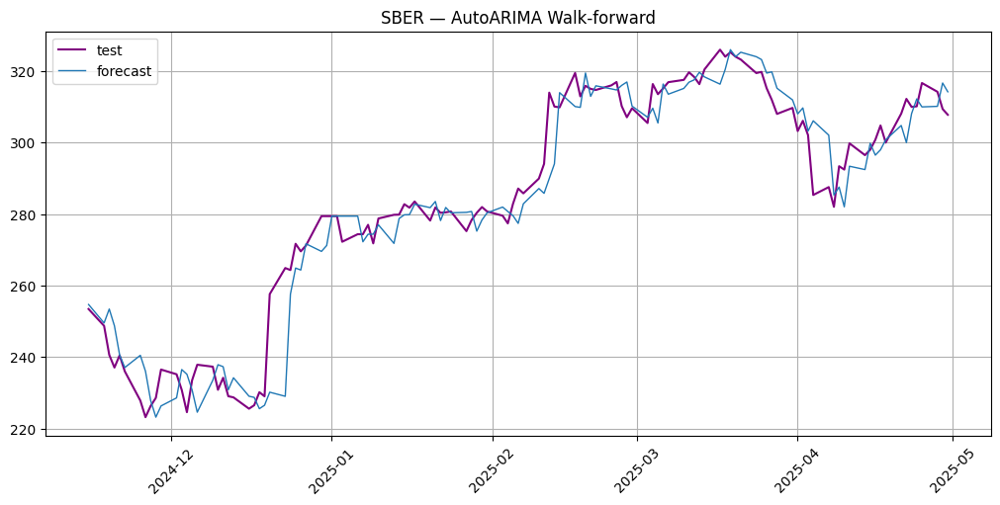

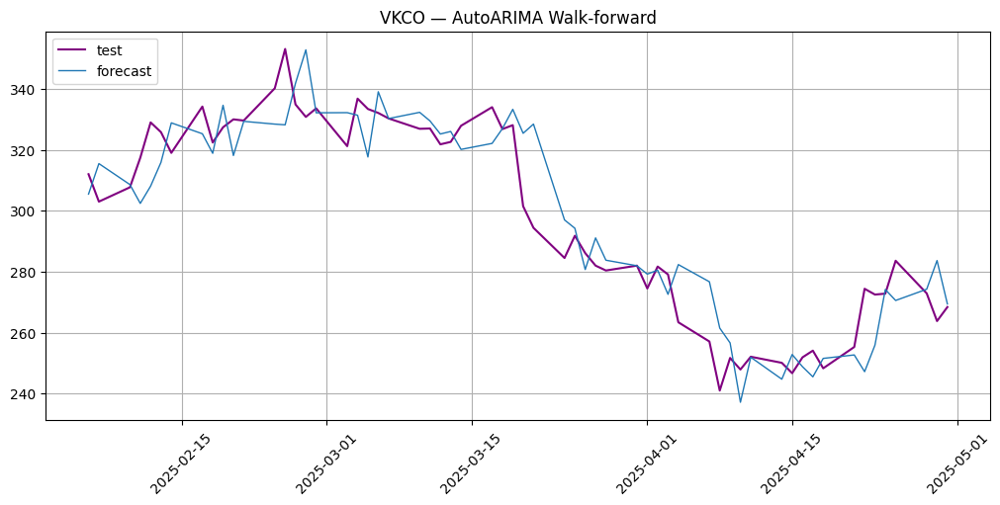

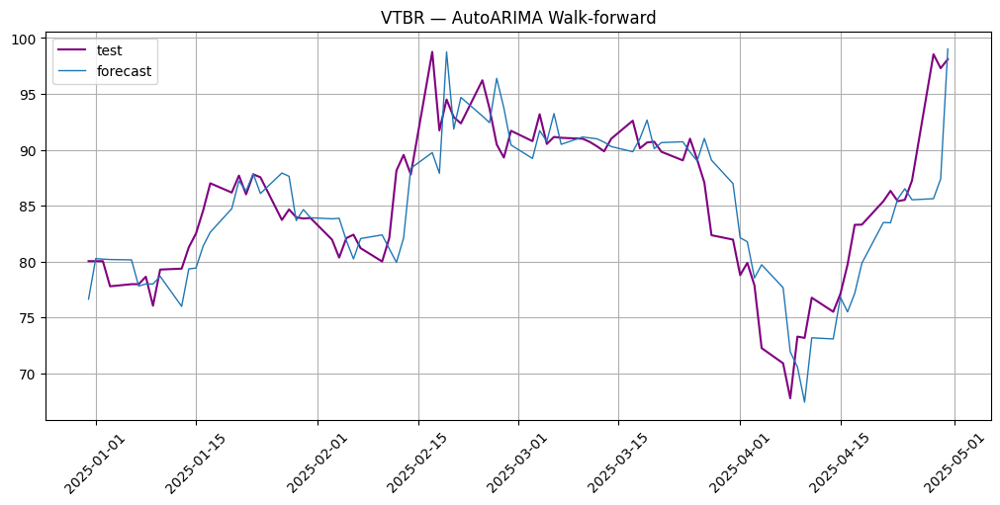

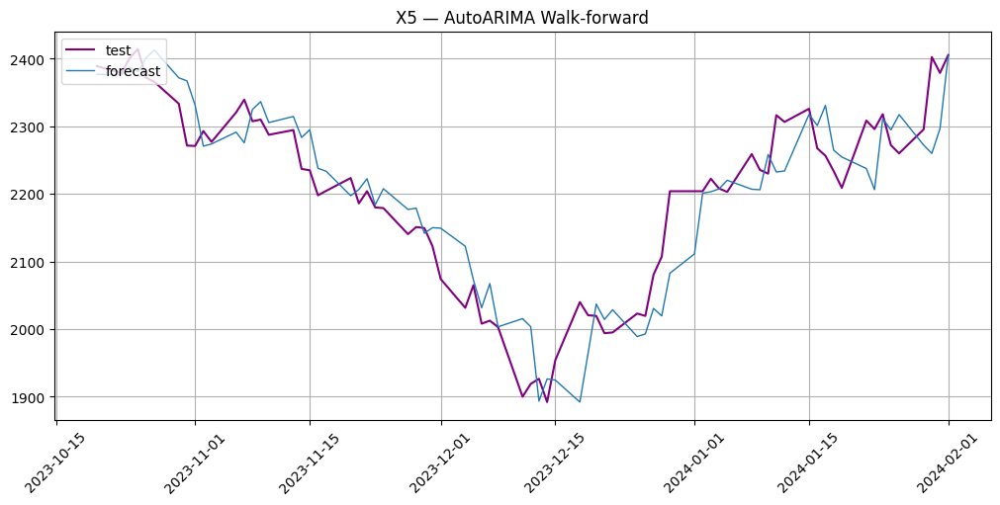

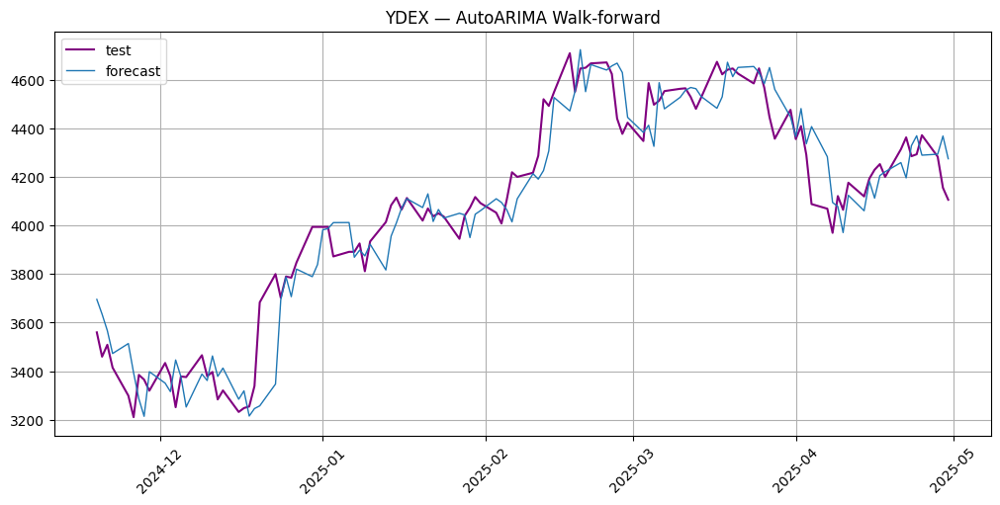


=== Итоговая таблица метрик AutoARIMA ===


,MAE,MAPE (%),RMSE,SMAPE (%),DA (%),Forecast time (s)
AFLT,1.841,2.913,2.412,2.919,50.847,7.740
LKOH,111.588,1.605,160.404,1.603,45.763,9.068
MOEX,4.514,2.224,5.974,2.229,49.153,4.492
NVTK,33.113,3.062,43.849,3.081,48.305,46.346
PIKK,22.509,4.200,31.273,4.224,50.847,51.095
SBER,5.315,1.924,7.627,1.938,44.915,4.076
VKCO,9.015,3.055,11.906,3.042,38.983,16.527
VTBR,2.565,3.022,3.571,3.044,54.651,7.358
X5,41.852,1.921,53.487,1.926,47.297,18.338
YDEX,90.814,2.277,124.427,2.286,53.448,34.957


In [18]:
results_map = {}

for ticker, (full_ts, train_ts, test_ts) in series.items():
    # 1) Собираем history_df из train_ts
    #    Получаем широкую таблицу и вынимаем нужную серию
    df_train_wide = train_ts.to_pandas(flatten=False)
    train_series = df_train_wide[(ticker, "target")]
    history_df = pd.DataFrame({
        "timestamp": train_series.index,
        "segment":   [ticker] * len(train_series),
        "target":    train_series.values
    })

    # 2) Готовим реальные значения теста
    df_test_wide = test_ts.to_pandas(flatten=False)
    y_test = df_test_wide[(ticker, "target")]

    preds = []
    times = []

    count = 0
    # 3) Walk-forward итерации по каждому таймстемпу в тесте
    for idx in y_test.index:
        #print(str(count) + " from " + str(len(y_test.index)))
        # 3.1) Формируем TSDataset из накопленного history_df
        history_ts = TSDataset(df=history_df.copy(), freq=train_ts.freq)

        # 3.2) Инициализируем AutoARIMA и меряем время fit+forecast на 1 шаг
        model = AutoARIMAModel()
        t0 = time.time()
        model.fit(history_ts)
        forecast_step = model.predict(ts=history_ts)
        t1 = time.time()
        times.append(t1 - t0)
        #print(t1 - t0)

        # 3.3) Забираем предсказание последнего ряда
        df_forecast_wide = forecast_step.to_pandas(flatten=False)
        p = df_forecast_wide[(ticker, "target")].iloc[-1]
        preds.append(p)

        # 3.4) Добавляем в history_df реальное значение для следующего шага
        history_df = pd.concat([
            history_df,
            pd.DataFrame({
                "timestamp": [idx],
                "segment":   [ticker],
                "target":    [y_test.loc[idx]]
            })
        ], ignore_index=True)
        count += 1

    # 4) Собираем TSDataset из всех предсказаний
    forecast_df = pd.DataFrame({
        "timestamp": y_test.index.tolist(),
        "segment":   [ticker] * len(preds),
        "target":    preds
    })
    forecast_ts = TSDataset(df=forecast_df, freq=train_ts.freq)

    # 5) Считаем метрики
    mae_v   = MAE()(test_ts,   forecast_ts)[ticker]
    mape_v  = MAPE()(test_ts,  forecast_ts)[ticker]
    rmse_v  = RMSE()(test_ts,  forecast_ts)[ticker]
    smape_v = SMAPE()(test_ts, forecast_ts)[ticker]
    da_v    = directional_accuracy(y_test.values, np.array(preds))

    results_map[ticker] = {
        "MAE":       mae_v,
        "MAPE (%)":  mape_v,
        "RMSE":      rmse_v,
        "SMAPE (%)": smape_v,
        "DA (%)":    da_v,
        "Forecast time (s)": np.mean(times)
    }

    # 6) Визуализация
    plot_forecast(forecast_ts, test_ts)
    plt.title(f"{ticker} — AutoARIMA Walk-forward")
    plt.show()

# 7) Сводная таблица
metrics_df = pd.DataFrame.from_dict(results_map, orient="index")
metrics_df.loc["AVERAGE"] = metrics_df.mean(numeric_only=True)
metrics_df = metrics_df.round(3)

print("\n=== Итоговая таблица метрик AutoARIMA ===")
display(metrics_df)

## TBATS

In [ ]:
# ВЫВОД очищен из-за огромного количества warnings, которые не выходит подавить.

results_map = {}

for ticker, (full_ts, train_ts, test_ts) in series.items():
    # 1) Собираем history_df из train_ts
    #    Получаем широкую таблицу и вынимаем нужную серию
    df_train_wide = train_ts.to_pandas(flatten=False)
    train_series = df_train_wide[(ticker, "target")]
    history_df = pd.DataFrame({
        "timestamp": train_series.index,
        "segment":   [ticker] * len(train_series),
        "target":    train_series.values
    })

    # 2) Готовим реальные значения теста
    df_test_wide = test_ts.to_pandas(flatten=False)
    y_test = df_test_wide[(ticker, "target")]

    preds = []
    times = []

    count = 0
    # 3) Walk-forward итерации по каждому таймстемпу в тесте
    for idx in y_test.index:
        #print(str(count) + " from " + str(len(y_test.index)))
        
        # 3.1) Формируем TSDataset из накопленного history_df
        history_ts = TSDataset(df=history_df.copy(), freq=train_ts.freq)

        # 3.2) Инициализируем AutoARIMA и меряем время fit+forecast на 1 шаг
        model = TBATSModel(
              use_box_cox=True,
              box_cox_bounds=(0, 1),
              use_trend=True,
              use_damped_trend=False,
              seasonal_periods=[],
              use_arma_errors=False,
        )
        t0 = time.time()
        model.fit(history_ts)
        forecast_step = model.predict(ts=history_ts)
        t1 = time.time()
        times.append(t1 - t0)
        print(t1 - t0)

        # 3.3) Забираем предсказание последнего ряда
        df_forecast_wide = forecast_step.to_pandas(flatten=False)
        p = df_forecast_wide[(ticker, "target")].iloc[-1]
        preds.append(p)

        # 3.4) Добавляем в history_df реальное значение для следующего шага
        history_df = pd.concat([
            history_df,
            pd.DataFrame({
                "timestamp": [idx],
                "segment":   [ticker],
                "target":    [y_test.loc[idx]]
            })
        ], ignore_index=True)
        count += 1

    # 4) Собираем TSDataset из всех предсказаний
    forecast_df = pd.DataFrame({
        "timestamp": y_test.index.tolist(),
        "segment":   [ticker] * len(preds),
        "target":    preds
    })
    forecast_ts = TSDataset(df=forecast_df, freq=train_ts.freq)

    # 5) Считаем метрики
    mae_v   = MAE()(test_ts,   forecast_ts)[ticker]
    mape_v  = MAPE()(test_ts,  forecast_ts)[ticker]
    rmse_v  = RMSE()(test_ts,  forecast_ts)[ticker]
    smape_v = SMAPE()(test_ts, forecast_ts)[ticker]
    da_v    = directional_accuracy(y_test.values, np.array(preds))

    results_map[ticker] = {
        "MAE":       mae_v,
        "MAPE (%)":  mape_v,
        "RMSE":      rmse_v,
        "SMAPE (%)": smape_v,
        "DA (%)":    da_v,
        "Forecast time (s)": np.mean(times)
    }

    # 6) Визуализация
    plot_forecast(forecast_ts, test_ts)
    plt.title(f"{ticker} — TBATS Walk-forward")
    plt.show()

# 7) Сводная таблица
metrics_df = pd.DataFrame.from_dict(results_map, orient="index")
metrics_df.loc["AVERAGE"] = metrics_df.mean(numeric_only=True)
metrics_df = metrics_df.round(3)

print("\n=== Итоговая таблица метрик TBATS ===")
display(metrics_df)

## HoltWinters

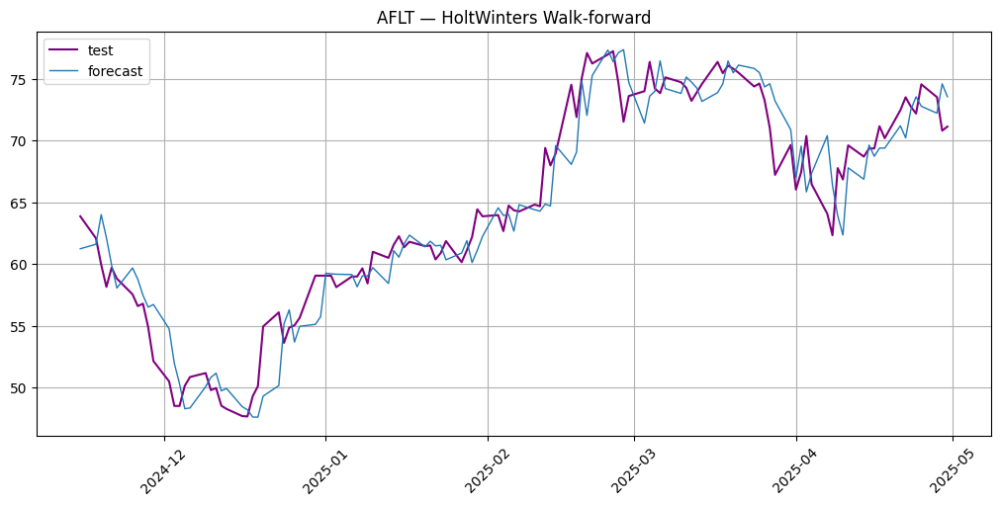

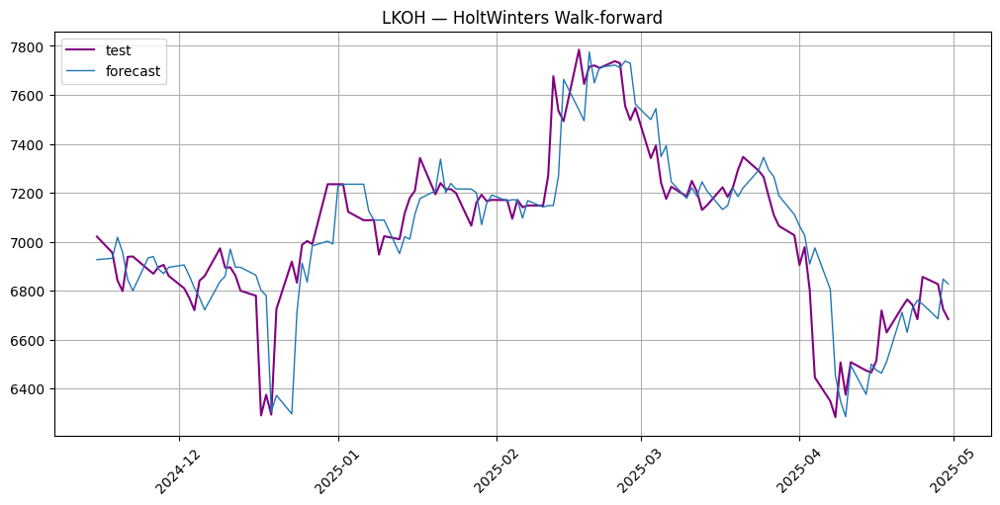

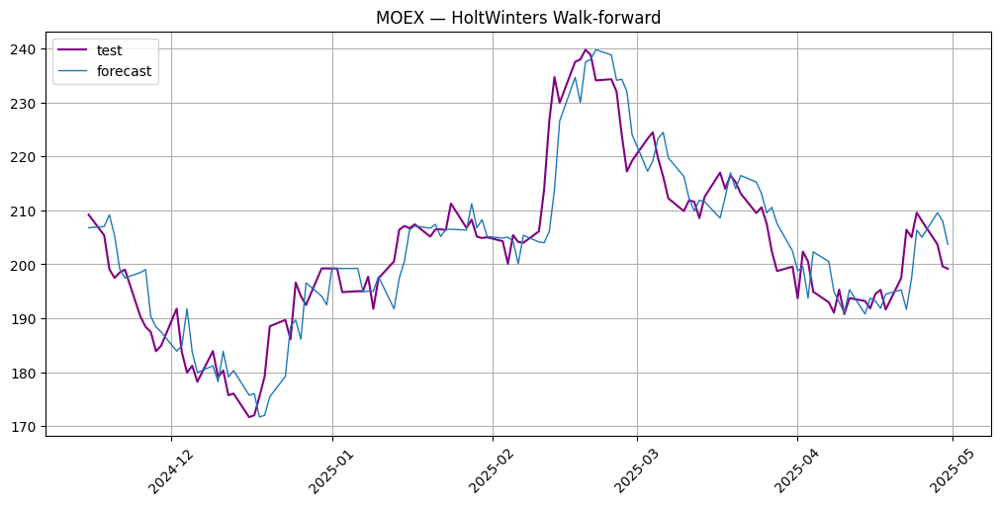

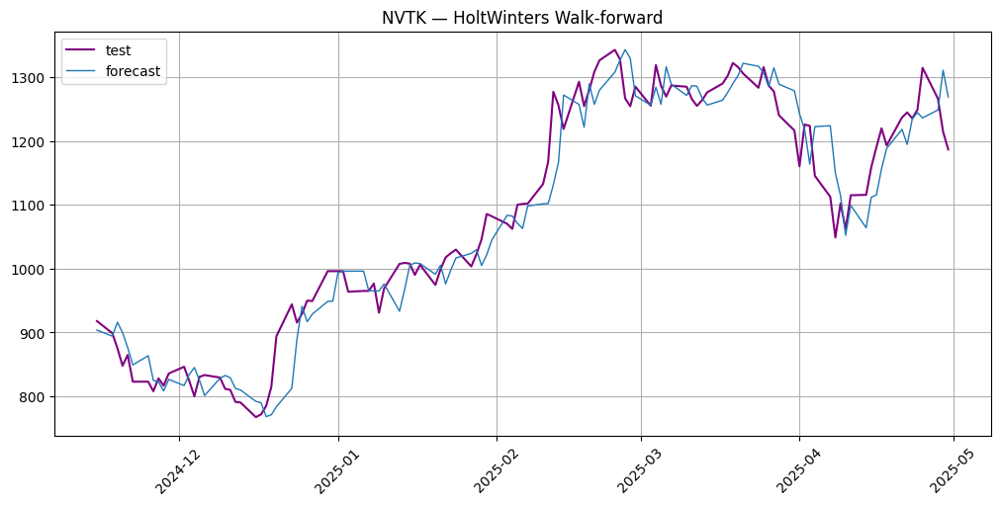

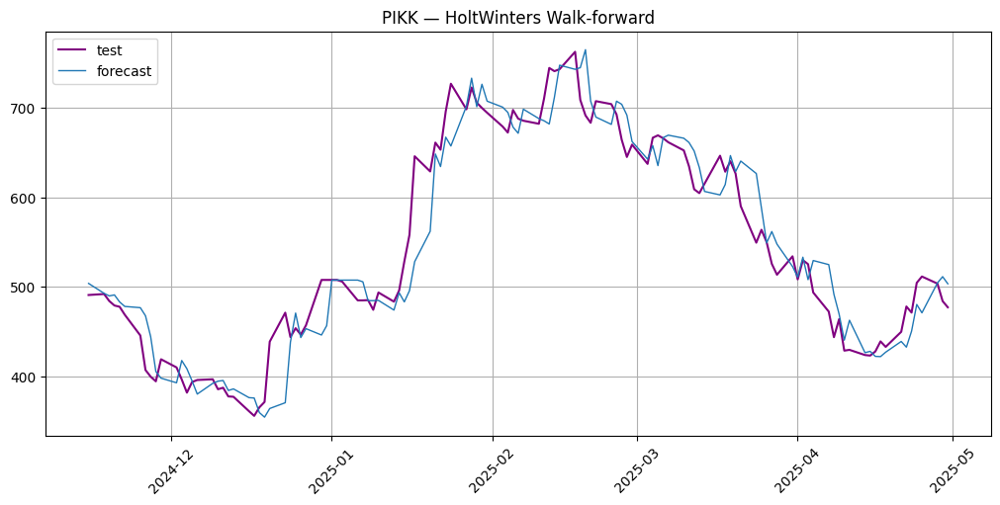

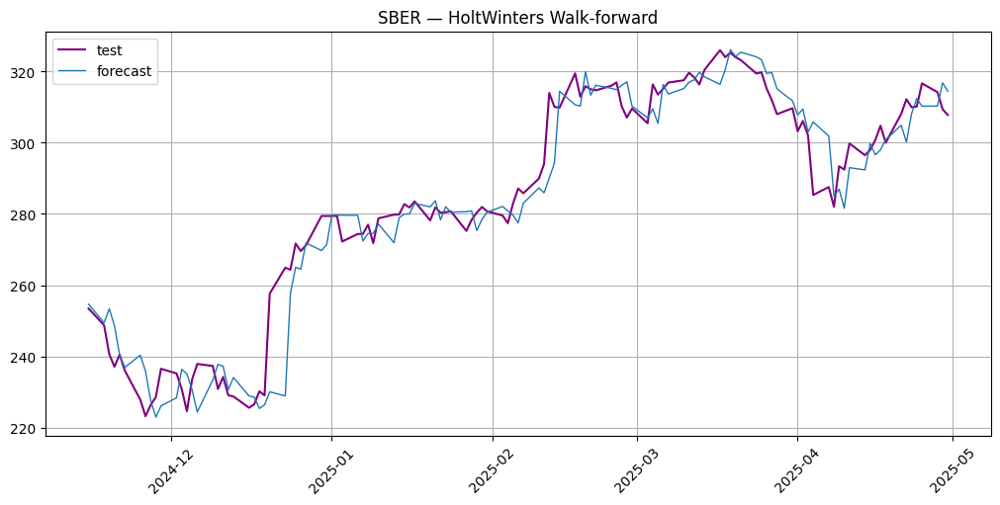

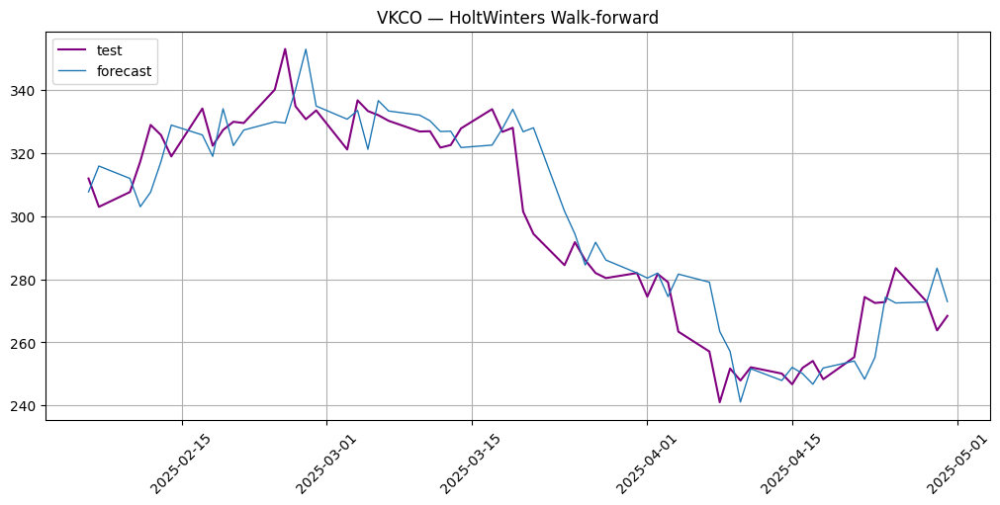

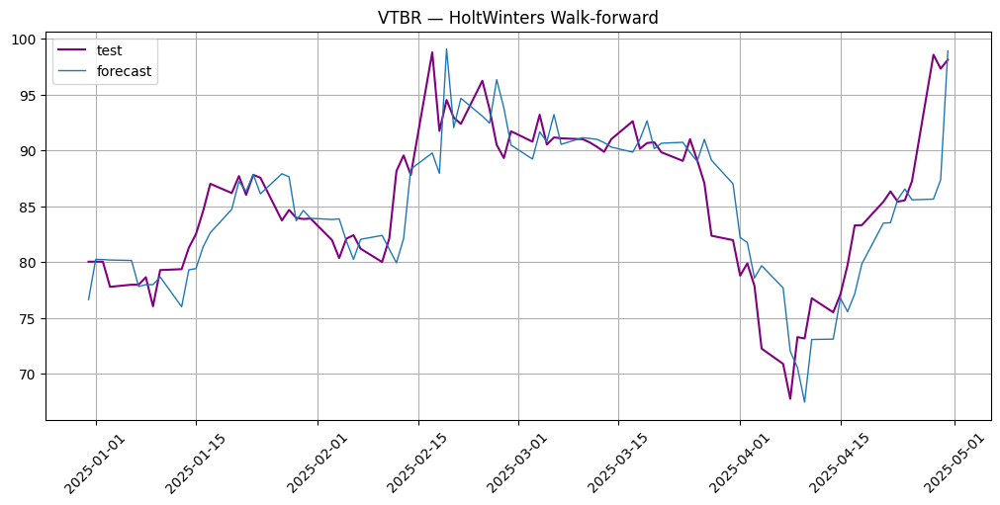

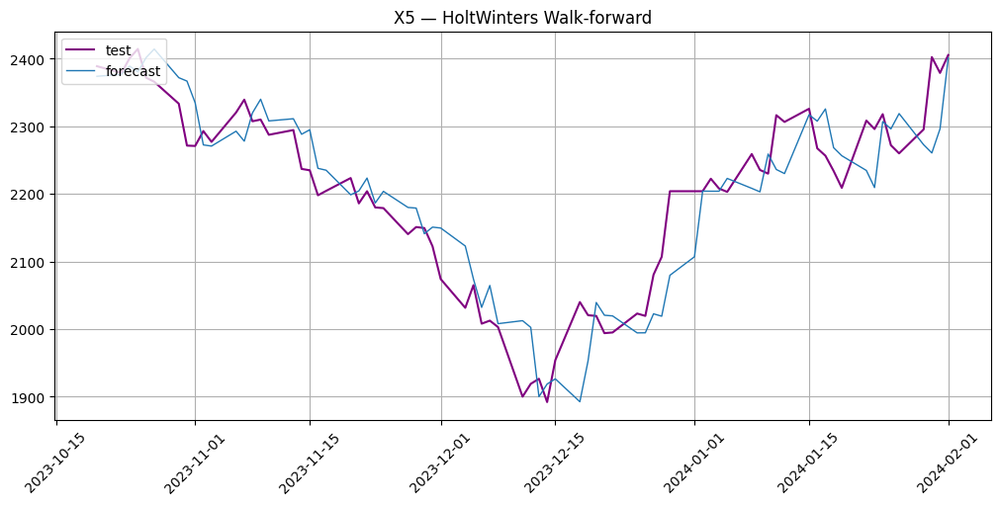

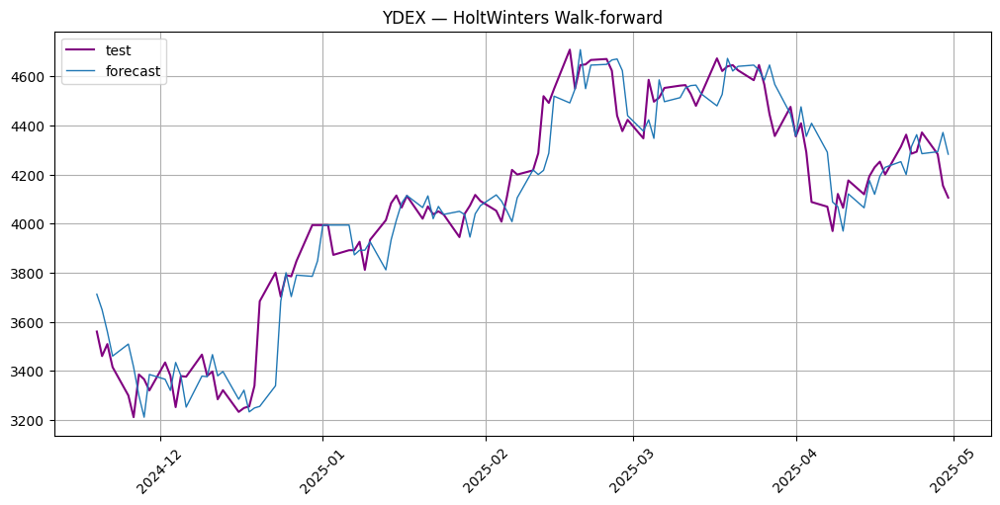


=== Итоговая таблица метрик HoltWinters ===


,MAE,MAPE (%),RMSE,SMAPE (%),DA (%),Forecast time (s)
AFLT,1.830,2.897,2.395,2.903,50.000,0.403
LKOH,111.390,1.602,160.565,1.601,47.458,0.398
MOEX,4.527,2.230,5.981,2.235,49.153,0.391
NVTK,33.112,3.065,44.140,3.083,48.305,0.383
PIKK,22.647,4.225,31.508,4.255,51.695,0.374
SBER,5.294,1.916,7.614,1.931,46.610,0.374
VKCO,8.757,2.971,11.728,2.948,45.763,0.216
VTBR,2.561,3.019,3.573,3.040,53.488,0.295
X5,42.304,1.940,53.774,1.945,45.946,0.266
YDEX,90.565,2.270,125.007,2.279,52.586,0.375


In [97]:
results_map = {}

for ticker, (full_ts, train_ts, test_ts) in series.items():
    # 1) Собираем history_df из train_ts
    #    Получаем широкую таблицу и вынимаем нужную серию
    df_train_wide = train_ts.to_pandas(flatten=False)
    train_series = df_train_wide[(ticker, "target")]
    history_df = pd.DataFrame({
        "timestamp": train_series.index,
        "segment":   [ticker] * len(train_series),
        "target":    train_series.values
    })

    # 2) Готовим реальные значения теста
    df_test_wide = test_ts.to_pandas(flatten=False)
    y_test = df_test_wide[(ticker, "target")]

    preds = []
    times = []

    count = 0
    # 3) Walk-forward итерации по каждому таймстемпу в тесте
    for idx in y_test.index:
        #print(str(count) + " from " + str(len(y_test.index)))
        # 3.1) Формируем TSDataset из накопленного history_df
        history_ts = TSDataset(df=history_df.copy(), freq=train_ts.freq)

        # 3.2) Инициализируем AutoARIMA и меряем время fit+forecast на 1 шаг
        model = HoltWintersModel(
            trend='add',
            damped_trend=True,
            seasonal=None,
            seasonal_periods=None,
            initialization_method='estimated',
            use_boxcox=True,
            bounds={
                'smoothing_level':   (0, 1),
                'smoothing_trend':   (0, 1),
                'smoothing_seasonal': (0, 1)
            },
            missing='drop'
        )
        t0 = time.time()
        model.fit(history_ts)
        forecast_step = model.predict(ts=history_ts)
        t1 = time.time()
        times.append(t1 - t0)

        # 3.3) Забираем предсказание последнего ряда
        df_forecast_wide = forecast_step.to_pandas(flatten=False)
        p = df_forecast_wide[(ticker, "target")].iloc[-1]
        preds.append(p)

        # 3.4) Добавляем в history_df реальное значение для следующего шага
        history_df = pd.concat([
            history_df,
            pd.DataFrame({
                "timestamp": [idx],
                "segment":   [ticker],
                "target":    [y_test.loc[idx]]
            })
        ], ignore_index=True)

        count += 1

    # 4) Собираем TSDataset из всех предсказаний
    forecast_df = pd.DataFrame({
        "timestamp": y_test.index.tolist(),
        "segment":   [ticker] * len(preds),
        "target":    preds
    })
    forecast_ts = TSDataset(df=forecast_df, freq=train_ts.freq)

    # 5) Считаем метрики
    mae_v   = MAE()(test_ts,   forecast_ts)[ticker]
    mape_v  = MAPE()(test_ts,  forecast_ts)[ticker]
    rmse_v  = RMSE()(test_ts,  forecast_ts)[ticker]
    smape_v = SMAPE()(test_ts, forecast_ts)[ticker]
    da_v    = directional_accuracy(y_test.values, np.array(preds))

    results_map[ticker] = {
        "MAE":       mae_v,
        "MAPE (%)":  mape_v,
        "RMSE":      rmse_v,
        "SMAPE (%)": smape_v,
        "DA (%)":    da_v,
        "Forecast time (s)": np.mean(times)
    }

    # 6) Визуализация
    plot_forecast(forecast_ts, test_ts)
    plt.title(f"{ticker} — HoltWinters Walk-forward")
    plt.show()

# 7) Сводная таблица
metrics_df = pd.DataFrame.from_dict(results_map, orient="index")
metrics_df.loc["AVERAGE"] = metrics_df.mean(numeric_only=True)
metrics_df = metrics_df.round(3)

print("\n=== Итоговая таблица метрик HoltWinters ===")
display(metrics_df)

## Theta

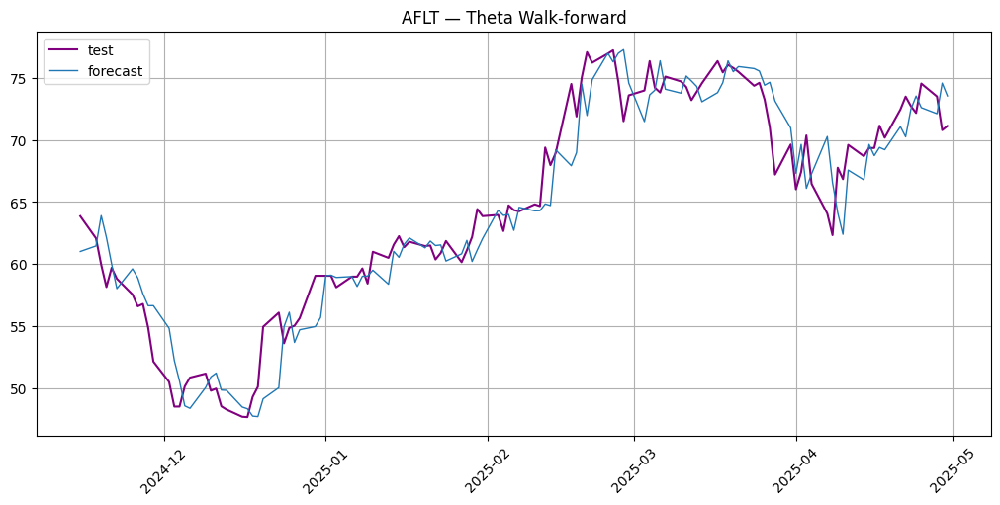

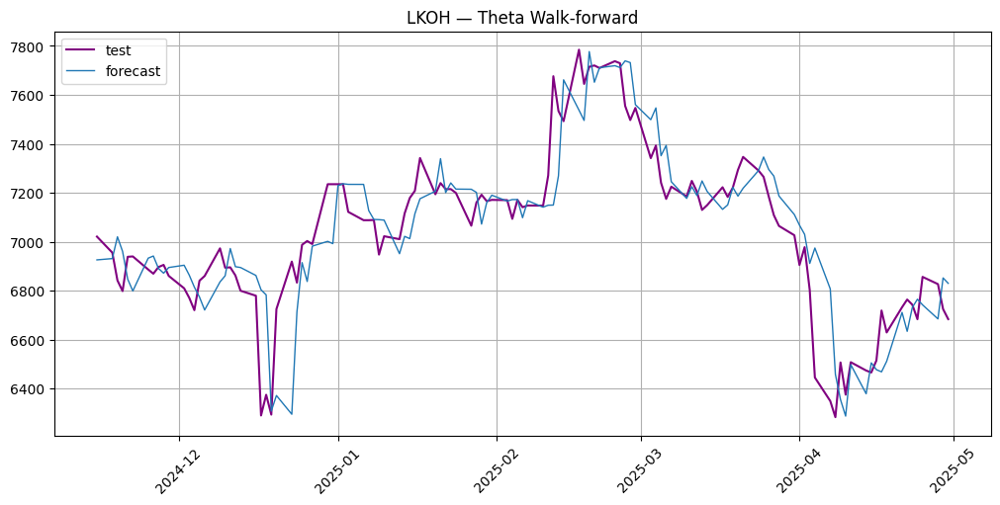

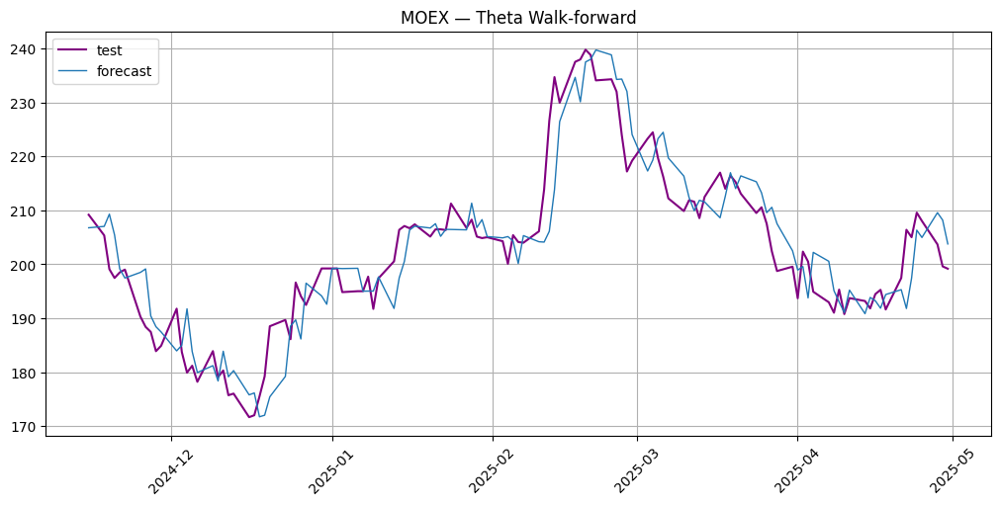

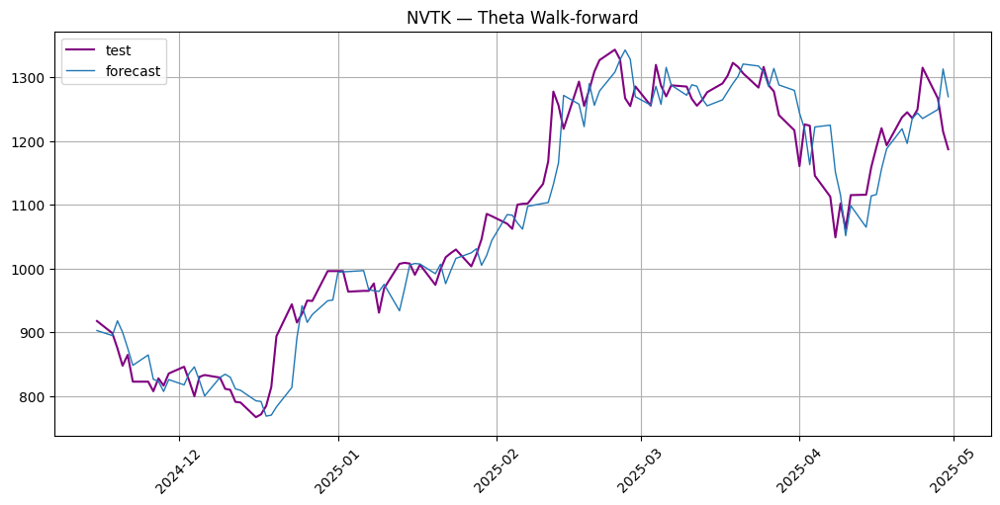

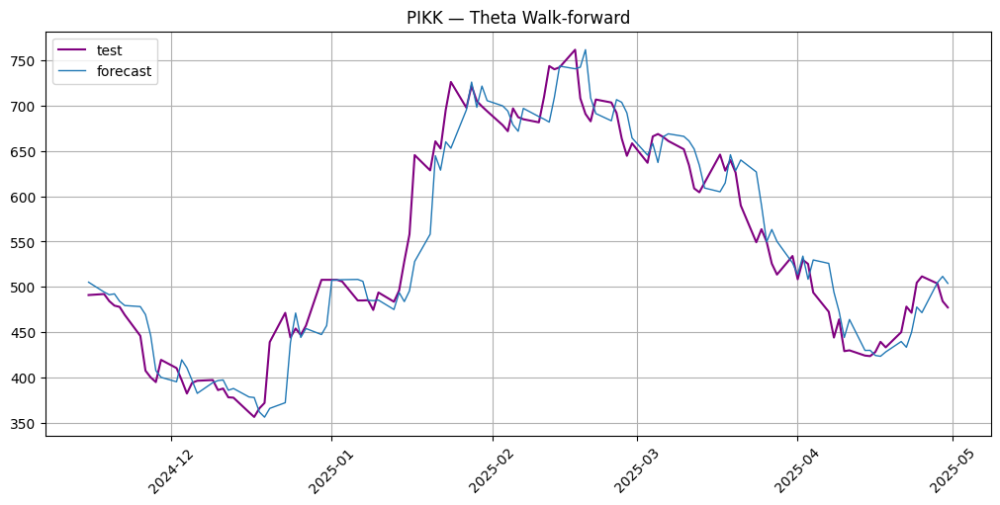

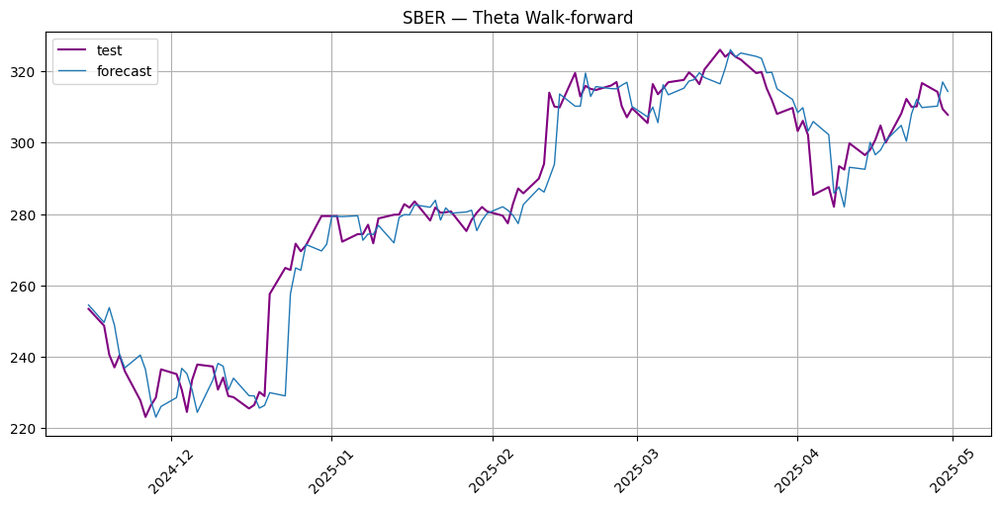

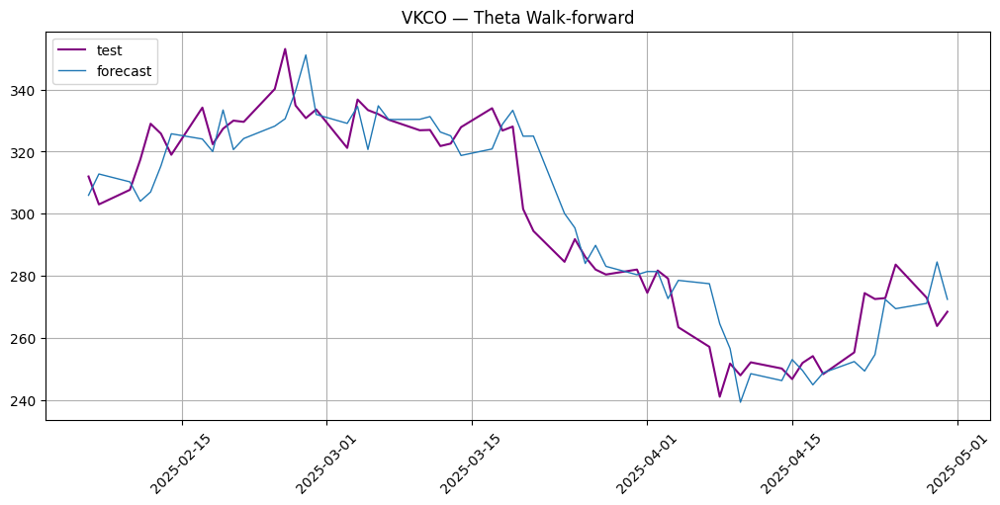

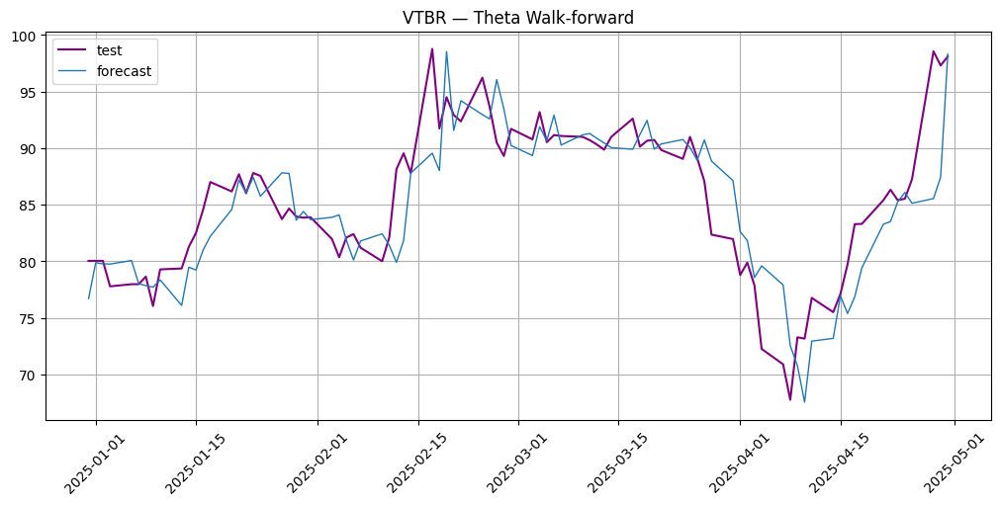

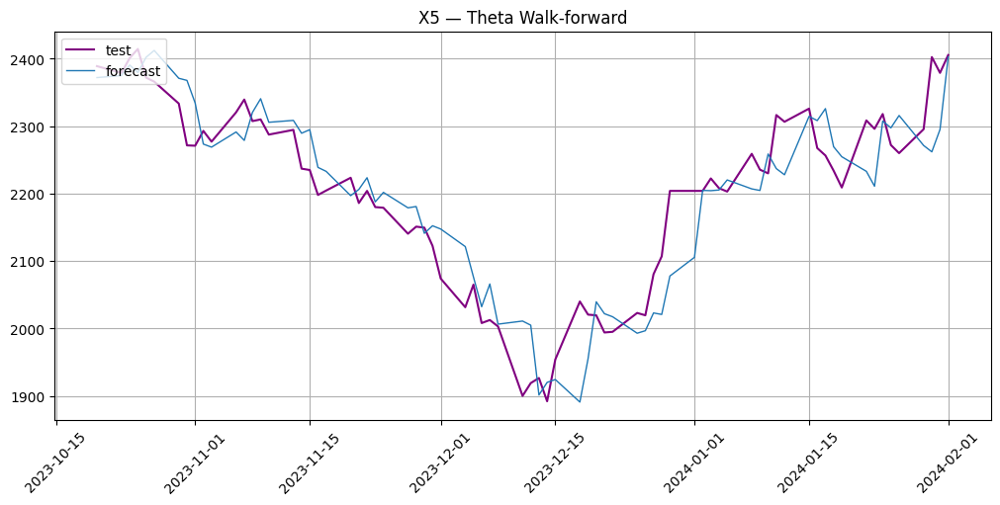

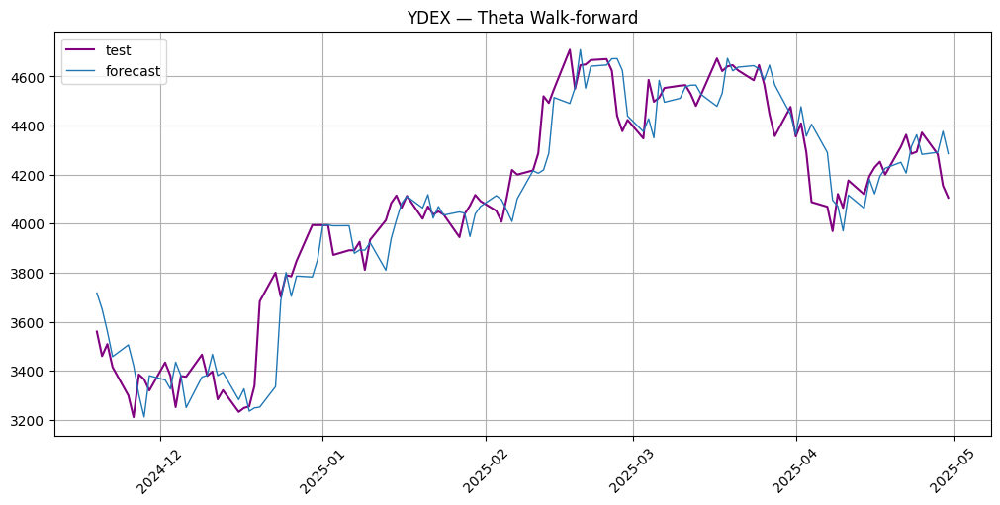


=== Итоговая таблица метрик Theta ===


,MAE,MAPE (%),RMSE,SMAPE (%),DA (%),Forecast time (s)
AFLT,1.841,2.916,2.410,2.922,50.000,0.903
LKOH,111.455,1.603,160.746,1.601,50.000,1.063
MOEX,4.534,2.234,5.982,2.238,50.000,0.998
NVTK,33.207,3.076,44.195,3.094,49.153,1.737
PIKK,22.953,4.293,31.803,4.319,52.542,0.845
SBER,5.325,1.930,7.641,1.943,48.305,1.133
VKCO,8.697,2.958,11.441,2.946,42.373,0.393
VTBR,2.564,3.025,3.599,3.049,51.163,0.645
X5,42.334,1.941,53.798,1.947,47.297,0.397
YDEX,90.577,2.270,125.229,2.279,53.448,0.830


In [92]:
results_map = {}

for ticker, (full_ts, train_ts, test_ts) in series.items():
    # 1) Собираем history_df из train_ts
    #    Получаем широкую таблицу и вынимаем нужную серию
    df_train_wide = train_ts.to_pandas(flatten=False)
    train_series = df_train_wide[(ticker, "target")]
    history_df = pd.DataFrame({
        "timestamp": train_series.index,
        "segment":   [ticker] * len(train_series),
        "target":    train_series.values
    })

    # 2) Готовим реальные значения теста
    df_test_wide = test_ts.to_pandas(flatten=False)
    y_test = df_test_wide[(ticker, "target")]

    preds = []
    times = []

    count = 0
    # 3) Walk-forward итерации по каждому таймстемпу в тесте
    for idx in y_test.index:
        #print(str(count) + " from " + str(len(y_test.index)))
        # 3.1) Формируем TSDataset из накопленного history_df
        history_ts = TSDataset(df=history_df.copy(), freq=train_ts.freq)

        # 3.2) Инициализируем AutoARIMA и меряем время fit+forecast на 1 шаг
        model = StatsForecastAutoThetaModel(
            season_length=5,              # 5 торговых дней в неделе
            decomposition_type='additive', # аддитивный разбор уровня+тренда
            model=None                     # пусть сам выберет внутри
        )
        t0 = time.time()
        model.fit(history_ts)
        forecast_step = model.predict(ts=history_ts)
        t1 = time.time()
        times.append(t1 - t0)

        # 3.3) Забираем предсказание последнего ряда
        df_forecast_wide = forecast_step.to_pandas(flatten=False)
        p = df_forecast_wide[(ticker, "target")].iloc[-1]
        preds.append(p)

        # 3.4) Добавляем в history_df реальное значение для следующего шага
        history_df = pd.concat([
            history_df,
            pd.DataFrame({
                "timestamp": [idx],
                "segment":   [ticker],
                "target":    [y_test.loc[idx]]
            })
        ], ignore_index=True)

        count += 1

    # 4) Собираем TSDataset из всех предсказаний
    forecast_df = pd.DataFrame({
        "timestamp": y_test.index.tolist(),
        "segment":   [ticker] * len(preds),
        "target":    preds
    })
    forecast_ts = TSDataset(df=forecast_df, freq=train_ts.freq)

    # 5) Считаем метрики
    mae_v   = MAE()(test_ts,   forecast_ts)[ticker]
    mape_v  = MAPE()(test_ts,  forecast_ts)[ticker]
    rmse_v  = RMSE()(test_ts,  forecast_ts)[ticker]
    smape_v = SMAPE()(test_ts, forecast_ts)[ticker]
    da_v    = directional_accuracy(y_test.values, np.array(preds))

    results_map[ticker] = {
        "MAE":       mae_v,
        "MAPE (%)":  mape_v,
        "RMSE":      rmse_v,
        "SMAPE (%)": smape_v,
        "DA (%)":    da_v,
        "Forecast time (s)": np.mean(times)
    }

    # 6) Визуализация
    plot_forecast(forecast_ts, test_ts)
    plt.title(f"{ticker} — Theta Walk-forward")
    plt.show()

# 7) Сводная таблица
metrics_df = pd.DataFrame.from_dict(results_map, orient="index")
metrics_df.loc["AVERAGE"] = metrics_df.mean(numeric_only=True)
metrics_df = metrics_df.round(3)

print("\n=== Итоговая таблица метрик Theta ===")
display(metrics_df)

# Линейные модели

## DLineral

In [46]:
class DLinearModel(NonPredictionIntervalContextIgnorantAbstractModel):
    """
    DLinear-модель walk-forward:
    – для каждого шага строит линейный тренд y~t,
    – берёт остаток = y – trend, прогноз остатка = среднее последних season_k,
    – итоговый прогноз = trend_pred + rem_pred,
    – в историю добавляет РЕАЛЬНОЕ y_true, а не y_pred.
    """

    def __init__(self, season_k: int = 5):
        super().__init__()
        self.season_k = season_k
        self._freq = None
        self.segment = None
        # история будет храниться после fit
        self.history_values: list = []
        self.history_index: pd.DatetimeIndex = None

    def fit(self, ts: TSDataset) -> None:
        # ts — только train_ts
        self._freq = ts.freq
        self.segment = ts.segments[0]
        df = ts.to_pandas(flatten=False)
        series = df[(self.segment, "target")]
        # сохраняем train-историю
        self.history_values = series.values.tolist()
        self.history_index = series.index

    def forecast(self, ts: TSDataset, prediction_size: int) -> TSDataset:
        # ts — полный TSDataset (train + test), из которого мы берём реальные future-y
        df_full = ts.to_pandas(flatten=False)
        full_series = df_full[(self.segment, "target")]
        full_values = full_series.values
        full_index = full_series.index

        # разделяем на train и будущие test-метки
        n_train = len(self.history_values)
        future_index = full_index[n_train : n_train + prediction_size]

        history = self.history_values.copy()
        preds = []

        for i in range(prediction_size):
            n = len(history)
            X = np.arange(n).reshape(-1, 1)
            y = np.array(history)

            # линейный тренд
            lr = LinearRegression().fit(X, y)
            trend_pred = lr.predict([[n]])[0]

            # остатки и их среднее по сезону
            resid = y - lr.predict(X)
            if n >= self.season_k:
                rem_pred = resid[-self.season_k :].mean()
            else:
                rem_pred = resid.mean()

            y_pred = trend_pred + rem_pred
            preds.append(y_pred)

            # апдейт истории — именно реальным значением
            y_true = full_values[n_train + i]
            history.append(y_true)

        # собираем DataFrame с прогнозом
        df_forecast = pd.DataFrame({
            "timestamp": future_index,
            "segment":   [self.segment] * prediction_size,
            "target":    preds
        })

        return TSDataset(df=df_forecast, freq=self._freq)

    # для совместимости
    def predict(self, ts: TSDataset, prediction_size: int) -> TSDataset:
        return self.forecast(ts, prediction_size)

    def get_model(self) -> str:
        return f"DLinearModel(season_k={self.season_k})"


=== Итоговая таблица метрик DLinear ===


,MAE,MAPE (%),RMSE,SMAPE (%),DA (%),Forecast time (s)
AFLT,1.966,3.116,2.534,3.126,46.610,0.001
LKOH,122.211,1.761,171.091,1.754,50.000,0.001
MOEX,5.128,2.514,6.616,2.519,51.695,0.001
NVTK,35.545,3.305,46.299,3.329,53.390,0.001
PIKK,27.699,5.184,36.069,5.204,53.390,0.001
SBER,6.102,2.196,8.389,2.213,48.305,0.001
VKCO,9.379,3.195,12.195,3.204,50.847,0.001
VTBR,2.928,3.462,4.029,3.498,56.977,0.001
X5,46.820,2.154,57.980,2.157,48.649,0.001
YDEX,102.142,2.550,132.944,2.557,53.448,0.001


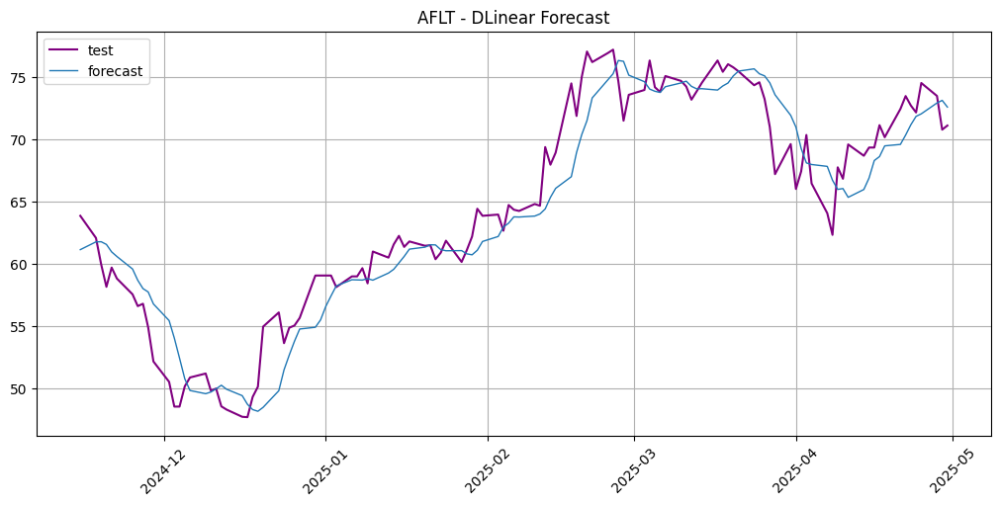

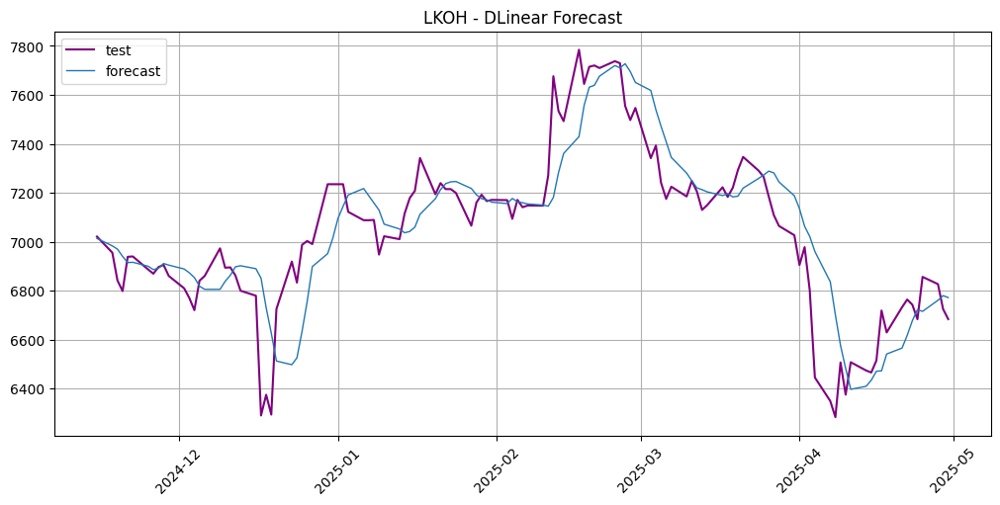

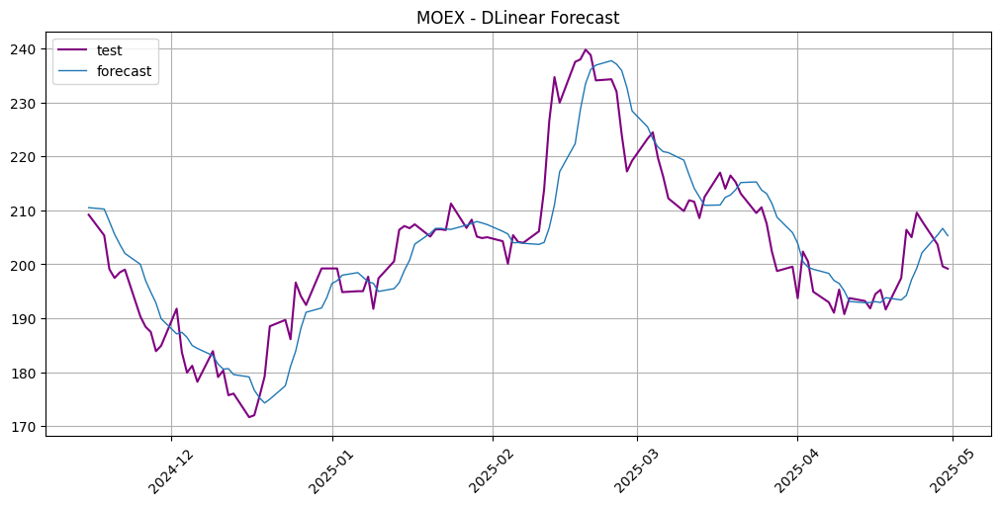

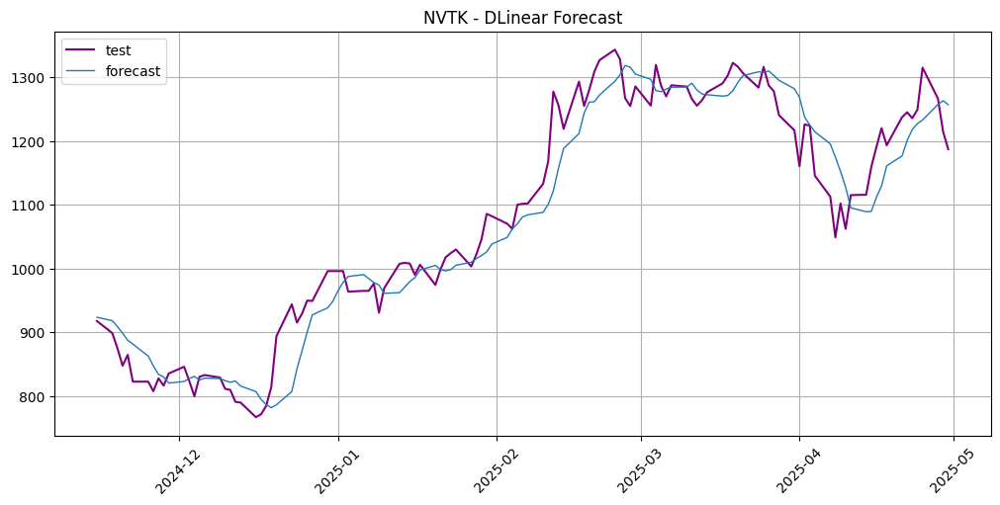

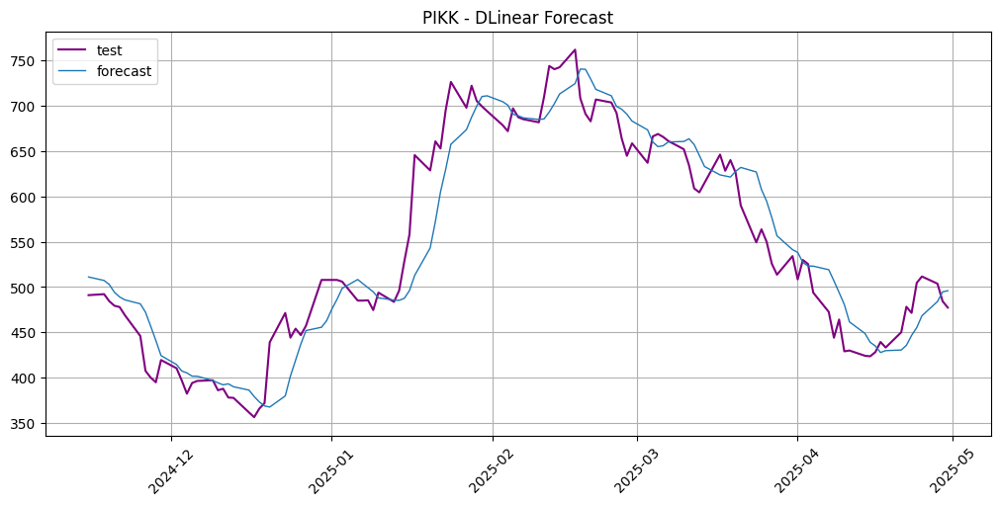

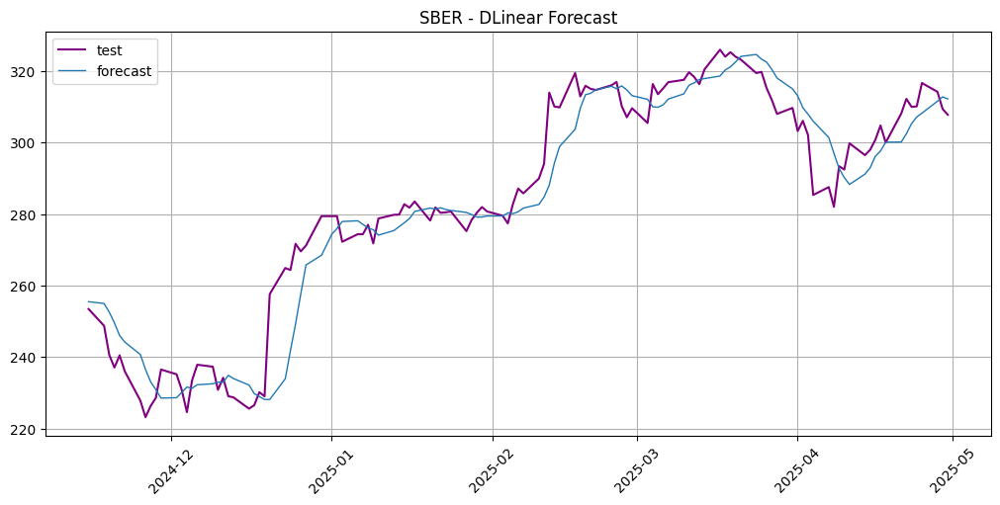

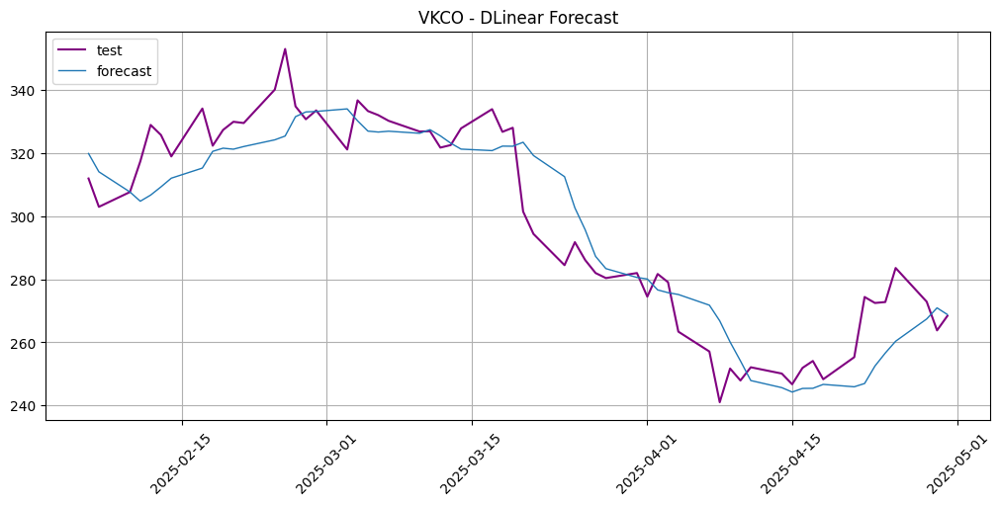

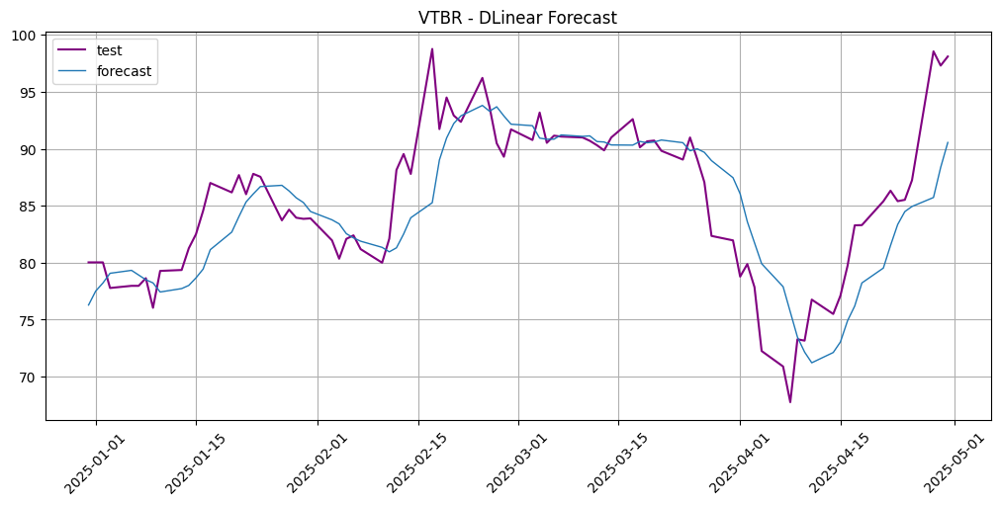

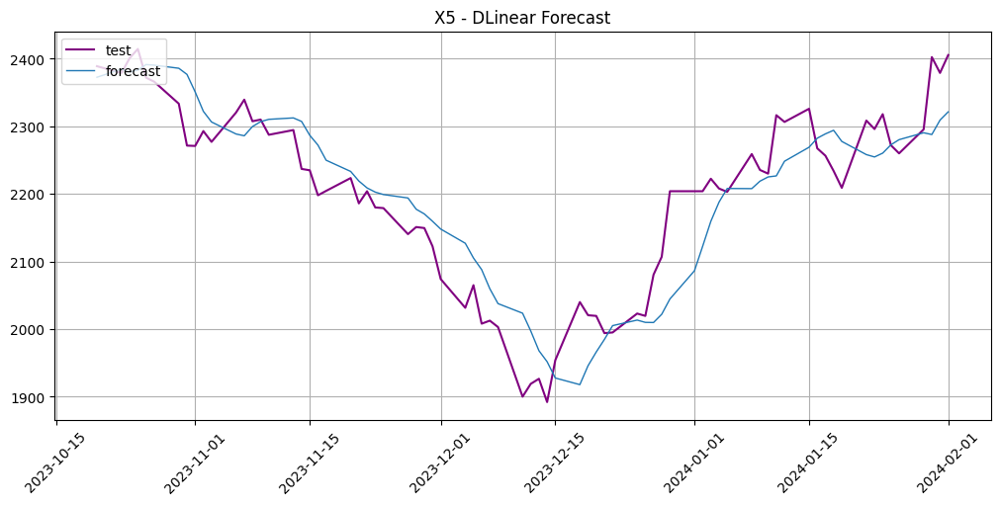

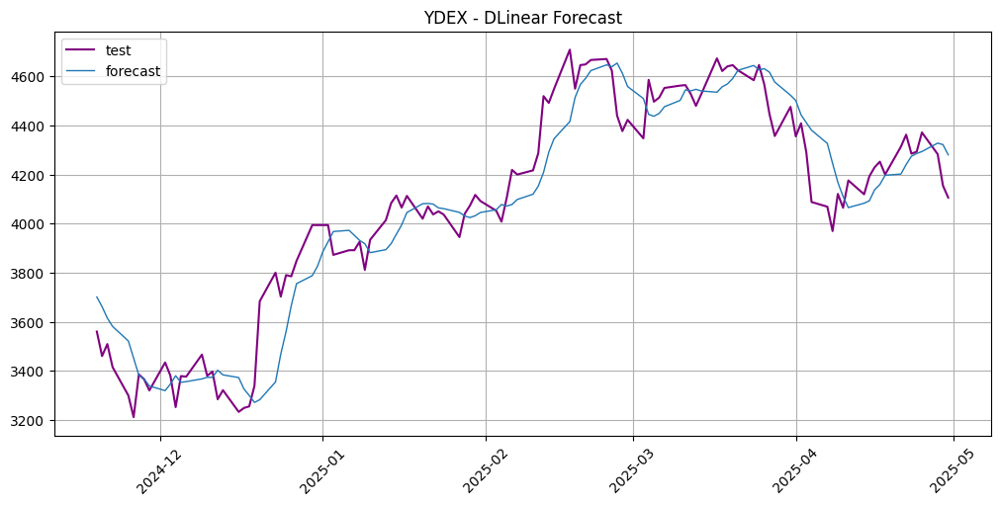

In [63]:
dlinear_results = {}

for ticker, (full_ts, train_ts, test_ts) in series.items():
    #print(f"\n--- Тикер {ticker} ---")
    
    # Инициализируем и 
    df_test = test_ts.to_pandas(flatten=False)
    test_size = df_test.shape[0]

    model = DLinearModel(season_k = 5)

    # Обучаем DLinear модель и выполняем прогноз на test_size точек и замеряем время
    start_time = time.time()
    model.fit(train_ts)
    forecast_ts = model.forecast(full_ts, prediction_size=test_size)
    end_time = time.time()
    forecast_time = (end_time - start_time) / test_size  # Время в секундах на один прогноз
    
    # Собираем прогноз и реальные значения
    df_pred = forecast_ts.to_pandas(flatten=True)
    df_true = test_ts.to_pandas(flatten=True)
    
    y_true = df_true["target"].values
    y_pred = df_pred["target"].values

    # Считаем метрики
    mae_v   = MAE()(test_ts, forecast_ts)
    mape_v  = MAPE()(test_ts, forecast_ts)
    rmse_v  = RMSE()(test_ts, forecast_ts)
    smape_v = SMAPE()(test_ts, forecast_ts)
    da_v = directional_accuracy(y_true, y_pred)
    
    # Сохраняем метрики
    dlinear_results[ticker] = {
        "MAE": mae_v[ticker],
        "MAPE (%)": mape_v[ticker],
        "RMSE": rmse_v[ticker],
        "SMAPE (%)": smape_v[ticker],
        "DA (%)": da_v,
        "Forecast time (s)": forecast_time
    }
    
    # Визуализируем результаты
    plot_forecast(forecast_ts, test_ts)
    plt.title(f'{ticker} - DLinear Forecast')

# Собираем сводную таблицу метрик
dlinear_df = pd.DataFrame.from_dict(dlinear_results, orient="index")
dlinear_df.loc["AVERAGE"] = dlinear_df.mean(numeric_only=True)
dlinear_df = dlinear_df.round(3)

print("\n=== Итоговая таблица метрик DLinear ===")
display(dlinear_df)
plt.show()

## NLineral

In [65]:
class NLinearModel(NonPredictionIntervalContextIgnorantAbstractModel):
    """
    NLinear-модель для ETNA, walkforward:
    – на каждом шаге берёт последние window_size точек,
    – строит регрессию X=1…L против (y – last),
    – прогнозирует delta на L+1 и возвращает last + delta,
    – обновляет историю реальным y_true.
    """
    def __init__(self, window_size: int = 20):
        super().__init__()
        self.window_size = window_size
        self._freq = None
        self.segment = None
        # после fit:
        self.history_values: list = []
        self.history_index: pd.DatetimeIndex = None

    def fit(self, ts: TSDataset) -> None:
        # ts — только train_ts
        self._freq = ts.freq
        self.segment = ts.segments[0]
        df = ts.to_pandas(flatten=False)
        series = df[(self.segment, "target")]
        self.history_values = series.values.tolist()
        self.history_index = series.index

    def forecast(self, ts: TSDataset, prediction_size: int) -> TSDataset:
        # ts — полный TSDataset train+test
        df_full = ts.to_pandas(flatten=False)
        full_series = df_full[(self.segment, "target")]
        full_values = full_series.values
        full_index = full_series.index

        n_train = len(self.history_values)
        future_index = full_index[n_train : n_train + prediction_size]

        history = self.history_values.copy()
        preds: list = []

        for i in range(prediction_size):
            window = np.array(history[-self.window_size :])
            L = len(window)
            last = window[-1]

            X = np.arange(1, L + 1).reshape(-1, 1)
            y_rel = window - last

            lr = LinearRegression().fit(X, y_rel)
            delta = lr.predict([[L + 1]])[0]
            y_pred = last + delta
            preds.append(y_pred)

            # обновляем историю реальным y_true
            y_true = full_values[n_train + i]
            history.append(y_true)

        df_forecast = pd.DataFrame({
            "timestamp": future_index,
            "segment":   [self.segment] * prediction_size,
            "target":    preds
        })

        return TSDataset(df=df_forecast, freq=self._freq)

    def predict(self, ts: TSDataset, prediction_size: int) -> TSDataset:
        return self.forecast(ts, prediction_size)

    def get_model(self) -> str:
        return f"NLinearModel(window_size={self.window_size})"


=== Итоговая таблица метрик NLinear ===


,MAE,MAPE (%),RMSE,SMAPE (%),DA (%),Forecast time (s)
AFLT,3.142,5.026,3.916,5.041,45.763,0.001
LKOH,183.413,2.627,237.573,2.627,43.220,0.001
MOEX,7.777,3.800,9.908,3.809,49.153,0.001
NVTK,50.751,4.631,64.723,4.669,47.458,0.001
PIKK,36.647,6.826,45.001,7.001,54.237,0.001
SBER,9.790,3.471,12.130,3.491,47.458,0.001
VKCO,14.311,4.904,17.758,4.931,50.847,0.001
VTBR,4.662,5.492,5.976,5.572,58.140,0.001
X5,63.290,2.915,80.989,2.934,48.649,0.001
YDEX,146.962,3.624,180.432,3.640,46.552,0.001


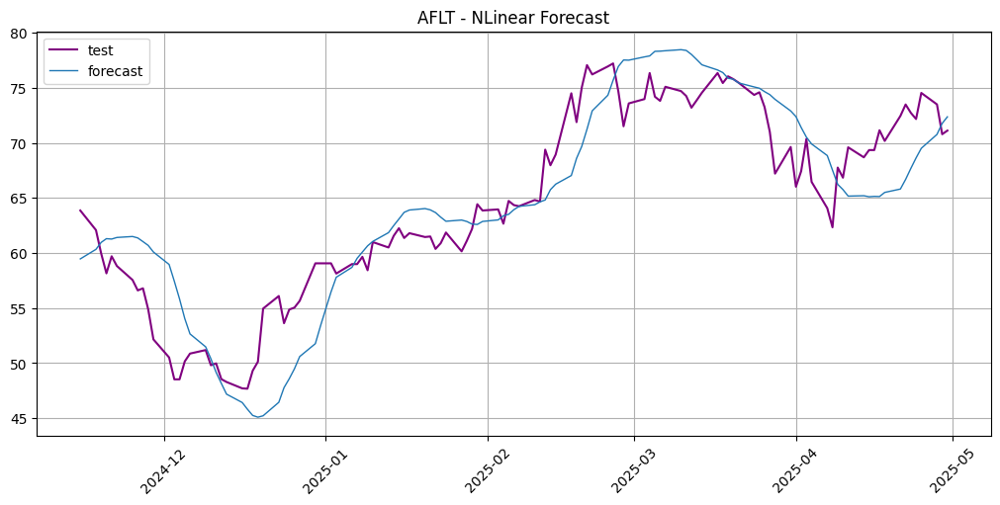

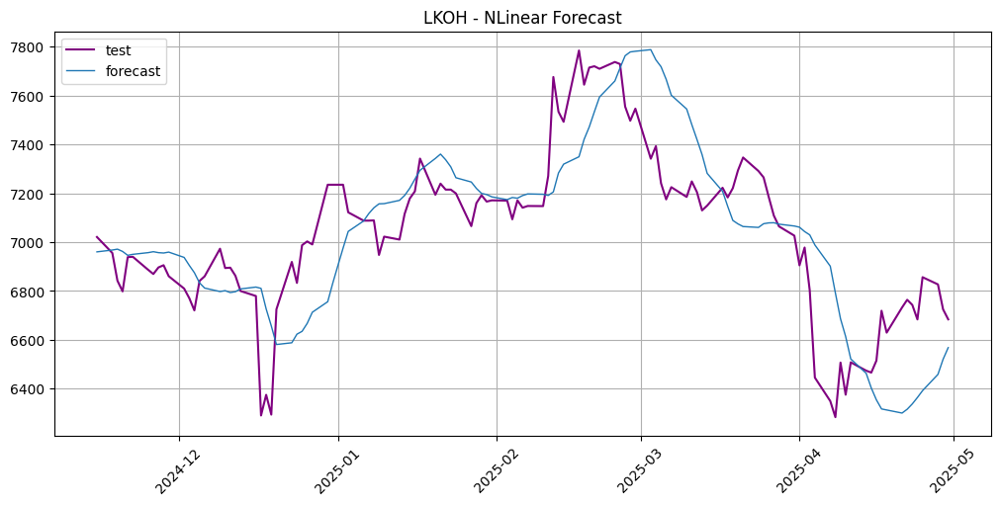

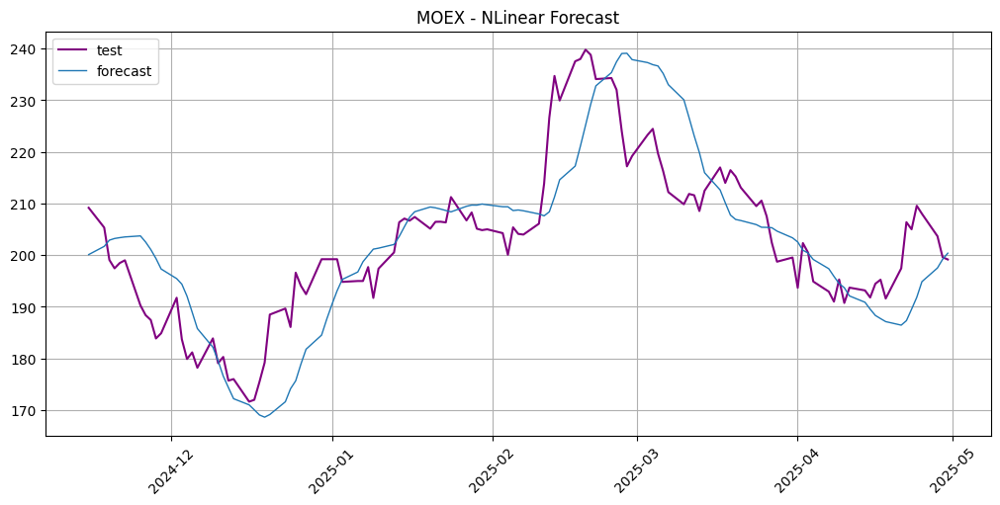

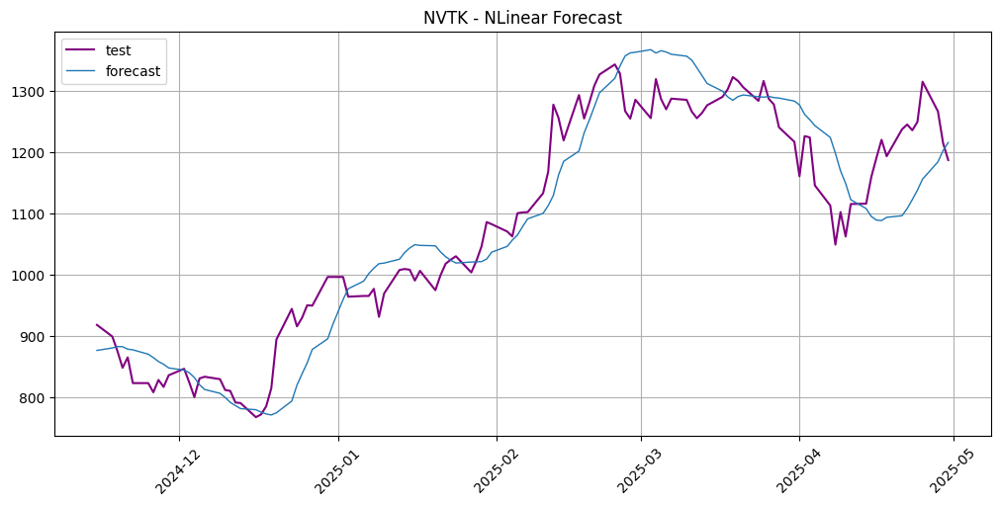

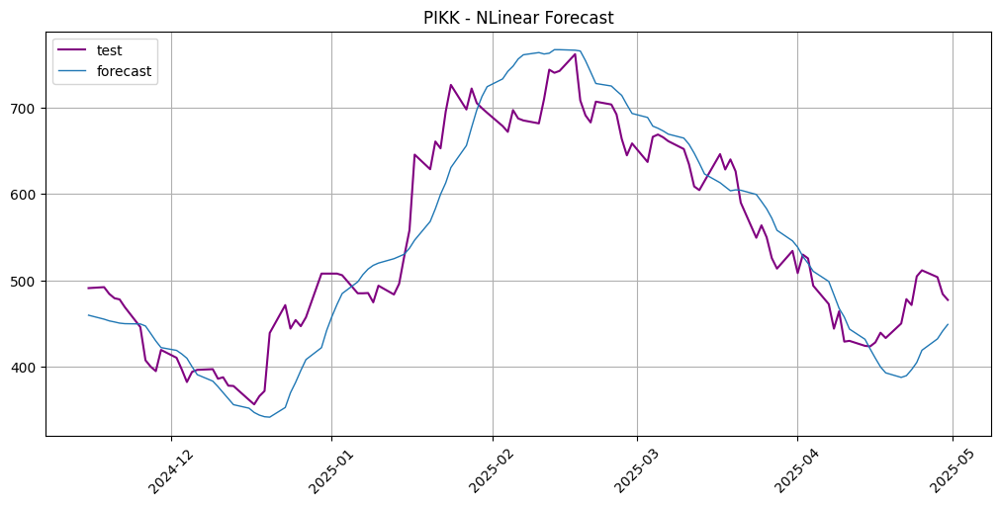

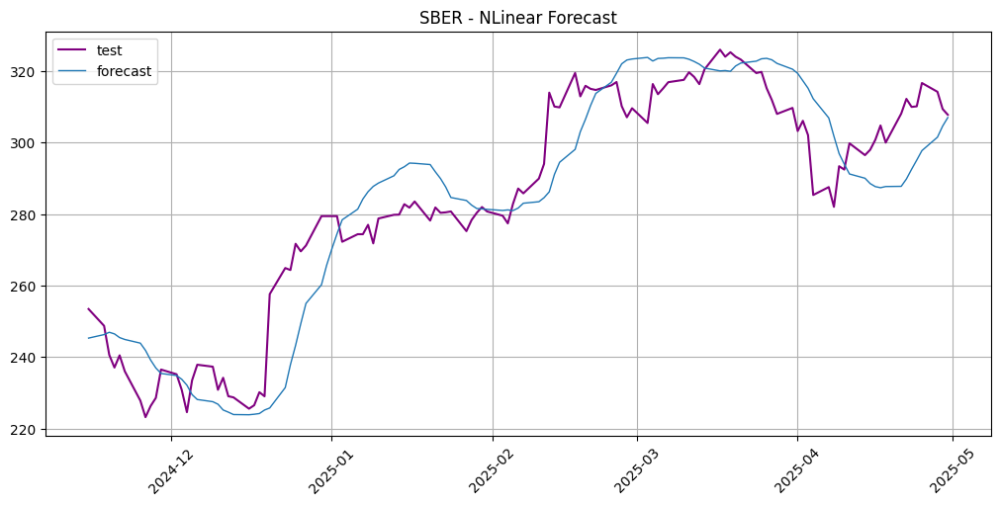

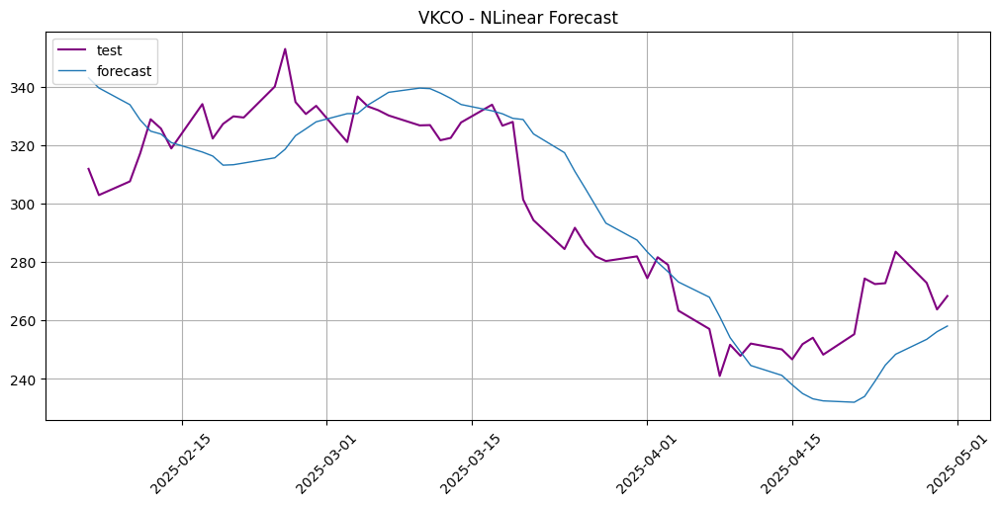

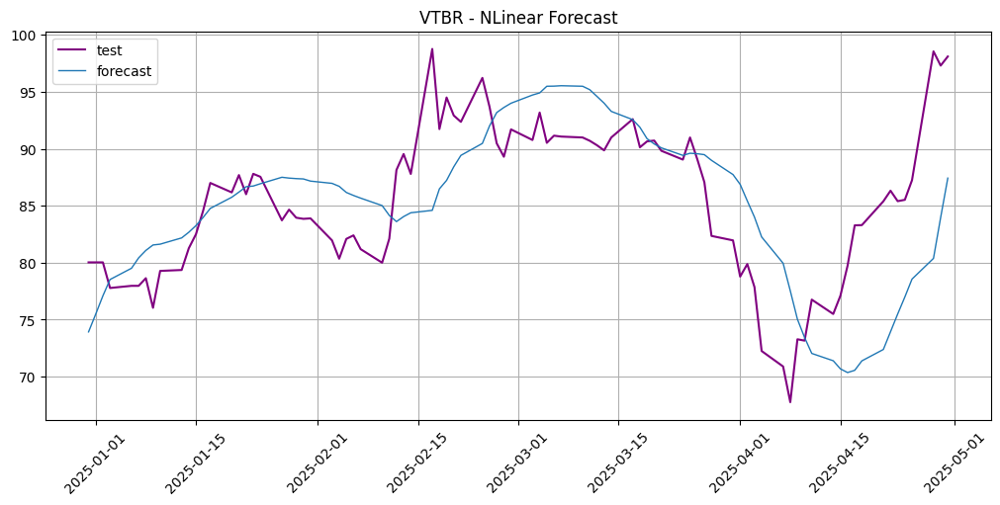

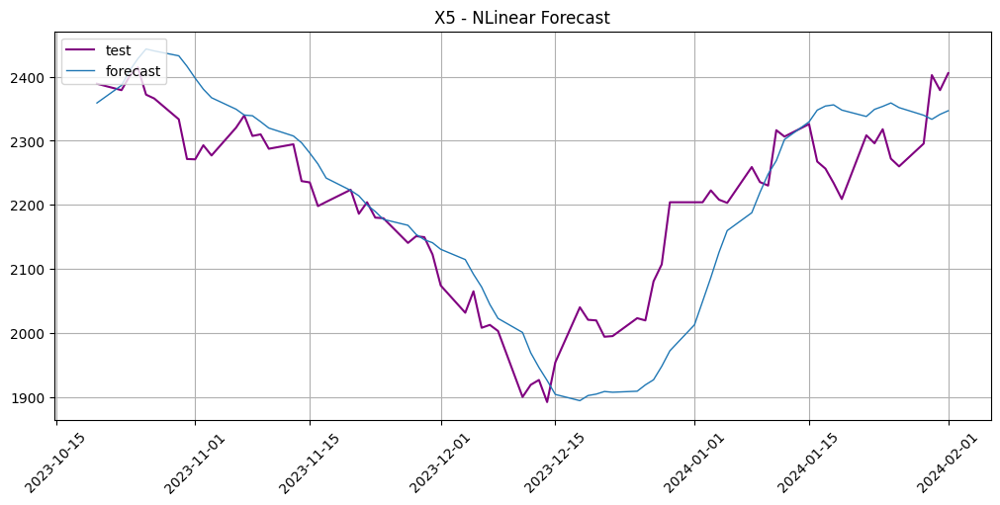

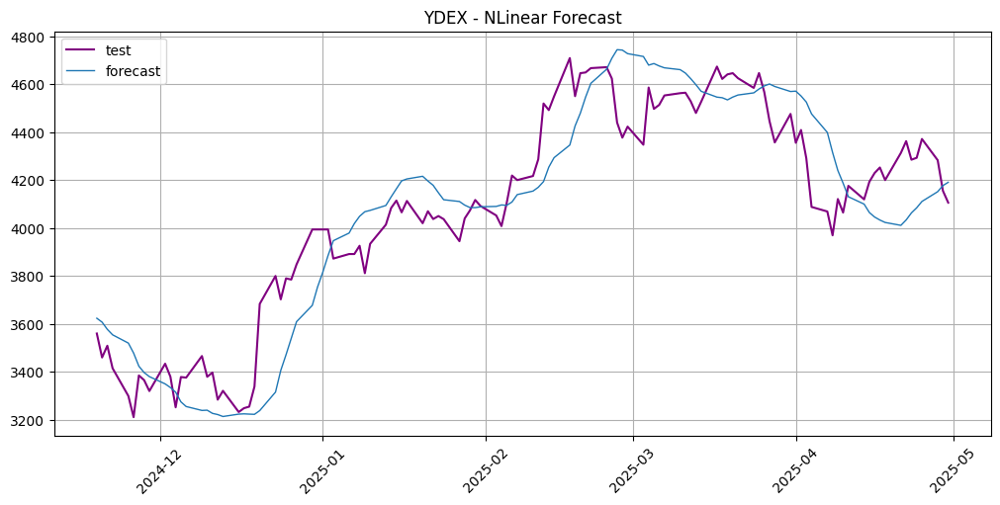

In [66]:
nlinear_results = {}

for ticker, (full_ts, train_ts, test_ts) in series.items():
    #print(f"\n--- Тикер {ticker} ---")
    
    # Инициализируем и 
    df_test = test_ts.to_pandas(flatten=False)
    test_size = df_test.shape[0]

    model = NLinearModel(window_size = 25)

    # Обучаем DLinear модель и выполняем прогноз на test_size точек и замеряем время
    start_time = time.time()
    model.fit(train_ts)
    forecast_ts = model.forecast(full_ts, prediction_size=test_size)
    end_time = time.time()
    forecast_time = (end_time - start_time) / test_size  # Время в секундах на один прогноз
    
    # Собираем прогноз и реальные значения
    df_pred = forecast_ts.to_pandas(flatten=True)
    df_true = test_ts.to_pandas(flatten=True)
    
    y_true = df_true["target"].values
    y_pred = df_pred["target"].values

    # Считаем метрики
    mae_v   = MAE()(test_ts, forecast_ts)
    mape_v  = MAPE()(test_ts, forecast_ts)
    rmse_v  = RMSE()(test_ts, forecast_ts)
    smape_v = SMAPE()(test_ts, forecast_ts)
    da_v = directional_accuracy(y_true, y_pred)
    
    # Сохраняем метрики
    nlinear_results[ticker] = {
        "MAE": mae_v[ticker],
        "MAPE (%)": mape_v[ticker],
        "RMSE": rmse_v[ticker],
        "SMAPE (%)": smape_v[ticker],
        "DA (%)": da_v,
        "Forecast time (s)": forecast_time
    }
    
    # Визуализируем результаты
    plot_forecast(forecast_ts, test_ts)
    plt.title(f'{ticker} - NLinear Forecast')

# Собираем сводную таблицу метрик
nlinear_df = pd.DataFrame.from_dict(nlinear_results, orient="index")
nlinear_df.loc["AVERAGE"] = nlinear_df.mean(numeric_only=True)
nlinear_df = nlinear_df.round(3)

print("\n=== Итоговая таблица метрик NLinear ===")
display(nlinear_df)
plt.show()

# Рекурентные модели

## RNN

In [80]:
class CustomRNNModel(NonPredictionIntervalContextIgnorantAbstractModel):
    """
    ETNA-адаптация rnn_walkforward:
    - Масштабирует MinMaxScaler
    - Обучает SimpleRNN на всем train_ts
    - Делает walk-forward прогноз с апдейтом истории реальными y_true
    """

    def __init__(
        self,
        lookback: int = 50,
        units: int = 32,
        dropout: float = 0.0,
        rec_dropout: float = 0.2,
        optimizer = RMSprop,
        lr: float = 1e-3,
        epochs: int = 10,
        batch_size: int = 4,
        validation_split: float = 0.1,
        verbose: int = 0,
    ):
        super().__init__()
        # гиперпараметры
        self.lookback = lookback
        self.units = units
        self.dropout = dropout
        self.rec_dropout = rec_dropout
        self.optimizer_class = optimizer
        self.lr = lr
        self.epochs = epochs
        self.batch_size = batch_size
        self.validation_split = validation_split
        self.verbose = verbose

        # внутренние состояния
        self._scaler = MinMaxScaler(feature_range=(0, 1))
        self._model = None
        self._freq = None
        self.segment = None
        self._history_scaled = []       # список масштабированных значений
        self._history_index = None      # pandas.DatetimeIndex

    def fit(self, ts: TSDataset) -> None:
        # сохраняем freq и сегмент
        self._freq = ts.freq
        self.segment = ts.segments[0]
        # вытаскиваем pandas Series
        df = ts.to_pandas(flatten=False)
        series = df[(self.segment, "target")]

        # масштабируем
        values = series.values.reshape(-1, 1)
        scaled = self._scaler.fit_transform(values).flatten()

        # готовим обучающие окна
        X, y = [], []
        for i in range(self.lookback, len(scaled)):
            X.append(scaled[i - self.lookback : i])
            y.append(scaled[i])
        X_train = np.array(X)[:, :, None]
        y_train = np.array(y)

        # строим модель
        inp = Input(shape=(self.lookback, 1))
        x = SimpleRNN(
            self.units,
            dropout=self.dropout,
            recurrent_dropout=self.rec_dropout,
        )(inp)
        out = Dense(1)(x)
        model = Model(inputs=inp, outputs=out)
        optimizer = self.optimizer_class(learning_rate=self.lr)
        model.compile(loss="mse", optimizer=optimizer)

        # обучаем
        model.fit(
            X_train,
            y_train,
            epochs=self.epochs,
            batch_size=self.batch_size,
            validation_split=self.validation_split,
            verbose=self.verbose,
        )
        self._model = model

        # сохраняем историю
        self._history_scaled = scaled.tolist()
        self._history_index = series.index

    def forecast(self, ts: TSDataset, prediction_size: int) -> TSDataset:
        # ts содержит train+test, откуда берём реальные y_true
        df_full = ts.to_pandas(flatten=False)
        full_series = df_full[(self.segment, "target")]
        full_values = full_series.values
        full_index = full_series.index

        n_train = len(self._history_scaled)
        future_index = full_index[n_train : n_train + prediction_size]

        history = self._history_scaled.copy()
        preds_scaled = []

        for i in range(prediction_size):
            window = np.array(history[-self.lookback :]).reshape(1, self.lookback, 1)
            yhat = self._model.predict(window, verbose=0)[0, 0]
            preds_scaled.append(yhat)

            # добавляем реальное наблюдение, масштабированное
            y_true = full_values[n_train + i]
            scaled_true = self._scaler.transform([[y_true]])[0, 0]
            history.append(scaled_true)

        # инвертируем масштабирование
        preds = self._scaler.inverse_transform(
            np.array(preds_scaled).reshape(-1, 1)
        ).flatten()

        df_forecast = pd.DataFrame({
            "timestamp": future_index,
            "segment":   [self.segment] * prediction_size,
            "target":    preds,
        })
        return TSDataset(df=df_forecast, freq=self._freq)

    # alias
    def predict(self, ts: TSDataset, prediction_size: int) -> TSDataset:
        return self.forecast(ts, prediction_size)

    def get_model(self) -> str:
        return (
            f"CustomRNNModel(lookback={self.lookback}, units={self.units}, "
            f"dropout={self.dropout}, rec_dropout={self.rec_dropout}, "
            f"lr={self.lr}, epochs={self.epochs}, batch_size={self.batch_size})"
        )

2025-06-14 14:10:36.734300: E external/local_xla/xla/stream_executor/cuda/cuda_platform.cc:51] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)


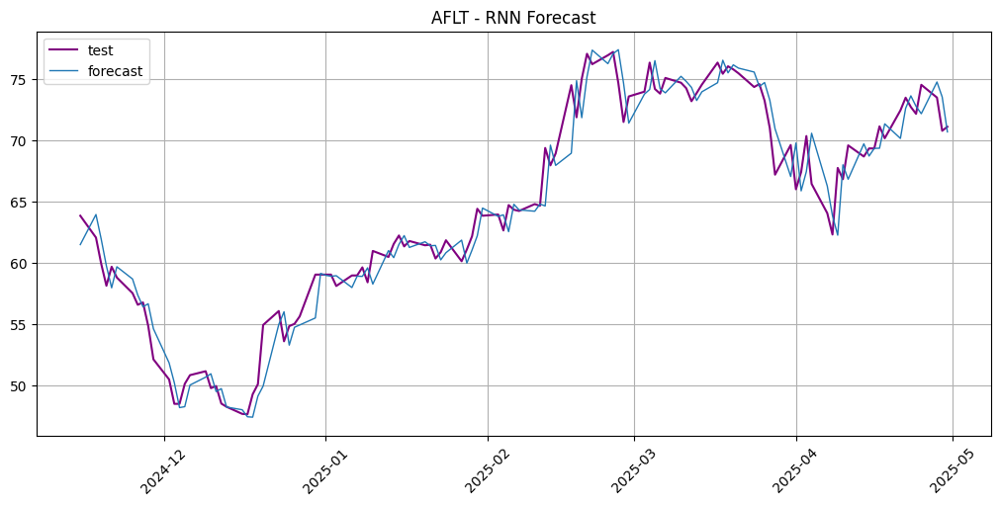

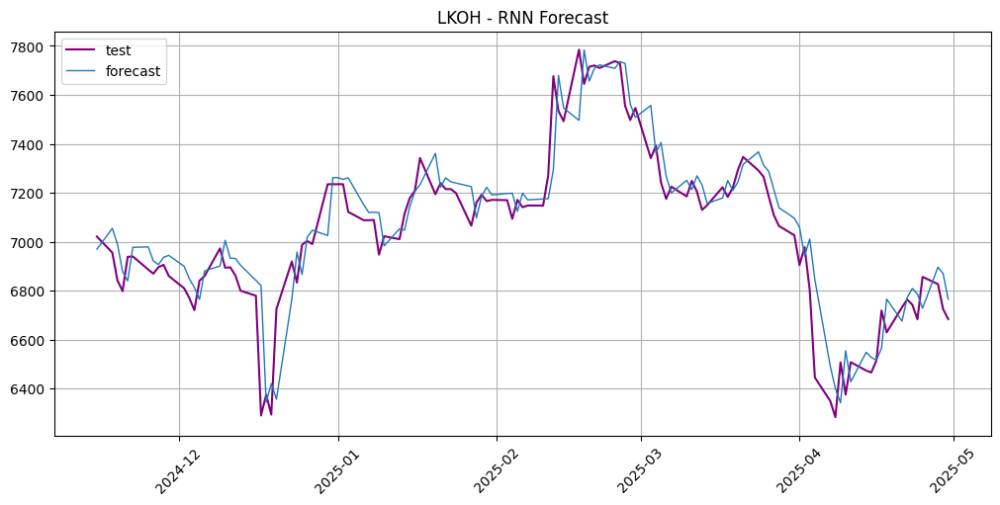

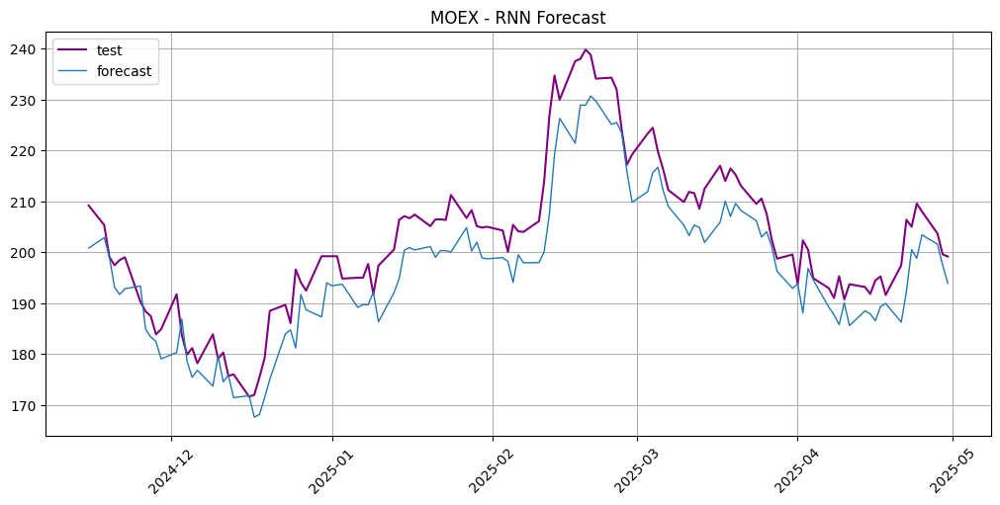

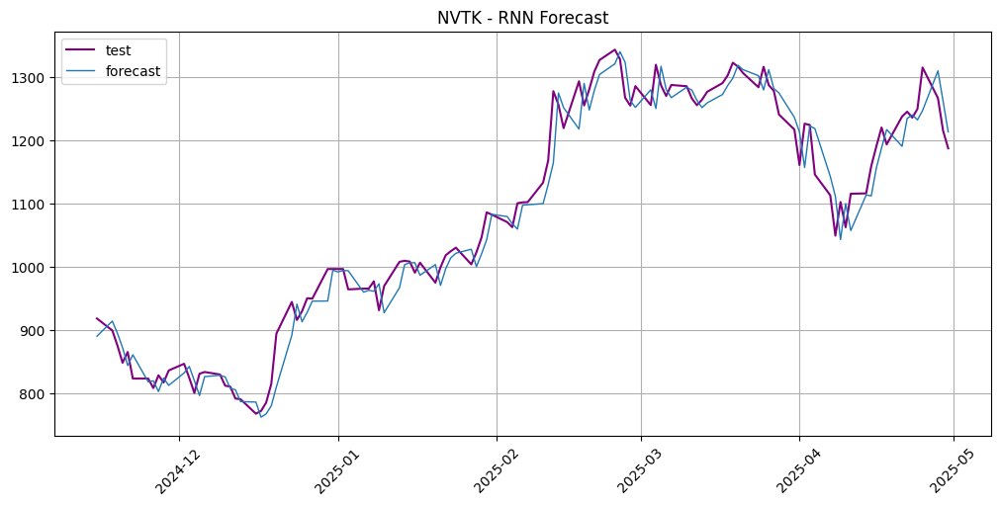

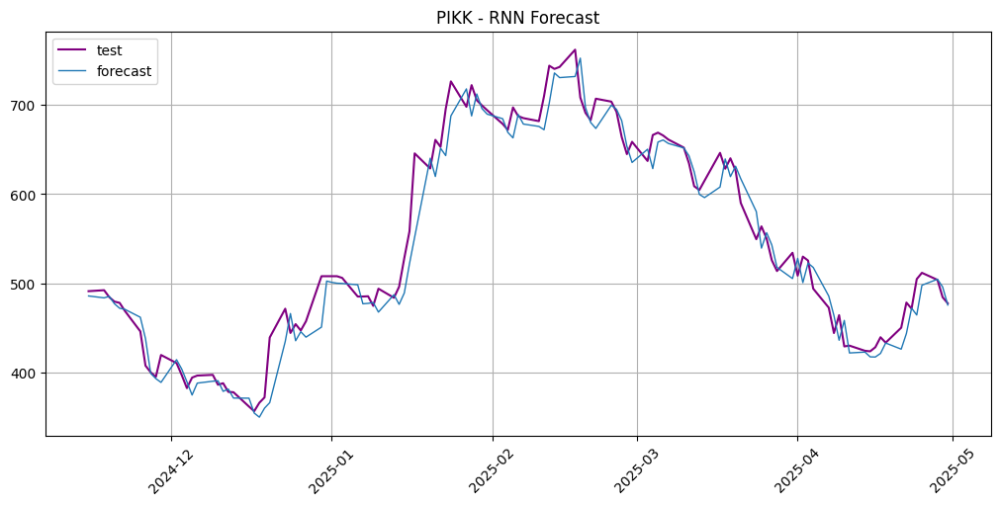

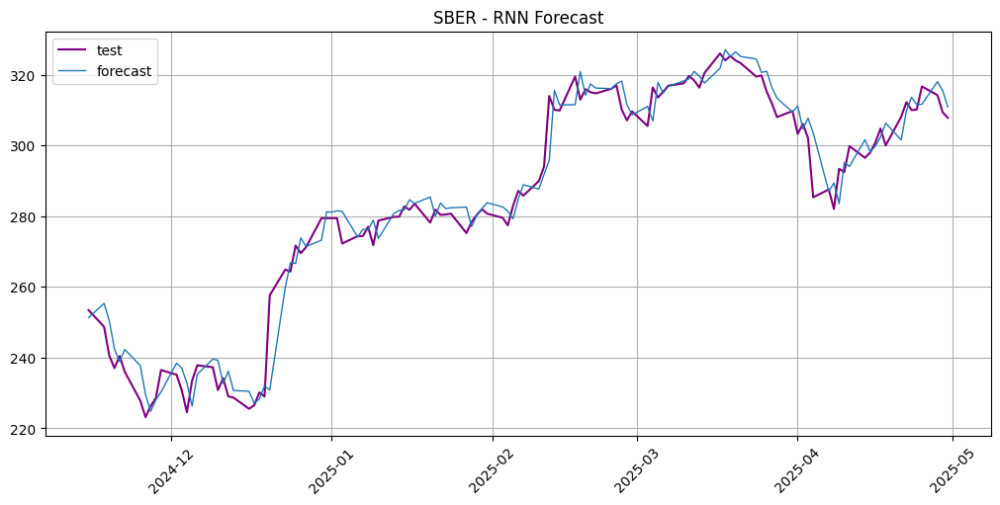

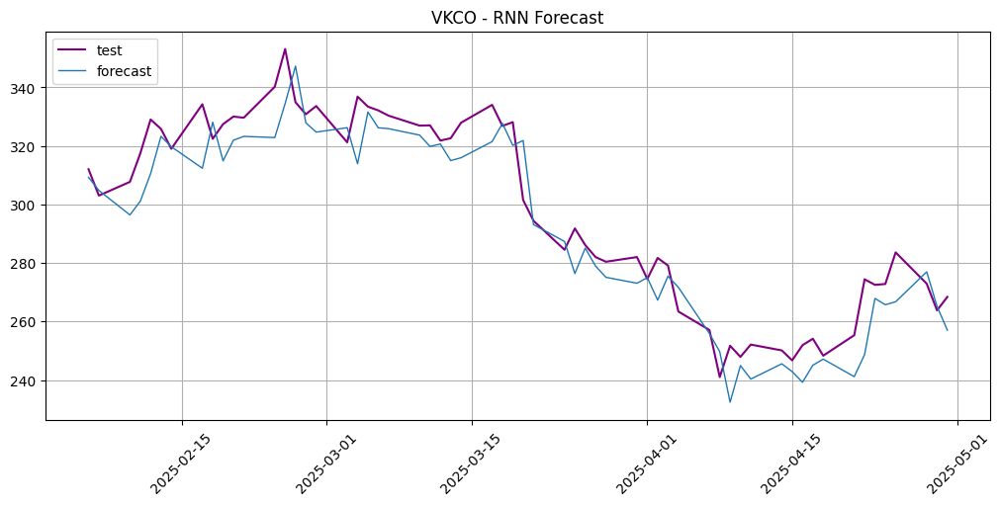

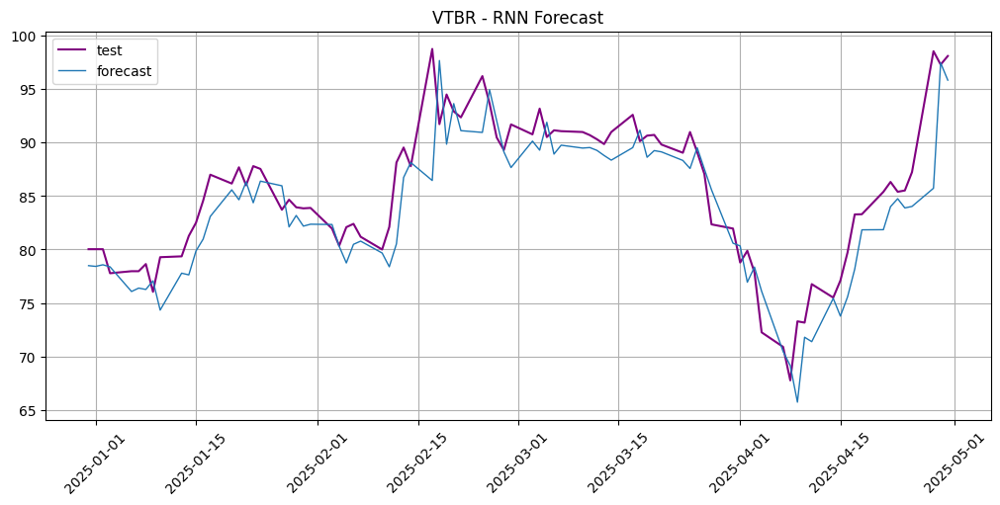

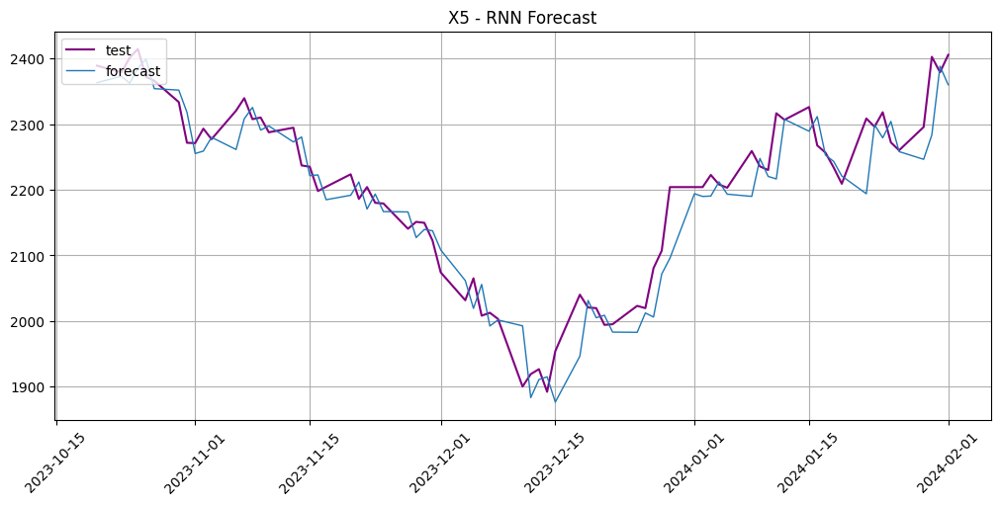

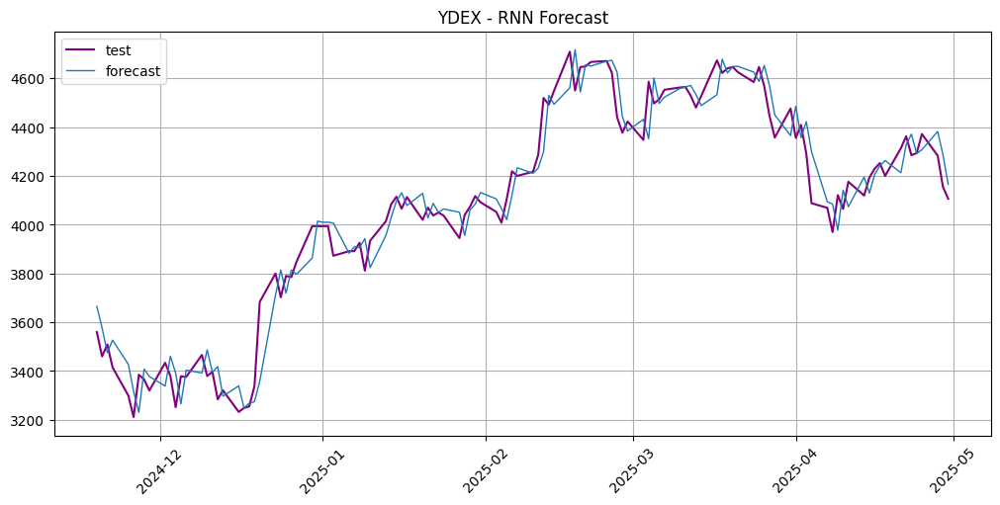


=== Итоговая таблица метрик RNN ===


,MAE,MAPE (%),RMSE,SMAPE (%),DA (%),Forecast time (s)
AFLT,1.407,2.184,1.828,2.192,38.983,0.452
LKOH,88.960,1.281,121.595,1.275,43.220,0.420
MOEX,6.081,2.963,7.261,3.025,42.373,0.410
NVTK,25.301,2.336,32.413,2.353,51.695,0.412
PIKK,16.305,3.013,22.755,3.071,49.153,0.412
SBER,4.048,1.466,5.579,1.464,40.678,0.402
VKCO,8.448,2.838,10.664,2.889,40.678,0.436
VTBR,2.392,2.782,3.290,2.841,44.186,0.427
X5,31.011,1.418,41.481,1.428,37.838,0.457
YDEX,72.747,1.823,91.666,1.822,38.793,0.433


In [84]:
rnn_results = {}

for ticker, (full_ts, train_ts, test_ts) in series.items():
    #print(f"\n--- Тикер {ticker} ---")
    
    # Инициализируем и 
    df_test = test_ts.to_pandas(flatten=False)
    test_size = df_test.shape[0]

    model = CustomRNNModel()

    # Обучаем DLinear модель и выполняем прогноз на test_size точек и замеряем время
    start_time = time.time()
    model.fit(train_ts)
    forecast_ts = model.forecast(full_ts, prediction_size=test_size)
    end_time = time.time()
    forecast_time = (end_time - start_time) / test_size  # Время в секундах на один прогноз
    
    # Собираем прогноз и реальные значения
    df_pred = forecast_ts.to_pandas(flatten=True)
    df_true = test_ts.to_pandas(flatten=True)
    
    y_true = df_true["target"].values
    y_pred = df_pred["target"].values

    # Считаем метрики
    mae_v   = MAE()(test_ts, forecast_ts)
    mape_v  = MAPE()(test_ts, forecast_ts)
    rmse_v  = RMSE()(test_ts, forecast_ts)
    smape_v = SMAPE()(test_ts, forecast_ts)
    da_v = directional_accuracy(y_true, y_pred)
    
    # Сохраняем метрики
    rnn_results[ticker] = {
        "MAE": mae_v[ticker],
        "MAPE (%)": mape_v[ticker],
        "RMSE": rmse_v[ticker],
        "SMAPE (%)": smape_v[ticker],
        "DA (%)": da_v,
        "Forecast time (s)": forecast_time
    }
    
    # Визуализируем результаты
    plot_forecast(forecast_ts, test_ts)
    plt.title(f'{ticker} - RNN Forecast')

    plt.show()

# Собираем сводную таблицу метрик
rnn_df = pd.DataFrame.from_dict(rnn_results, orient="index")
rnn_df.loc["AVERAGE"] = rnn_df.mean(numeric_only=True)
rnn_df = rnn_df.round(3)

print("\n=== Итоговая таблица метрик RNN ===")
display(rnn_df)

## LSTM

In [87]:
class CustomLSTMModel(NonPredictionIntervalContextIgnorantAbstractModel):
    """
    ETNA-адаптация lstm_walkforward_tuned:
    – lookback, units, dropout, rec_dropout, optimizer_cls, lr, epochs, batch_size
    – walk-forward с реальными y_true, MinMaxScaler
    """
    def __init__(
        self,
        lookback: int = 90,
        units: int = 128,
        dropout: float = 0.0,
        rec_dropout: float = 0.1,
        optimizer_cls = Adam,
        lr: float = 1e-3,
        epochs: int = 15,
        batch_size: int = 4,
        verbose: int = 0,
    ):
        super().__init__()
        self.lookback = lookback
        self.units = units
        self.dropout = dropout
        self.rec_dropout = rec_dropout
        self.optimizer_class = optimizer_cls
        self.lr = lr
        self.epochs = epochs
        self.batch_size = batch_size
        self.verbose = verbose
        self._scaler = MinMaxScaler(feature_range=(0, 1))
        self._model = None
        self._freq = None
        self.segment = None
        self._history_scaled = []
        self._history_index = None

    def fit(self, ts: TSDataset) -> None:
        self._freq = ts.freq
        self.segment = ts.segments[0]
        df = ts.to_pandas(flatten=False)
        series = df[(self.segment, "target")]
        values = series.values.reshape(-1, 1)
        scaled = self._scaler.fit_transform(values).flatten()
        X, y = [], []
        for i in range(self.lookback, len(scaled)):
            X.append(scaled[i - self.lookback : i])
            y.append(scaled[i])
        X_train = np.array(X)[:, :, None]
        y_train = np.array(y)
        inp = Input(shape=(self.lookback, 1))
        x = LSTM(
            self.units,
            dropout=self.dropout,
            recurrent_dropout=self.rec_dropout,
            return_sequences=False
        )(inp)
        out = Dense(1)(x)
        model = Model(inputs=inp, outputs=out)
        optimizer = self.optimizer_class(learning_rate=self.lr)
        model.compile(loss="mse", optimizer=optimizer)
        model.fit(
            X_train,
            y_train,
            epochs=self.epochs,
            batch_size=self.batch_size,
            verbose=self.verbose,
        )
        self._model = model
        self._history_scaled = scaled.tolist()
        self._history_index = series.index

    def forecast(self, ts: TSDataset, prediction_size: int) -> TSDataset:
        df_full = ts.to_pandas(flatten=False)
        full_series = df_full[(self.segment, "target")]
        full_values = full_series.values
        full_index = full_series.index
        n_train = len(self._history_scaled)
        future_index = full_index[n_train : n_train + prediction_size]
        history = self._history_scaled.copy()
        preds_scaled = []
        for i in range(prediction_size):
            window = np.array(history[-self.lookback :]).reshape(1, self.lookback, 1)
            yhat = self._model.predict(window, verbose=0)[0, 0]
            preds_scaled.append(yhat)
            y_true = full_values[n_train + i]
            scaled_true = self._scaler.transform([[y_true]])[0, 0]
            history.append(scaled_true)
        preds = self._scaler.inverse_transform(
            np.array(preds_scaled).reshape(-1, 1)
        ).flatten()
        df_forecast = pd.DataFrame({
            "timestamp": future_index,
            "segment":   [self.segment] * prediction_size,
            "target":    preds,
        })
        return TSDataset(df=df_forecast, freq=self._freq)

    def predict(self, ts: TSDataset, prediction_size: int) -> TSDataset:
        return self.forecast(ts, prediction_size)

    def get_model(self) -> str:
        return (
            f"CustomLSTMModel(lookback={self.lookback}, units={self.units}, "
            f"dropout={self.dropout}, rec_dropout={self.rec_dropout}, "
            f"lr={self.lr}, epochs={self.epochs}, batch_size={self.batch_size})"
        )

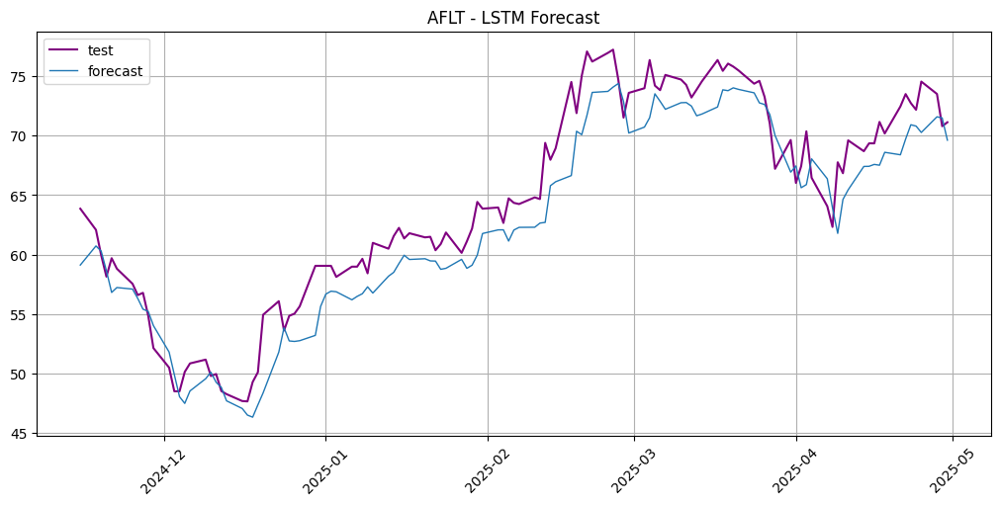

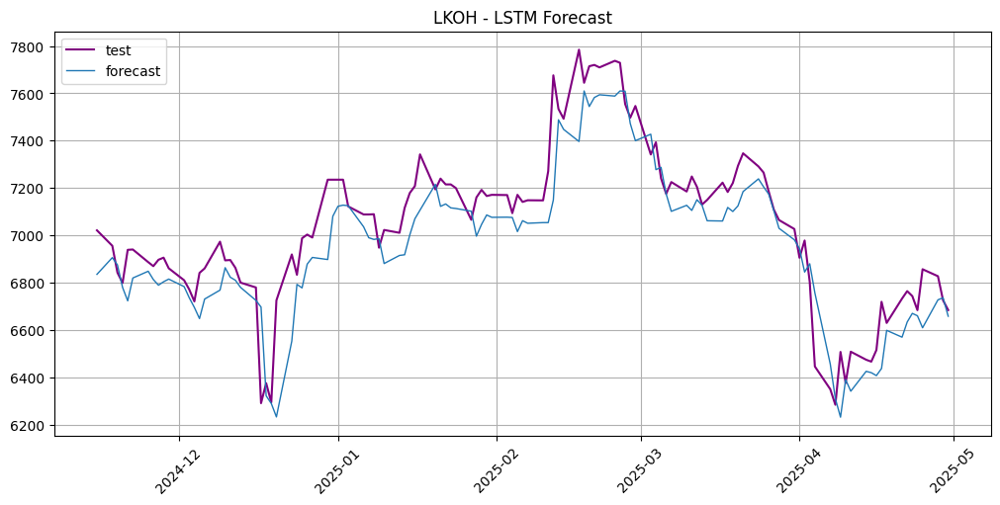

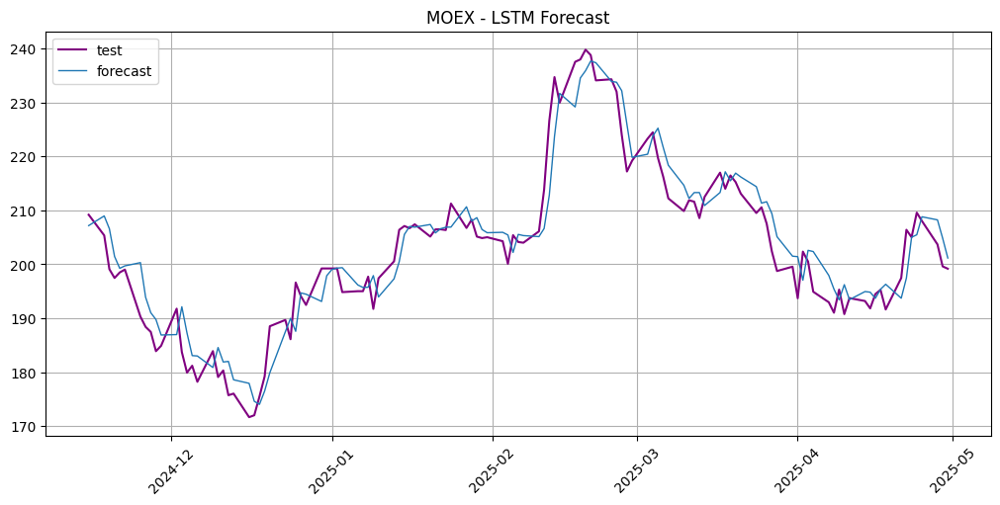

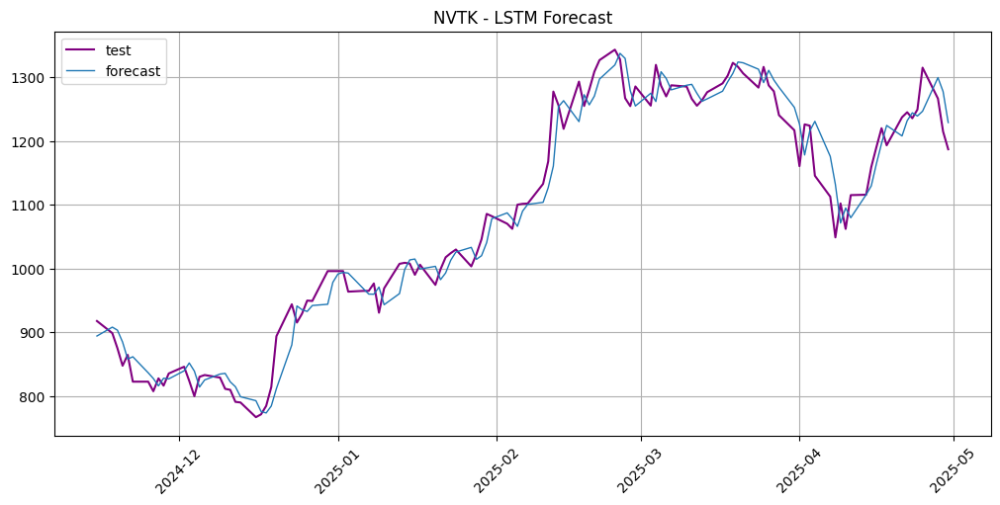

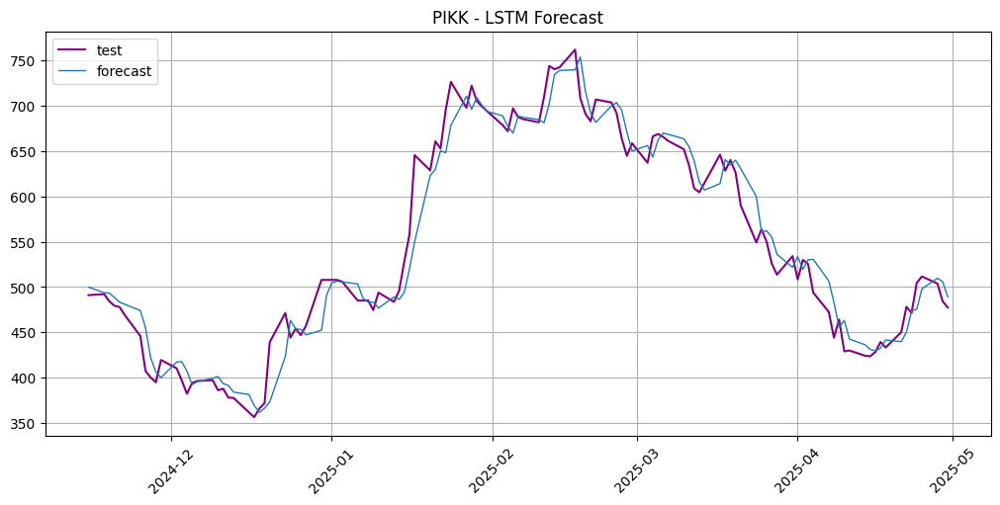

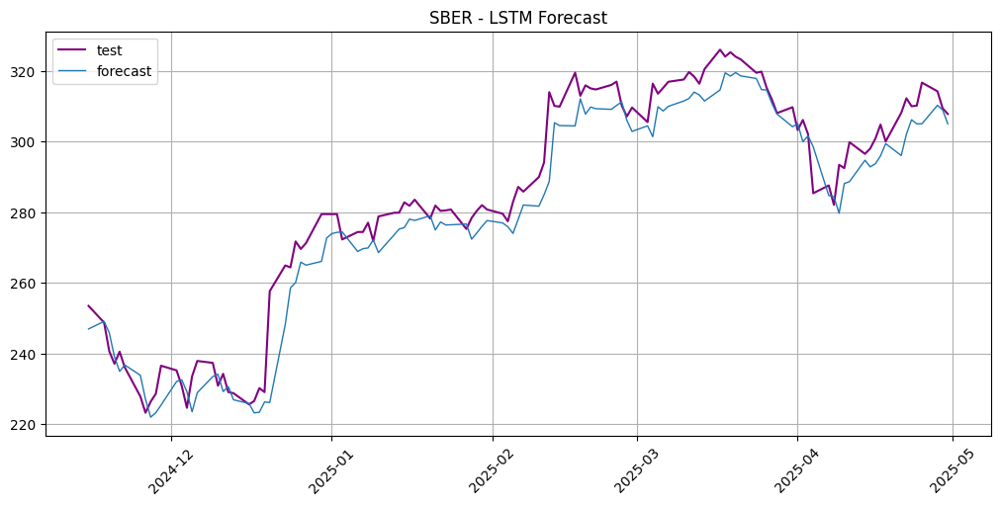

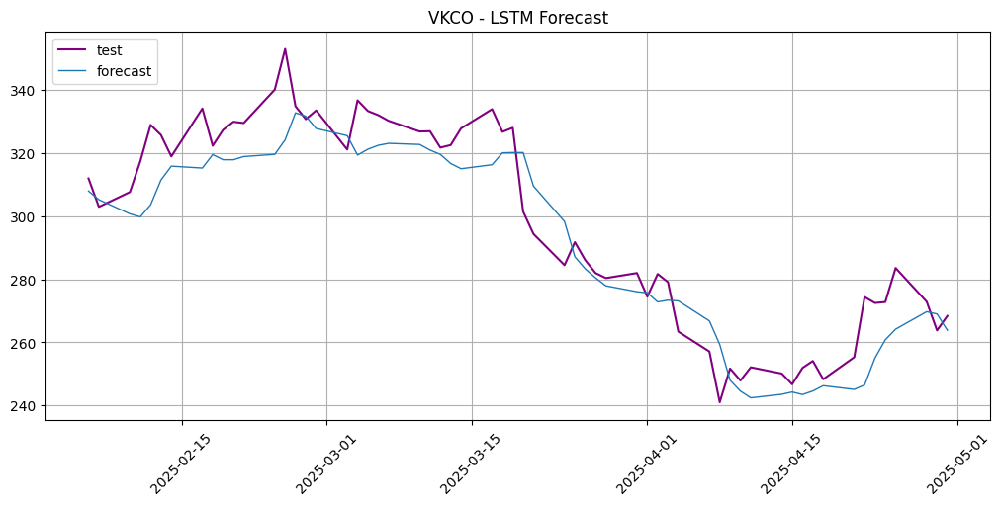

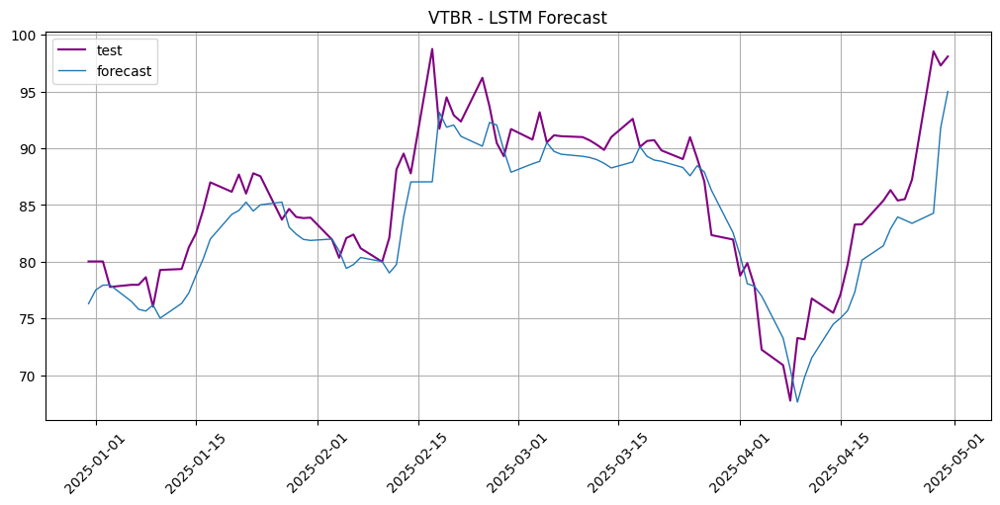

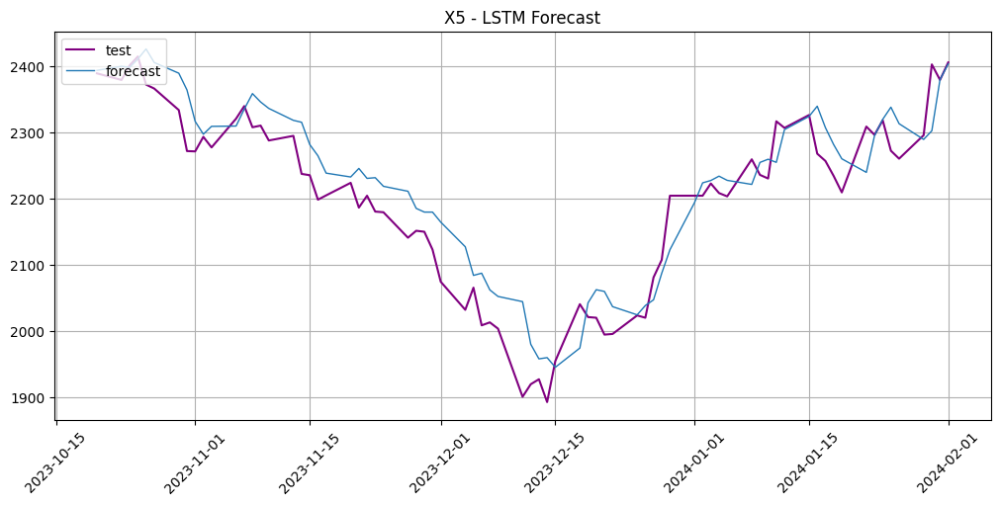

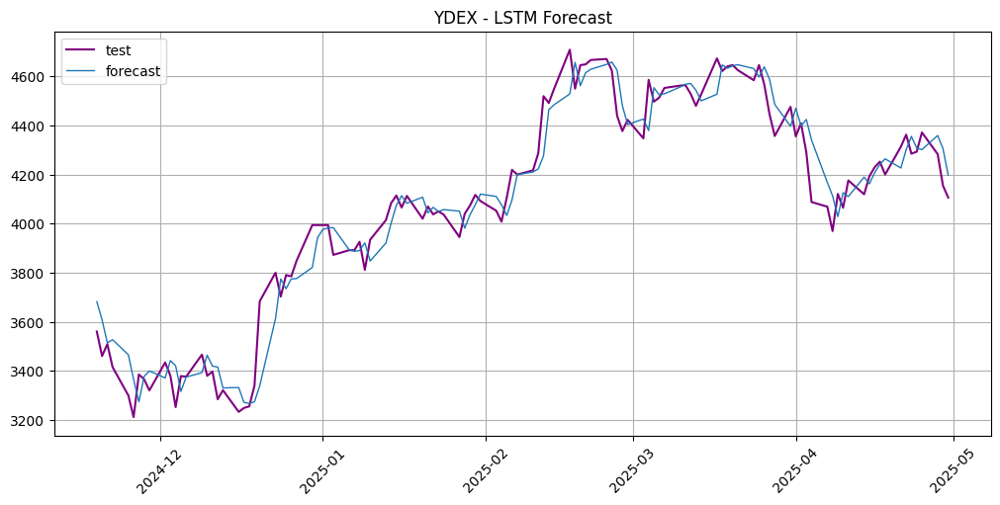


=== Итоговая таблица метрик LSTM ===


,MAE,MAPE (%),RMSE,SMAPE (%),DA (%),Forecast time (s)
AFLT,2.301,3.551,2.736,3.635,46.610,4.772
LKOH,111.663,1.585,148.305,1.601,43.220,4.484
MOEX,3.566,1.773,4.501,1.767,44.915,4.704
NVTK,25.502,2.366,32.687,2.367,46.610,4.694
PIKK,17.054,3.209,23.293,3.216,51.695,4.667
SBER,5.802,2.049,7.431,2.081,41.525,4.591
VKCO,9.392,3.139,11.625,3.185,44.068,4.325
VTBR,2.680,3.124,3.529,3.194,50.000,4.612
X5,39.610,1.836,49.187,1.819,45.946,4.356
YDEX,72.060,1.809,93.816,1.806,41.379,4.414


In [90]:
results = {}

for ticker, (full_ts, train_ts, test_ts) in series.items():
    #print(f"\n--- Тикер {ticker} ---")
    
    # Инициализируем и 
    df_test = test_ts.to_pandas(flatten=False)
    test_size = df_test.shape[0]

    model = CustomLSTMModel()

    # Обучаем DLinear модель и выполняем прогноз на test_size точек и замеряем время
    start_time = time.time()
    model.fit(train_ts)
    forecast_ts = model.forecast(full_ts, prediction_size=test_size)
    end_time = time.time()
    forecast_time = (end_time - start_time) / test_size  # Время в секундах на один прогноз
    
    # Собираем прогноз и реальные значения
    df_pred = forecast_ts.to_pandas(flatten=True)
    df_true = test_ts.to_pandas(flatten=True)
    
    y_true = df_true["target"].values
    y_pred = df_pred["target"].values

    # Считаем метрики
    mae_v   = MAE()(test_ts, forecast_ts)
    mape_v  = MAPE()(test_ts, forecast_ts)
    rmse_v  = RMSE()(test_ts, forecast_ts)
    smape_v = SMAPE()(test_ts, forecast_ts)
    da_v = directional_accuracy(y_true, y_pred)
    
    # Сохраняем метрики
    results[ticker] = {
        "MAE": mae_v[ticker],
        "MAPE (%)": mape_v[ticker],
        "RMSE": rmse_v[ticker],
        "SMAPE (%)": smape_v[ticker],
        "DA (%)": da_v,
        "Forecast time (s)": forecast_time
    }
    
    # Визуализируем результаты
    plot_forecast(forecast_ts, test_ts)
    plt.title(f'{ticker} - LSTM Forecast')

    plt.show()

# Собираем сводную таблицу метрик
df = pd.DataFrame.from_dict(results, orient="index")
df.loc["AVERAGE"] = df.mean(numeric_only=True)
df = df.round(3)

print("\n=== Итоговая таблица метрик LSTM ===")
display(df)

# Simple ML

## Lineral Regression

In [91]:
class CustomLinearModel(NonPredictionIntervalContextIgnorantAbstractModel):
    """
    ETNA-адаптация linear_sliding_walkforward (Lasso):
    - window_size, fit_intercept, alpha
    - даты → ordinals, StandardScaler внутри каждого шага
    - walk-forward с реальным y_true
    """
    def __init__(
        self,
        window_size: int = 2,
        fit_intercept: bool = False,
        alpha: float = 1.0,
    ):
        super().__init__()
        self.window_size = window_size
        self.fit_intercept = fit_intercept
        self.alpha = alpha
        self._freq = None
        self.segment = None
        self._train_index = None
        self._train_values = None

    def fit(self, ts: TSDataset) -> None:
        self._freq = ts.freq
        self.segment = ts.segments[0]
        df = ts.to_pandas(flatten=False)
        series = df[(self.segment, "target")]
        self._train_index = series.index
        self._train_values = series.values

    def forecast(self, ts: TSDataset, prediction_size: int) -> TSDataset:
        from sklearn.linear_model import Lasso

        df_full = ts.to_pandas(flatten=False)
        full_series = df_full[(self.segment, "target")]
        full_index = full_series.index
        full_values = full_series.values

        # все даты → ordinals
        ordinals = np.array([d.toordinal() for d in full_index]).reshape(-1, 1)

        w = len(self._train_values)
        # первые w + (пока unknown test) = w (train) + 0 placeholder
        hist_X = ordinals[:w]
        hist_y = self._train_values.tolist()

        preds = []
        for i in range(prediction_size):
            # вырезаем последние window_size точек
            start = max(0, len(hist_y) - self.window_size)
            X_win = hist_X[start : start + len(hist_y[start:])]
            y_win = np.array(hist_y[start:])

            scaler_X = StandardScaler().fit(X_win)
            scaler_y = StandardScaler().fit(y_win.reshape(-1, 1))
            Xs = scaler_X.transform(X_win)
            ys = scaler_y.transform(y_win.reshape(-1, 1)).ravel()

            model = Lasso(
                alpha=self.alpha,
                fit_intercept=self.fit_intercept,
                max_iter=10000,
            )
            model.fit(Xs, ys)

            next_ord = ordinals[w + i].reshape(1, -1)
            X_next_s = scaler_X.transform(next_ord)
            y_pred_s = model.predict(X_next_s)[0]
            y_pred = scaler_y.inverse_transform([[y_pred_s]])[0, 0]
            preds.append(y_pred)

            # обновляем историю
            hist_X = np.vstack([hist_X, next_ord])
            hist_y.append(full_values[w + i])

        future_index = full_index[w : w + prediction_size]
        df_forecast = pd.DataFrame({
            "timestamp": future_index,
            "segment":   [self.segment] * prediction_size,
            "target":    preds,
        })
        return TSDataset(df=df_forecast, freq=self._freq)

    def predict(self, ts: TSDataset, prediction_size: int) -> TSDataset:
        return self.forecast(ts, prediction_size)

    def get_model(self) -> str:
        return (
            f"CustomLinearModel(window_size={self.window_size}, "
            f"fit_intercept={self.fit_intercept}, alpha={self.alpha})"
        )

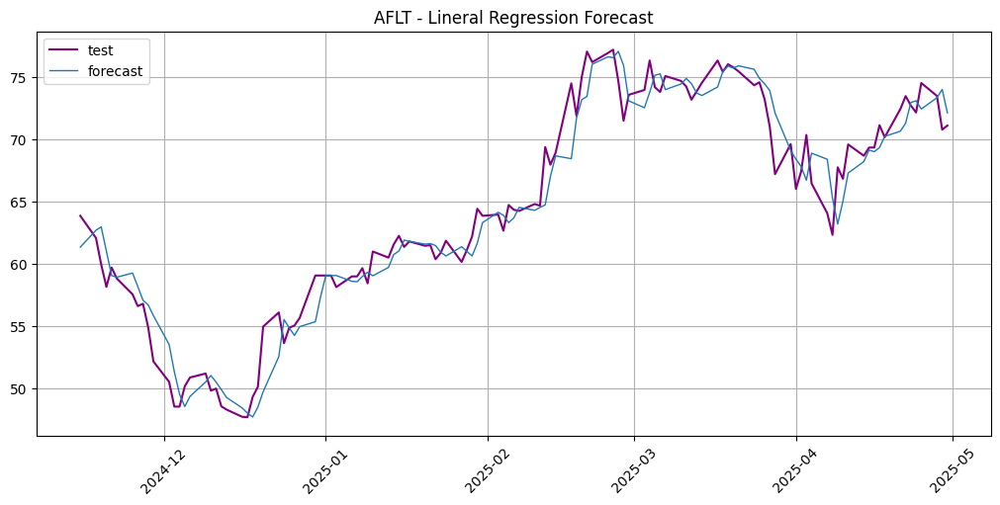

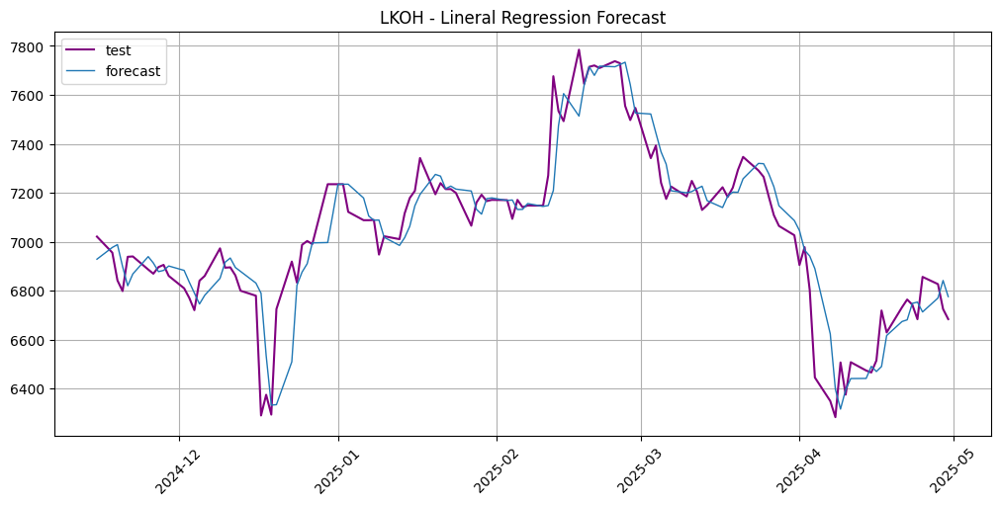

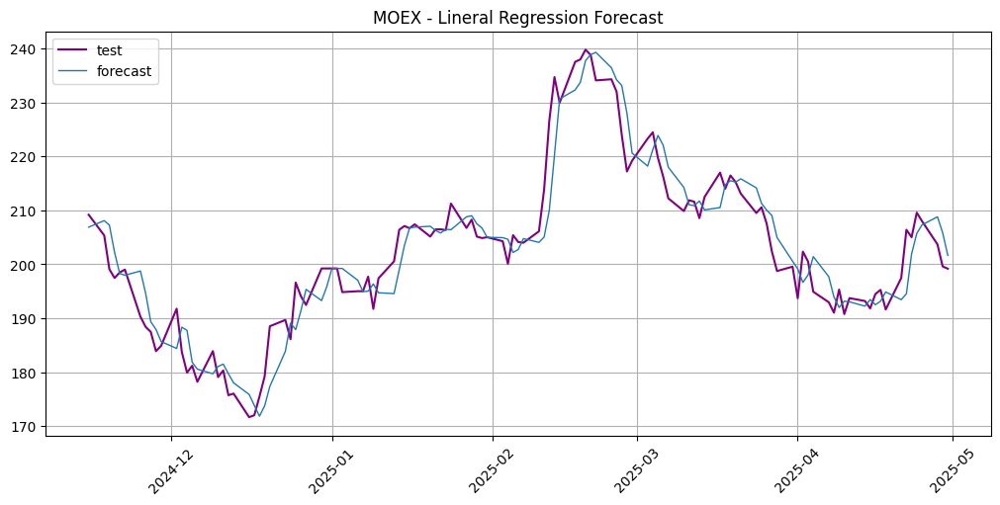

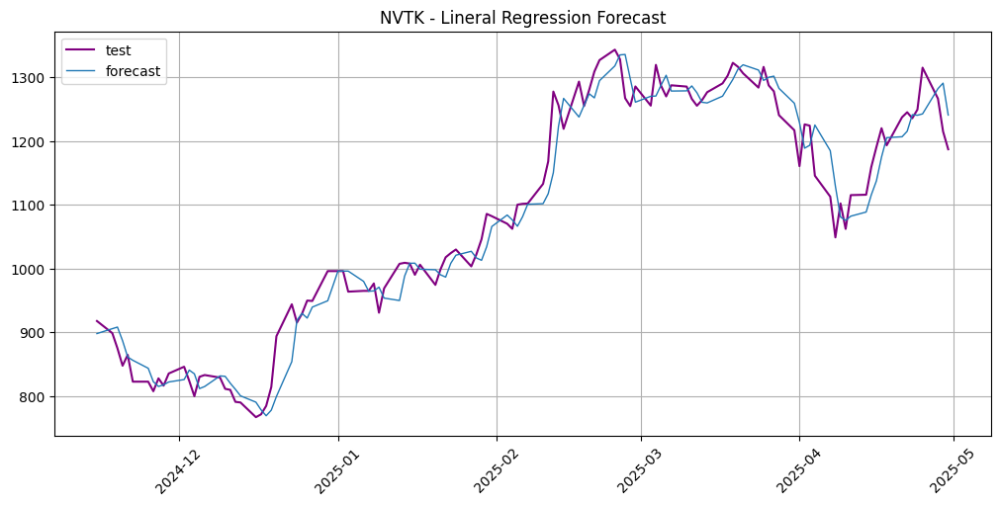

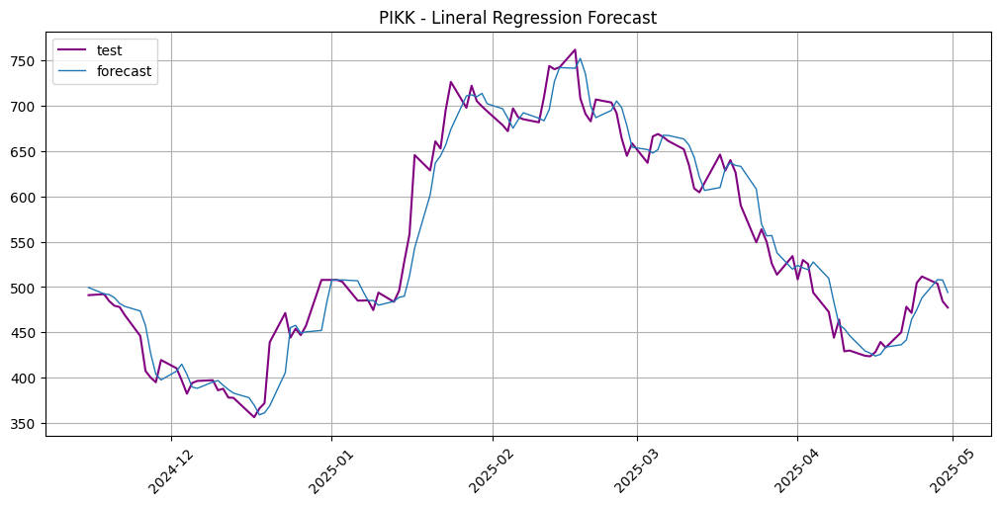

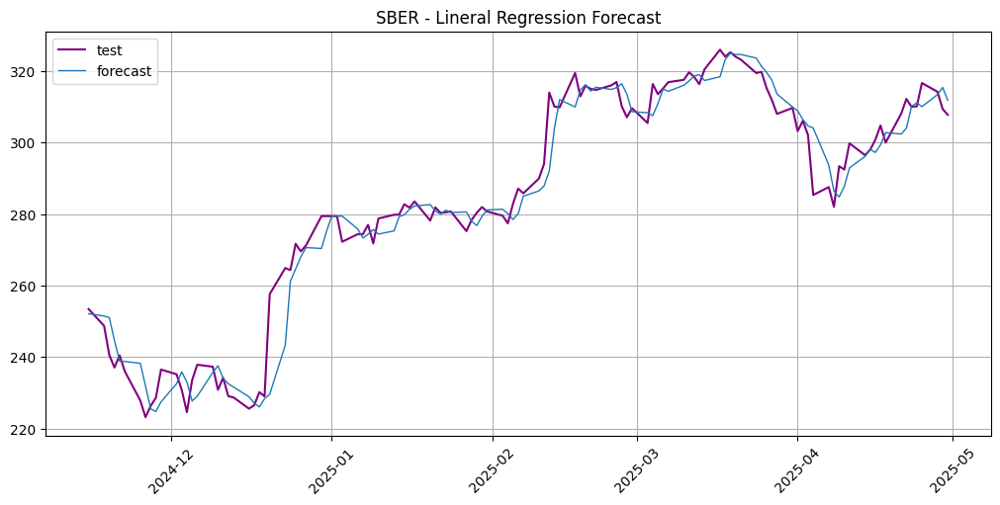

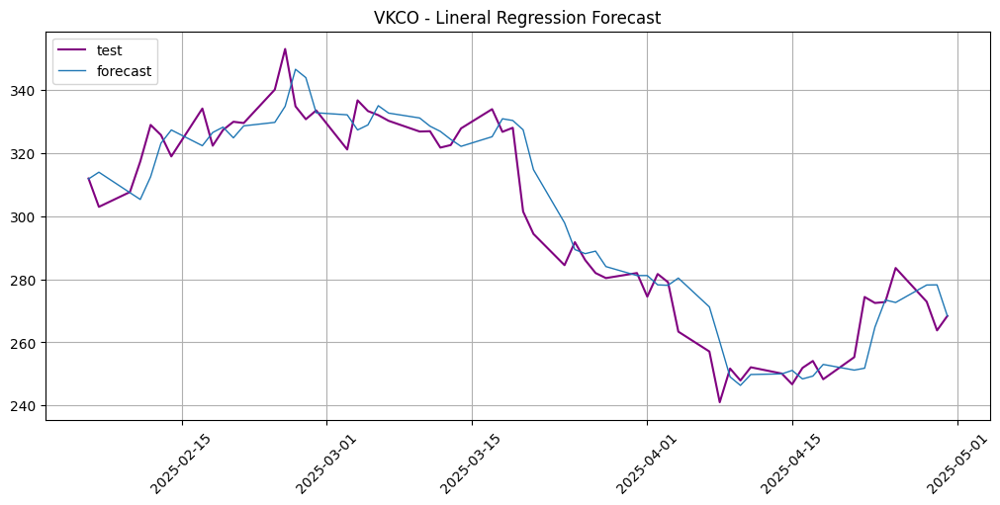

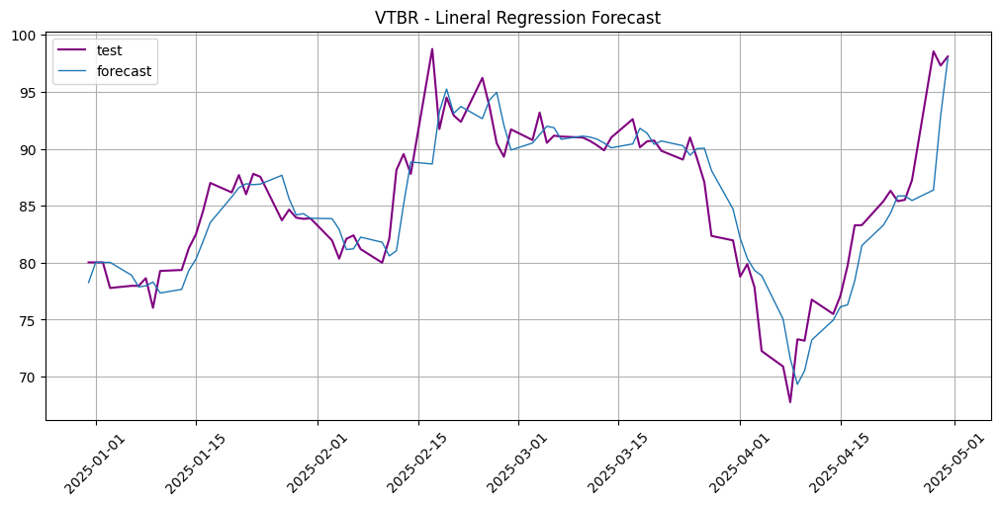

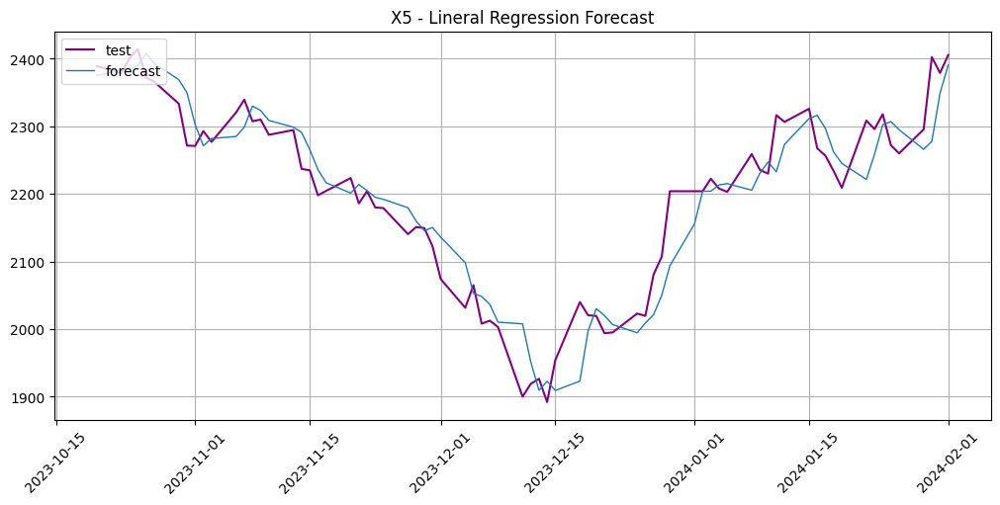

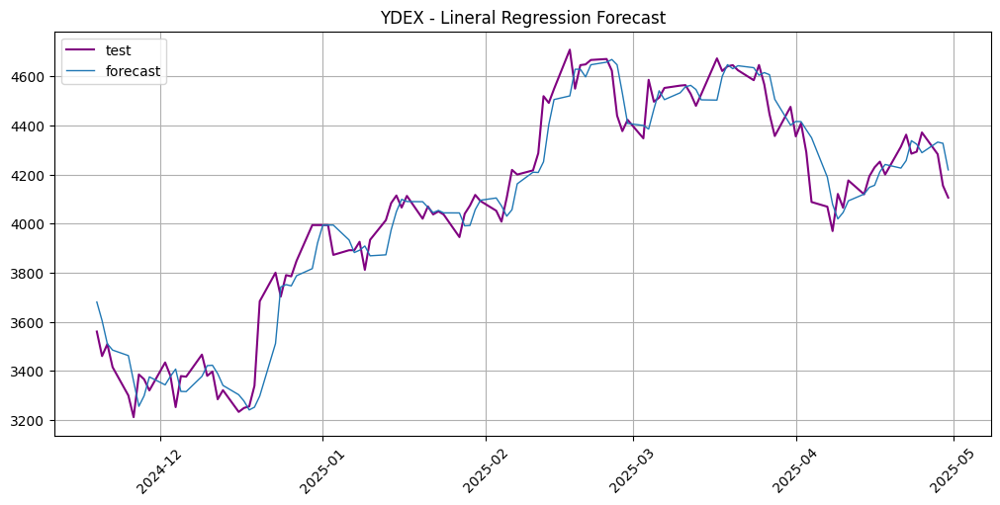


=== Итоговая таблица метрик Lineral Regression ===


,MAE,MAPE (%),RMSE,SMAPE (%),DA (%),Forecast time (s)
AFLT,1.407,2.227,1.922,2.232,43.220,0.002
LKOH,85.256,1.227,128.053,1.227,50.847,0.002
MOEX,3.615,1.785,4.712,1.788,44.915,0.002
NVTK,26.850,2.482,35.065,2.492,46.610,0.002
PIKK,18.093,3.375,24.908,3.393,58.475,0.002
SBER,4.090,1.484,6.050,1.492,47.458,0.002
VKCO,6.983,2.365,9.374,2.350,38.983,0.002
VTBR,2.015,2.378,2.887,2.393,48.837,0.002
X5,33.040,1.514,42.718,1.517,45.946,0.002
YDEX,74.107,1.857,99.506,1.862,50.862,0.002


In [94]:
results = {}

for ticker, (full_ts, train_ts, test_ts) in series.items():
    #print(f"\n--- Тикер {ticker} ---")
    
    # Инициализируем и 
    df_test = test_ts.to_pandas(flatten=False)
    test_size = df_test.shape[0]

    model = CustomLinearModel()

    # Обучаем DLinear модель и выполняем прогноз на test_size точек и замеряем время
    start_time = time.time()
    model.fit(train_ts)
    forecast_ts = model.forecast(full_ts, prediction_size=test_size)
    end_time = time.time()
    forecast_time = (end_time - start_time) / test_size  # Время в секундах на один прогноз
    
    # Собираем прогноз и реальные значения
    df_pred = forecast_ts.to_pandas(flatten=True)
    df_true = test_ts.to_pandas(flatten=True)
    
    y_true = df_true["target"].values
    y_pred = df_pred["target"].values

    # Считаем метрики
    mae_v   = MAE()(test_ts, forecast_ts)
    mape_v  = MAPE()(test_ts, forecast_ts)
    rmse_v  = RMSE()(test_ts, forecast_ts)
    smape_v = SMAPE()(test_ts, forecast_ts)
    da_v = directional_accuracy(y_true, y_pred)
    
    # Сохраняем метрики
    results[ticker] = {
        "MAE": mae_v[ticker],
        "MAPE (%)": mape_v[ticker],
        "RMSE": rmse_v[ticker],
        "SMAPE (%)": smape_v[ticker],
        "DA (%)": da_v,
        "Forecast time (s)": forecast_time
    }
    
    # Визуализируем результаты
    plot_forecast(forecast_ts, test_ts)
    plt.title(f'{ticker} - Lineral Regression Forecast')

    plt.show()

# Собираем сводную таблицу метрик
df = pd.DataFrame.from_dict(results, orient="index")
df.loc["AVERAGE"] = df.mean(numeric_only=True)
df = df.round(3)

print("\n=== Итоговая таблица метрик Lineral Regression ===")
display(df)

## K-NN

In [96]:
class CustomKNNModel(NonPredictionIntervalContextIgnorantAbstractModel):
    """
    ETNA-адаптация knn_walkforward_best:
    Walk-forward KNN с полной историей и StandardScaler.
    """
    def __init__(
        self,
        n_neighbors: int = 3,
        metric: str = 'minkowski',
        p: int = 3,
        weights: str = 'distance',
        algorithm: str = 'auto',
        leaf_size: int = 20,
    ):
        super().__init__()
        self.n_neighbors = n_neighbors
        self.metric = metric
        self.p = p
        self.weights = weights
        self.algorithm = algorithm
        self.leaf_size = leaf_size
        self._freq = None
        self.segment = None
        self._scaler = StandardScaler()
        self._history_X = None
        self._history_y = None

    def fit(self, ts:TSDataset)->None:
        self._freq = ts.freq
        self.segment = ts.segments[0]
        df = ts.to_pandas(flatten=False)
        series = df[(self.segment,'target')]
        timestamps = series.index
        ordinals = np.array([d.toordinal() for d in timestamps]).reshape(-1,1)
        X = self._scaler.fit_transform(ordinals)
        y = series.values
        self._history_X = X.tolist()
        self._history_y = y.tolist()

    def forecast(self, ts:TSDataset, prediction_size:int)->TSDataset:
        df_full = ts.to_pandas(flatten=False)
        series = df_full[(self.segment,'target')]
        full_values = series.values
        full_index = series.index
        ordinals = np.array([d.toordinal() for d in full_index]).reshape(-1,1)
        scaled_full = self._scaler.transform(ordinals)
        n_train = len(self._history_y)
        future_index = full_index[n_train:n_train+prediction_size]
        history_X = np.array(self._history_X)
        history_y = np.array(self._history_y)
        preds = []
        for i in range(prediction_size):
            knn = KNeighborsRegressor(
                n_neighbors=self.n_neighbors,
                metric=self.metric,
                p=self.p,
                weights=self.weights,
                algorithm=self.algorithm,
                leaf_size=self.leaf_size,
                n_jobs=-1
            )
            knn.fit(history_X, history_y)
            x_next = scaled_full[n_train + i].reshape(1,-1)
            y_pred = knn.predict(x_next)[0]
            preds.append(y_pred)
            history_X = np.vstack([history_X, x_next])
            history_y = np.append(history_y, full_values[n_train+i])
        df_forecast = pd.DataFrame({'timestamp':future_index,'segment':[self.segment]*prediction_size,'target':preds})
        return TSDataset(df=df_forecast,freq=self._freq)

    def predict(self, ts:TSDataset, prediction_size:int)->TSDataset:
        return self.forecast(ts,prediction_size)

    def get_model(self)->str:
        return (
            f"CustomKNNModel(n_neighbors={self.n_neighbors},metric={self.metric},"+\
            f"p={self.p},weights={self.weights},algorithm={self.algorithm},leaf_size={self.leaf_size})"
        )

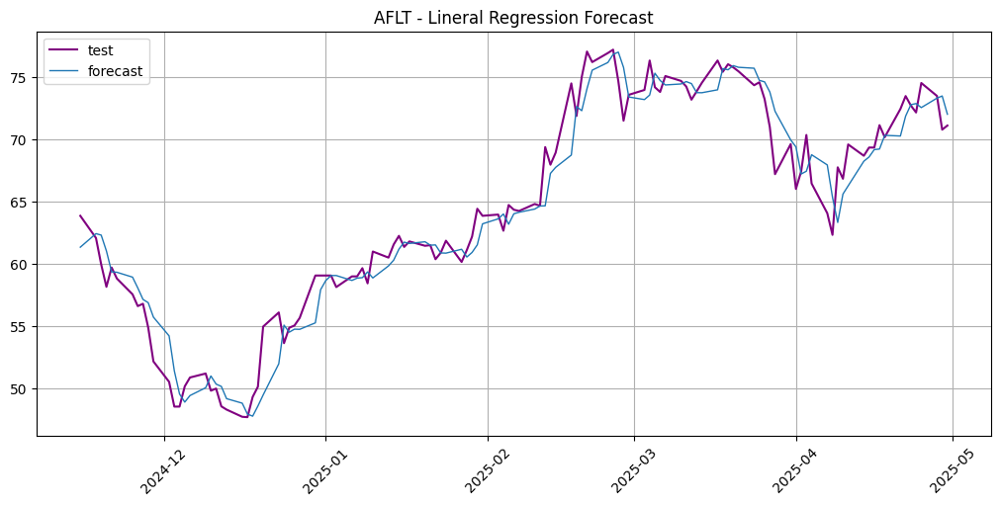

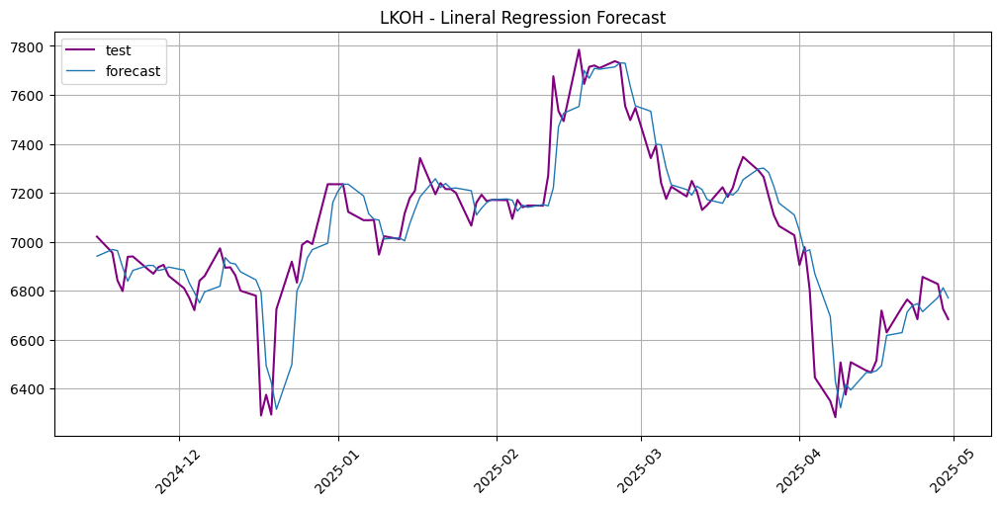

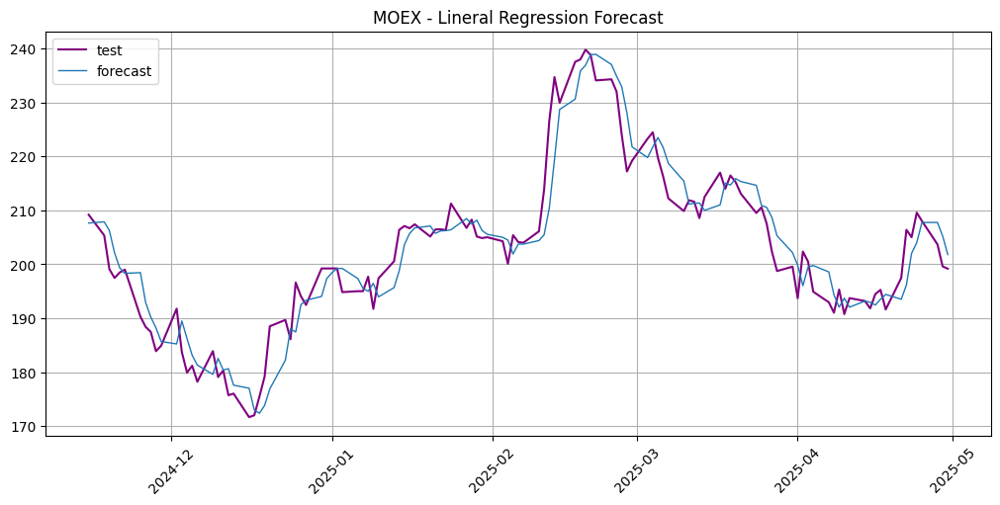

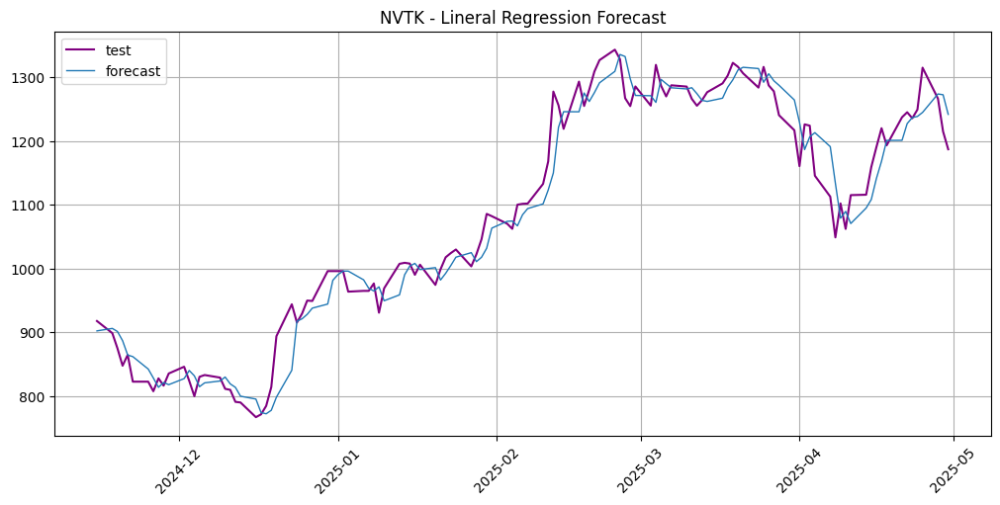

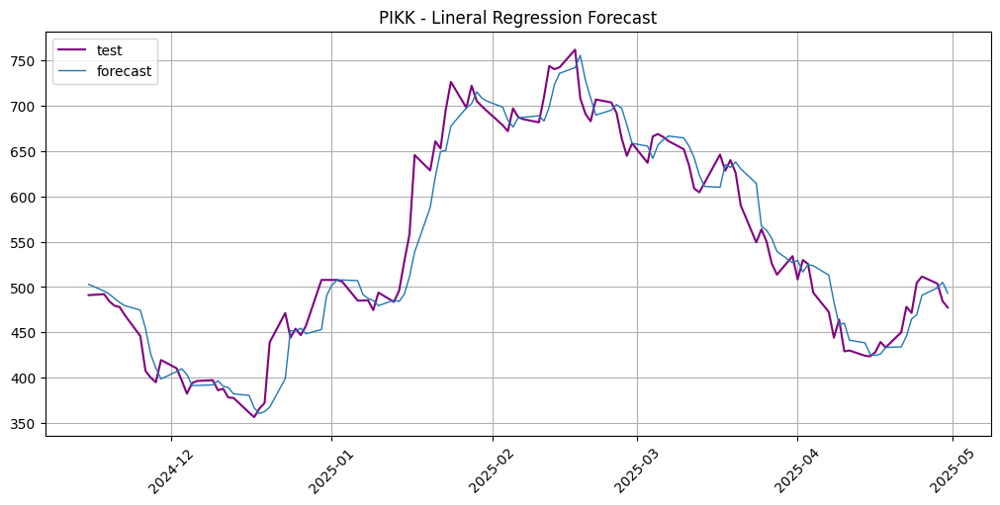

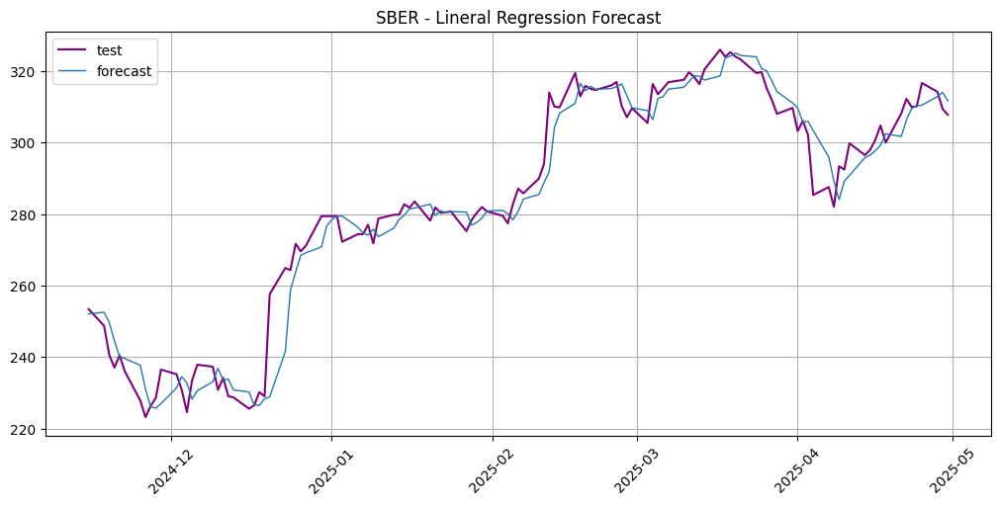

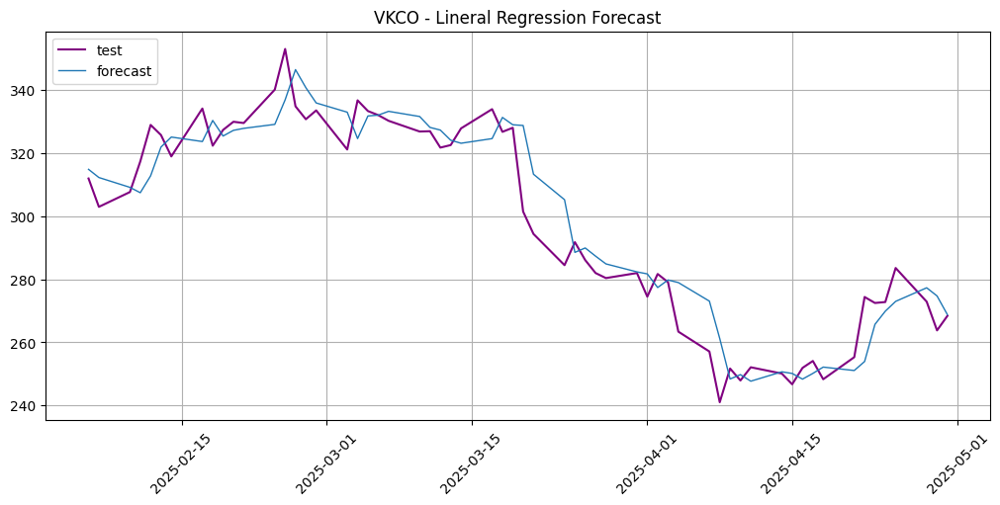

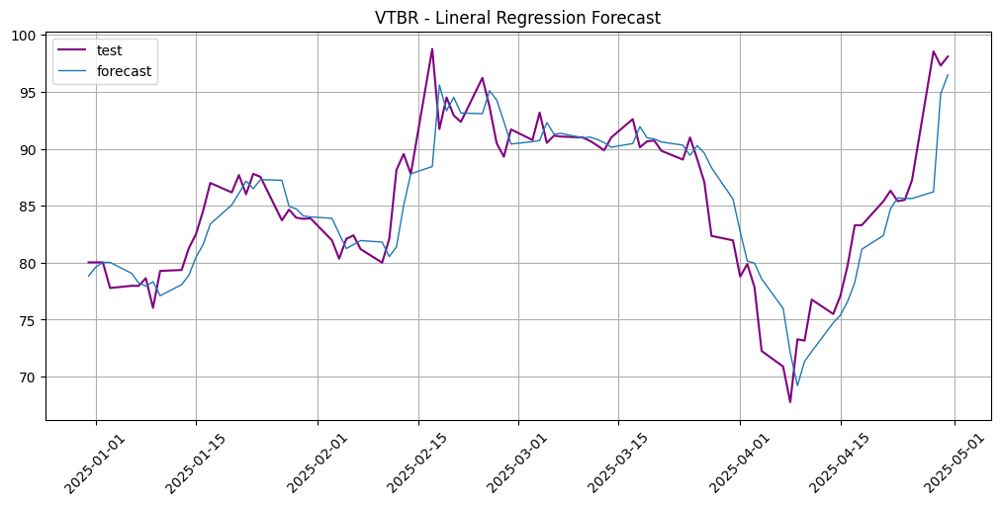

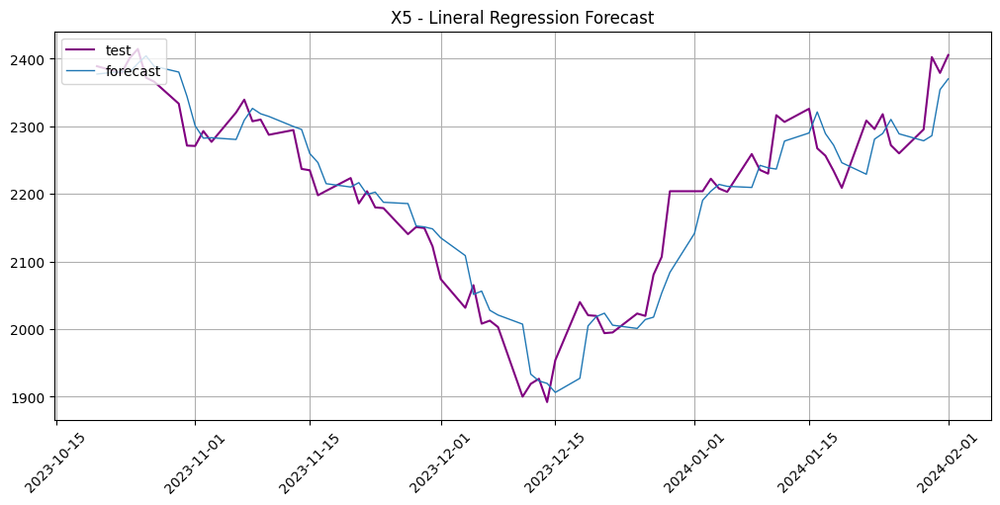

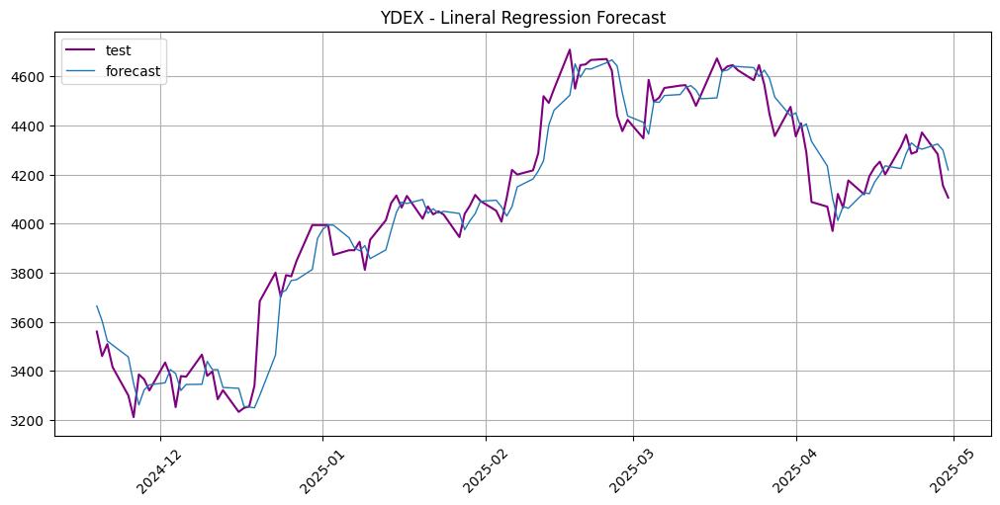


=== Итоговая таблица метрик Lineral Regression ===


,MAE,MAPE (%),RMSE,SMAPE (%),DA (%),Forecast time (s)
AFLT,1.404,2.226,1.920,2.231,43.220,0.019
LKOH,85.534,1.234,129.071,1.233,46.610,0.023
MOEX,3.590,1.772,4.673,1.775,44.068,0.019
NVTK,26.787,2.483,34.957,2.495,49.153,0.020
PIKK,18.614,3.464,25.653,3.485,50.847,0.022
SBER,4.207,1.524,6.151,1.533,48.305,0.019
VKCO,7.019,2.382,9.337,2.365,42.373,0.022
VTBR,2.087,2.465,2.959,2.479,50.000,0.021
X5,32.455,1.485,42.694,1.487,45.946,0.019
YDEX,75.136,1.879,101.151,1.885,43.103,0.021


In [99]:
results = {}

for ticker, (full_ts, train_ts, test_ts) in series.items():
    #print(f"\n--- Тикер {ticker} ---")
    
    # Инициализируем и 
    df_test = test_ts.to_pandas(flatten=False)
    test_size = df_test.shape[0]

    model = CustomKNNModel()

    # Обучаем DLinear модель и выполняем прогноз на test_size точек и замеряем время
    start_time = time.time()
    model.fit(train_ts)
    forecast_ts = model.forecast(full_ts, prediction_size=test_size)
    end_time = time.time()
    forecast_time = (end_time - start_time) / test_size  # Время в секундах на один прогноз
    
    # Собираем прогноз и реальные значения
    df_pred = forecast_ts.to_pandas(flatten=True)
    df_true = test_ts.to_pandas(flatten=True)
    
    y_true = df_true["target"].values
    y_pred = df_pred["target"].values

    # Считаем метрики
    mae_v   = MAE()(test_ts, forecast_ts)
    mape_v  = MAPE()(test_ts, forecast_ts)
    rmse_v  = RMSE()(test_ts, forecast_ts)
    smape_v = SMAPE()(test_ts, forecast_ts)
    da_v = directional_accuracy(y_true, y_pred)
    
    # Сохраняем метрики
    results[ticker] = {
        "MAE": mae_v[ticker],
        "MAPE (%)": mape_v[ticker],
        "RMSE": rmse_v[ticker],
        "SMAPE (%)": smape_v[ticker],
        "DA (%)": da_v,
        "Forecast time (s)": forecast_time
    }
    
    # Визуализируем результаты
    plot_forecast(forecast_ts, test_ts)
    plt.title(f'{ticker} - Lineral Regression Forecast')

    plt.show()

# Собираем сводную таблицу метрик
df = pd.DataFrame.from_dict(results, orient="index")
df.loc["AVERAGE"] = df.mean(numeric_only=True)
df = df.round(3)

print("\n=== Итоговая таблица метрик Lineral Regression ===")
display(df)